# Chapter 7.1. Classification of the Subgenres

In [1]:
import sys
import os
import shutil
import datetime
import re
import pandas as pd
from collections import Counter
sys.path.append(os.path.abspath("/home/jose/Dropbox/Doktorarbeit/"))
from reading_robot import load_data, tei2text, text2features, classify, process_labels, describe_data,feature_analysis, cull_data, st_tests, metadata2numbers, cluster, call_stylo, prepare_subcorpus
import scipy.stats as stats
import seaborn as sns
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt
%matplotlib inline
from shutil import copyfile
import numpy as np

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


In [2]:
ne_dir = "/home/jose/Dropbox/Doktorarbeit/novelasespanolas/"

In [3]:
wdir = "/home/jose/Dropbox/Doktorarbeit/ne_data/chap7_1/"

# 7.1.0. Getting Data

## Getting Files 

In [4]:
copyfile(ne_dir + "exported/tags_ling_pos_diff_mw_ord_ent_70000_T.parquet", wdir +"tags_ling_pos_diff_mw_ord_ent_70000_T.parquet")
copyfile(ne_dir+"metadata_beta-opt-obl-structure.csv", wdir + "metadata_beta-opt-obl-structure.csv")
copyfile(ne_dir+"metadata_recategorized.csv", wdir + "metadata_recategorized.csv")
copyfile(ne_dir+"exported/chapters_txt_freq_table_raw_10000_T.parquet", wdir + "chapters_txt_freq_table_raw_10000_T.parquet")
copyfile(ne_dir+"basic_metadata_chapters.csv", wdir + "basic_metadata_chapters.csv")
copyfile("/home/jose/Dropbox/Doktorarbeit/ne_data/chap5_1/labels_agreement.csv", wdir + "labels_agreement.csv")
         

'/home/jose/Dropbox/Doktorarbeit/ne_data/chap7_1/labels_agreement.csv'

## Getting Metadata

In [5]:
metadata_df = pd.read_csv(wdir+"metadata_beta-opt-obl-structure.csv",index_col=0,sep=",").fillna(0)
metadata_df.shape

(358, 177)

In [6]:
independent_sources_genre = ['subgenre.cligs', 'subgenre.lithist.MdLE', 'subgenre.lithist.HdLE', 'subgenre.edit.epublibre', 'subgenre.edit.amazon','subgenre.subtitle.bne','subgenre.cluster']

In [7]:
metadata_df["number.sources"] = 0
for index, row in metadata_df.iterrows():
    i = 0
    for independent_source_genre in independent_sources_genre:

        if row[independent_source_genre] != 0:
            i += 1
    metadata_df.loc[index,"number.sources"] = i
    

In [8]:
metadata_df[independent_sources_genre+["number.sources"]]

,subgenre.cligs,subgenre.lithist.MdLE,subgenre.lithist.HdLE,subgenre.edit.epublibre,subgenre.edit.amazon,subgenre.subtitle.bne,subgenre.cluster,number.sources
ne0001,"naturalist,sentimental,social,realist",0,0,"Aventuras, Drama",Ficción contemporánea; Ficción clásica; Litera...,0,0,3
ne0002,"naturalist,social,realist",novela de tesis,0,Realista,"Ficción clásica, Bibliotecas, Libros escolares...",0,0,4
ne0003,"naturalist,social,spiritual,realist",novela espiritualista,0,Drama,"Ficción, Europea, Antologías; Ficción clásica;...",0,0,4
ne0004,"sentimental,social,spiritual,realist",novela espiritual,0,"Drama, Realista","Siglo XIX, Antigua y clásica; Ficción clásica;...",0,0,4
ne0005,"naturalist,realist,sentimental,social,spiritua...",novela espiritual,0,Realista,"Ficción clásica, Ficción contemporánea; Ficció...",0,0,4
ne0006,"naturalist,realist,sentimental,social,spiritua...",novela espiritual,0,Realista,"Ficción clásica; Europea, Antologías",0,0,4
ne0007,"naturalist,realist,social,erotic",novela naturalista,novela naturalista,Drama,"Ficción clásica ; Europea, Teatro ; Romántica,...",0,0,5
ne0008,"realist,social,erotic",novela erótica,0,0,Ficción clásica;,"novela, novela original",0,4
ne0009,"naturalist,realist,sentimental,social,bildungs...",novela naturalista,novela realista,Drama,"Ficción clásica; Ficción clásica, Ficción hist...",0,0,5
ne0010,"social,philosophical",0,0,0,Historia;,novela,0,3


In [9]:
reference_labels_df = pd.read_csv("/home/jose/Dropbox/Doktorarbeit/reading_robot/data/tokens-labels_semantic-labels.csv", sep="\t",index_col=False)
reference_labels_df.shape



(276, 4)

In [10]:
independent_sources_genre

['subgenre.cligs',
 'subgenre.lithist.MdLE',
 'subgenre.lithist.HdLE',
 'subgenre.edit.epublibre',
 'subgenre.edit.amazon',
 'subgenre.subtitle.bne',
 'subgenre.cluster']

In [11]:
semantic_labels_df = process_labels.modelize_metadata_labels(metadata_df[independent_sources_genre], wdir, reference_labels_df, reference_column = "semantic_label_reference").fillna("")



In [12]:
semantic_labels_df.head()

,subgenre.cligs,subgenre.lithist.MdLE,subgenre.lithist.HdLE,subgenre.edit.epublibre,subgenre.edit.amazon,subgenre.subtitle.bne,subgenre.cluster
ne0001,"naturalista,sentimental,social,realista",,,"aventura,drama",ficción-literaria;ficción-literaria;ficción-li...,,
ne0002,"naturalista,social,realista",de tesis,,realista,"ficción-literaria,biblioteca,juvenil-infantil;...",,
ne0003,"naturalista,social,espiritual,realista",espiritual,,drama,"ficción,europea,antología;ficción-literaria;fi...",,
ne0004,"sentimental,social,espiritual,realista",espiritual,,"drama,realista","siglo-xix,clásico;ficción-literaria;antología;",,
ne0005,"naturalista,realista,sentimental,social,espiri...",espiritual,,realista,"ficción-literaria,ficción-literaria;ficción-li...",,


In [13]:
semantic_subgenres_lt = ["autobiografía","aventura","biografía","costumbrista","diálogo","educación","episodio nacional","erótica","espiritual","fantástico","filosófica","greguería","guerra","histórica","humor","memorias","modernista","naturalista","nivola","poética","psicológica","realista","social","bucólica","mono-diálogo","ficción-literaria"]

In [14]:
quantified_subgenre_df =  process_labels.count_labels_from_sources(semantic_subgenres_lt, semantic_labels_df, independent_sources_genre, wdir) 


subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenr

subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenr

subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía


subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenre.lithist.MdLE autobiografía
subgenre.lithist.HdLE autobiografía
subgenre.edit.epublibre autobiografía
subgenre.edit.amazon autobiografía
subgenre.subtitle.bne autobiografía
subgenre.cluster autobiografía
subgenre.cligs autobiografía
subgenr

subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura


subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
s

subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
subgenre.lithist.HdLE aventura
subgenre.edit.epublibre aventura
subgenre.edit.amazon aventura
subgenre.subtitle.bne aventura
subgenre.cluster aventura
subgenre.cligs aventura
subgenre.lithist.MdLE aventura
s

subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía

subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biografía
subgenre.subtitle.bne biografía
subgenre.cluster biografía
subgenre.cligs biografía
subgenre.lithist.MdLE biografía
subgenre.lithist.HdLE biografía
subgenre.edit.epublibre biografía
subgenre.edit.amazon biog

subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
s

subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgen

subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costumbrista
subgenre.subtitle.bne costumbrista
subgenre.cluster costumbrista
subgenre.cligs costumbrista
subgenre.lithist.MdLE costumbrista
subgenre.lithist.HdLE costumbrista
subgenre.edit.epublibre costumbrista
subgenre.edit.amazon costum

subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subge

subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subge

subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subgenre.cluster diálogo
subgenre.cligs diálogo
subgenre.lithist.MdLE diálogo
subgenre.lithist.HdLE diálogo
subgenre.edit.epublibre diálogo
subgenre.edit.amazon diálogo
subgenre.subtitle.bne diálogo
subge

subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educ

subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
subgenre.lithist.HdLE educación
subgenre.edit.epublibre educación
subgenre.edit.amazon educación
subgenre.subtitle.bne educación
subgenre.cluster educación
subgenre.cligs educación
subgenre.lithist.MdLE educación
s

subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional

subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional

subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacional
subgenre.cligs episodio nacional
subgenre.lithist.MdLE episodio nacional
subgenre.lithist.HdLE episodio nacional
subgenre.edit.epublibre episodio nacional
subgenre.edit.amazon episodio nacional
subgenre.subtitle.bne episodio nacional
subgenre.cluster episodio nacion

subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subge

subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subgenre.lithist.MdLE erótica
subgenre.lithist.HdLE erótica
subgenre.edit.epublibre erótica
subgenre.edit.amazon erótica
subgenre.subtitle.bne erótica
subgenre.cluster erótica
subgenre.cligs erótica
subge

subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espi

subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bne espiritual
subgenre.cluster espiritual
subgenre.cligs espiritual
subgenre.lithist.MdLE espiritual
subgenre.lithist.HdLE espiritual
subgenre.edit.epublibre espiritual
subgenre.edit.amazon espiritual
subgenre.subtitle.bn

subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazo

subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fant

subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fantástico
subgenre.edit.amazon fantástico
subgenre.subtitle.bne fantástico
subgenre.cluster fantástico
subgenre.cligs fantástico
subgenre.lithist.MdLE fantástico
subgenre.lithist.HdLE fantástico
subgenre.edit.epublibre fant

subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filo

subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filosófica
subgenre.edit.amazon filosófica
subgenre.subtitle.bne filosófica
subgenre.cluster filosófica
subgenre.cligs filosófica
subgenre.lithist.MdLE filosófica
subgenre.lithist.HdLE filosófica
subgenre.edit.epublibre filo

subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster gr

subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguerí

subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería
subgenre.lithist.MdLE greguería
subgenre.lithist.HdLE greguería
subgenre.edit.epublibre greguería
subgenre.edit.amazon greguería
subgenre.subtitle.bne greguería
subgenre.cluster greguería
subgenre.cligs greguería

subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.ed

subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs guerra
subgenre.lithist.MdLE guerra
subgenre.lithist.HdLE guerra
subgenre.edit.epublibre guerra
subgenre.edit.amazon guerra
subgenre.subtitle.bne guerra
subgenre.cluster guerra
subgenre.cligs g

subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica


subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon hist

subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster histórica
subgenre.cligs histórica
subgenre.lithist.MdLE histórica
subgenre.lithist.HdLE histórica
subgenre.edit.epublibre histórica
subgenre.edit.amazon histórica
subgenre.subtitle.bne histórica
subgenre.cluster hi

subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
sub

subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epublibre humor
subgenre.edit.amazon humor
subgenre.subtitle.bne humor
subgenre.cluster humor
subgenre.cligs humor
subgenre.lithist.MdLE humor
subgenre.lithist.HdLE humor
subgenre.edit.epubl

subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
s

subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
sub

subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memorias
subgenre.cluster memorias
subgenre.cligs memorias
subgenre.lithist.MdLE memorias
subgenre.lithist.HdLE memorias
subgenre.edit.epublibre memorias
subgenre.edit.amazon memorias
subgenre.subtitle.bne memor

subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista


subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazon modernista
subgenre.subtitle.bne modernista
subgenre.cluster modernista
subgenre.cligs modernista
subgenre.lithist.MdLE modernista
subgenre.lithist.HdLE modernista
subgenre.edit.epublibre modernista
subgenre.edit.amazo

subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalis

subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalis

subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalista
subgenre.edit.epublibre naturalista
subgenre.edit.amazon naturalista
subgenre.subtitle.bne naturalista
subgenre.cluster naturalista
subgenre.cligs naturalista
subgenre.lithist.MdLE naturalista
subgenre.lithist.HdLE naturalis

subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.M

subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.MdLE nivola
subgenre.lithist.HdLE nivola
subgenre.edit.epublibre nivola
subgenre.edit.amazon nivola
subgenre.subtitle.bne nivola
subgenre.cluster nivola
subgenre.cligs nivola
subgenre.lithist.M

subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subge

subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subge

subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subgenre.lithist.HdLE poética
subgenre.edit.epublibre poética
subgenre.edit.amazon poética
subgenre.subtitle.bne poética
subgenre.cluster poética
subgenre.cligs poética
subgenre.lithist.MdLE poética
subge

subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
su

subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
subgenre.lithist.MdLE psicológica
subgenre.lithist.HdLE psicológica
subgenre.edit.epublibre psicológica
subgenre.edit.amazon psicológica
subgenre.subtitle.bne psicológica
subgenre.cluster psicológica
subgenre.cligs psicológica
su

subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne reali

subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
s

subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
subgenre.subtitle.bne realista
subgenre.cluster realista
subgenre.cligs realista
subgenre.lithist.MdLE realista
subgenre.lithist.HdLE realista
subgenre.edit.epublibre realista
subgenre.edit.amazon realista
s

subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.

subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.edit.amazon social
subgenre.subtitle.bne social
subgenre.cluster social
subgenre.cligs social
subgenre.lithist.MdLE social
subgenre.lithist.HdLE social
subgenre.edit.epublibre social
subgenre.

subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
s

subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
subgenre.edit.epublibre bucólica
subgenre.edit.amazon bucólica
subgenre.subtitle.bne bucólica
subgenre.cluster bucólica
subgenre.cligs bucólica
subgenre.lithist.MdLE bucólica
subgenre.lithist.HdLE bucólica
sub

subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgen

subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo

subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
subgenre.lithist.HdLE mono-diálogo
subgenre.edit.epublibre mono-diálogo
subgenre.edit.amazon mono-diálogo
subgenre.subtitle.bne mono-diálogo
subgenre.cluster mono-diálogo
subgenre.cligs mono-diálogo
subgenre.lithist.MdLE mono-diálogo
s

subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literar

subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
subgenre.edit.amazon ficción-literaria
subgenre.subtitle.bne ficción-literaria
subgenre.cluster ficción-literaria
subgenre.cligs ficción-literaria
subgenre.lithist.MdLE ficción-literaria
subgenre.lithist.HdLE ficción-literaria
subgenre.edit.epublibre ficción-literaria
sub

In [15]:
quantified_subgenre_df.head()

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0002,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,2,1,0,0,1
ne0003,0,0,0,0,0,0,0,0,2,0,...,0,1,0,0,0,1,1,0,0,1
ne0004,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,2,1,0,0,1
ne0005,0,0,0,0,0,1,0,0,2,0,...,0,1,0,0,0,2,1,0,0,1


In [16]:
bool_quantified_subgenre_df = (quantified_subgenre_df > 0).astype(int)
bool_quantified_subgenre_df.head(15)

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0002,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,1,1,0,0,1
ne0003,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
ne0004,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,1,0,0,1
ne0005,0,0,0,0,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
ne0006,0,0,0,0,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
ne0007,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0008,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,1,0,0,1
ne0009,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0010,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [17]:
rel_quantified_subgenre_df = quantified_subgenre_df.divide(metadata_df["number.sources"],axis=0)
rel_quantified_subgenre_df.head(5)

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,0.333333,0,0,0,0,0,0,0,0,...,0,0.333333,0,0,0,0.333333,0.333333,0,0,0.333333
ne0002,0,0,0,0,0,0,0,0,0,0.25,...,0,0.25,0,0,0,0.5,0.25,0,0,0.25
ne0003,0,0,0,0,0,0,0,0,0.5,0,...,0,0.25,0,0,0,0.25,0.25,0,0,0.25
ne0004,0,0,0,0,0,0,0,0,0.5,0,...,0,0,0,0,0,0.5,0.25,0,0,0.25
ne0005,0,0,0,0,0,0.25,0,0,0.5,0,...,0,0.25,0,0,0,0.5,0.25,0,0,0.25


In [18]:
rel_quantified_subgenre_df.to_csv(ne_dir+"rel_quantified_labels.csv",sep="\t")

In [19]:
rel_quantified_subgenre_df.mean(axis=1)

ne0001    0.064103
ne0002    0.067308
ne0003    0.057692
ne0004    0.057692
ne0005    0.076923
ne0006    0.076923
ne0007    0.053846
ne0008    0.048077
ne0009    0.061538
ne0010    0.025641
ne0011    0.069231
ne0013    0.053846
ne0014    0.061538
ne0015    0.061538
ne0016    0.069231
ne0017    0.053846
ne0018    0.028846
ne0019    0.044872
ne0020    0.086538
ne0021    0.076923
ne0022    0.096154
ne0023    0.076923
ne0024    0.089744
ne0025    0.048077
ne0026    0.048077
ne0027    0.057692
ne0028    0.067308
ne0029    0.067308
ne0030    0.053846
ne0031    0.067308
            ...   
ne0360    0.019231
ne0361    0.076923
ne0362    0.038462
ne0363    0.038462
ne0364    0.038462
ne0365    0.038462
ne0370    0.051282
ne0373    0.030769
ne0378    0.048077
ne0379    0.067308
ne0380    0.028846
ne0381    0.038462
ne0382    0.057692
ne0384    0.096154
ne0385    0.038462
ne0387    0.053846
ne0388    0.051282
ne0390    0.076923
ne0391    0.025641
ne0392    0.025641
ne0393    0.076923
ne0394    0.

In [20]:
new_metadata_df = pd.concat([metadata_df, bool_quantified_subgenre_df], axis=1)
new_metadata_df = new_metadata_df.loc[(new_metadata_df["genre.analyzed"]=="novela")]
new_metadata_df.shape

(352, 204)

In [21]:
new_metadata_df["mean.prop.subgenres"] = rel_quantified_subgenre_df.mean(axis=1)

In [22]:
new_metadata_df.head()

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres
ne0001,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,1,0,0,0,1,1,0,0,1,0.064103
ne0002,ne0002,Galdos,Misericordia,1889,narrative,novela,realist,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.067308
ne0003,ne0003,Galdos,Nazarin,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.057692
ne0004,ne0004,Galdos,Halma,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,0,1,1,0,0,1,0.057692
ne0005,ne0005,Galdos,Tristana,1892,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.076923


In [23]:
metadata_recategorized_df = pd.read_csv(wdir+"metadata_recategorized.csv",sep="\t", index_col=0)
metadata_recategorized_df.head()

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,author.movement_ordinal,author.submovement_ordinal,authorText.relation_ordinal,litHist.brow_ordinal,setting.type_ordinal,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,end_ordinal,representation_ordinal
ne0001,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,1,4,0,NaN,1,3,3,2,4,2
ne0002,ne0002,Galdos,Misericordia,1889,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,2,0,0,2
ne0003,ne0003,Galdos,Nazarin,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,0.0,-,3,2,0,4,2
ne0004,ne0004,Galdos,Halma,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,2,2,4,2
ne0005,ne0005,Galdos,Tristana,1892,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,1,0,3,2


In [24]:
rel_new_metadata_df = new_metadata_df.copy()
linguistic_features_raw_lt = [ 'am.chars', 'am.divs', 'am.verses', 'am.sps', 'am.paragraphs', 'am.pds', 'am.numerals', 'am.puncts', 'am.blocks', 'am.chapters', 'am.shortStories', 'am.parts', 'am.sections', 'am.divisions', 'am.lg.poems', 'am.lg.stanzas', 'am.saids', 'am.narrative.ps', 'am.punctual.ss', 'len.abstract', 'am.fts', 'len.chapters.mean', 'len.chapters.std', 'len.chapters.median', 'len.chapters.iqr', 'am.conjunctions', 'am.determiners', 'am.nouns', 'am.verbs', 'am.adverbs', 'am.adjectives', 'am.adpositions', 'am.punctuations', 'am.pronouns', 'am.dates', 'am.numbers', 'am.interjections', 'am.ne.persons', 'am.ne.organizations', 'am.ne.locations', 'am.ne.others', 'am.ss', 'len.ss.mean', 'len.ss.std', 'len.ss.median', 'len.ss.iqr', 'am.ss.active.verbs.mean', 'am.ss.active.verbs.std', 'am.ss.active.verbs.median', 'am.ss.active.verbs.iqr', 'am.ws', 'am.ws.num.mean', 'am.ws.num.std', 'am.ws.num.median', 'am.ws.num.iqr', 'am.wnlex.noun.plants', 'am.wnlex.verb.communications', 'am.wnlex.noun.foods', 'am.wnlex.verb.possessions', 'am.wnlex.verb.cognitions', 'am.wnlex.noun.communications', 'am.wnlex.noun.states', 'am.wnlex.verb.statives', 'am.wnlex.noun.cognitions', 'am.wnlex.noun.times', 'am.wnlex.verb.bodys', 'am.wnlex.noun.persons', 'am.wnlex.adj.alls', 'am.wnlex.noun.quantitys', 'am.wnlex.noun.phenomenons', 'am.wnlex.verb.creations', 'am.wnlex.adj.perts', 'am.wnlex.adv.alls', 'am.wnlex.noun.processs', 'am.wnlex.noun.artifacts', 'am.wnlex.verb.perceptions', 'am.wnlex.noun.feelings', 'am.wnlex.verb.weathers', 'am.wnlex.noun.substances', 'am.wnlex.noun.shapes', 'am.wnlex.verb.competitions', 'am.wnlex.verb.motions', 'am.wnlex.noun.animals', 'am.wnlex.noun.acts', 'am.wnlex.noun.bodys', 'am.wnlex.noun.objects', 'am.wnlex.noun.motives', 'am.wnlex.verb.socials', 'am.wnlex.noun.groups', 'am.wnlex.verb.consumptions', 'am.wnlex.noun.possessions', 'am.wnlex.noun.Topss', 'am.wnlex.noun.relations', 'am.wnlex.noun.attributes', 'am.wnlex.verb.emotions', 'am.wnlex.noun.locations', 'am.wnlex.noun.events', 'am.wnlex.verb.contacts', 'am.wnlex.xxxs', 'am.wnlex.verb.changes']
for column in linguistic_features_raw_lt:
    rel_new_metadata_df[column] = rel_new_metadata_df[column] / rel_new_metadata_df["am.tokens"]


## Getting Features

In [25]:
tags_ling_pos_diff_mw_ord_ent_df = pd.read_parquet(wdir+"tags_ling_pos_diff_mw_ord_ent_70000_T.parquet").T
tags_ling_pos_diff_mw_ord_ent_df = tags_ling_pos_diff_mw_ord_ent_df.loc[new_metadata_df.index]
tags_ling_pos_diff_mw_ord_ent_df.head()


/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


,",@form_punctuation@pos",am.divs,1@person,am.verses,de@form_adposition@pos,am.sps,2@person,am.paragraphs,.@form_punctuation@pos,am.pds,...,formalizó@form_verb@pos,volvime@form_adjective@pos,pegadito@form_verb@pos,lavarán@form_verb@pos,abrumo@form_verb@pos,cestillos@form_noun@pos,glicina@form_noun@pos,patriarcalmente@form_adverb@pos,impeler@form_verb@pos,fumadora@form_noun@pos
ne0001,3448,41,1001,71,2797,0,678,2354,2801,1242,...,0,0,0,0,0,0,0,0,0,0
ne0002,8003,42,2935,0,4435,0,1713,1498,3105,1104,...,0,0,0,0,0,0,0,0,0,0
ne0003,6493,41,2875,0,3192,0,1305,1160,2552,851,...,0,0,0,0,0,0,0,0,0,0
ne0004,7411,45,3540,0,3753,0,1642,1272,3099,978,...,0,0,0,0,0,0,0,0,0,0
ne0005,4827,30,2870,0,2839,0,1461,556,2172,299,...,0,0,0,0,0,0,0,0,0,0


In [26]:
rel_tags_ling_pos_diff_mw_ord_ent_df = tags_ling_pos_diff_mw_ord_ent_df.divide(new_metadata_df["am.tokens"],axis=0)
rel_tags_ling_pos_diff_mw_ord_ent_df.head()

,",@form_punctuation@pos",am.divs,1@person,am.verses,de@form_adposition@pos,am.sps,2@person,am.paragraphs,.@form_punctuation@pos,am.pds,...,formalizó@form_verb@pos,volvime@form_adjective@pos,pegadito@form_verb@pos,lavarán@form_verb@pos,abrumo@form_verb@pos,cestillos@form_noun@pos,glicina@form_noun@pos,patriarcalmente@form_adverb@pos,impeler@form_verb@pos,fumadora@form_noun@pos
ne0001,0.064356,0.000765,0.018683,0.001325,0.052205,0.0,0.012655,0.043937,0.052280,0.023182,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0002,0.095511,0.000501,0.035028,0.000000,0.052929,0.0,0.020444,0.017878,0.037056,0.013176,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0003,0.100304,0.000633,0.044413,0.000000,0.049310,0.0,0.020160,0.017920,0.039423,0.013146,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0004,0.101035,0.000613,0.048261,0.000000,0.051165,0.0,0.022386,0.017341,0.042249,0.013333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0005,0.091833,0.000571,0.054601,0.000000,0.054011,0.0,0.027795,0.010578,0.041322,0.005688,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
log_rel_tags_ling_pos_diff_mw_ord_ent_df = text2features.calculate_log(rel_tags_ling_pos_diff_mw_ord_ent_df)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


In [28]:
log1000_rel_tags_ling_pos_diff_mw_ord_ent_df = text2features.calculate_log1000(rel_tags_ling_pos_diff_mw_ord_ent_df)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:179: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)/ np.log(10000)


## Getting Chapters

In [29]:
copyfile(ne_dir+"exported/chapters_txt_freq_table_raw_10000_T.parquet", wdir + "chapters_txt_freq_table_raw_10000_T.parquet")
copyfile(ne_dir+"basic_metadata_chapters.csv", wdir + "basic_metadata_chapters.csv")
copyfile(ne_dir+"exported/corpus_most_useful_features_chapters_T.parquet", wdir + "corpus_most_useful_features_chapters_T.parquet")


'/home/jose/Dropbox/Doktorarbeit/ne_data/chap7_1/corpus_most_useful_features_chapters_T.parquet'

In [30]:
chapters_df = pd.read_parquet(wdir+"chapters_txt_freq_table_raw_10000_T.parquet").T

In [31]:
chapters_df.head()

,",",.,de,la,y,que,el,en,a,los,...,cualidad,metiéndose,perfumado,rapaces,heredad,causar,boers,dictamen,plantado,cáliz
ne0001_chap1,97,91,94,78,47,30,50,40,29,20,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap10,85,77,69,54,70,26,34,27,38,23,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap11,119,96,88,47,59,40,61,38,40,47,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap12,148,111,106,95,91,84,65,49,74,31,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap13,94,67,85,40,44,27,39,30,16,21,...,0,0,0,0,0,0,0,0,0,0


In [32]:
anno_chapters_df = pd.read_parquet(wdir+"corpus_most_useful_features_chapters_T.parquet").T

In [33]:
anno_chapters_df

,1@person,",@form",2@person,de@form,abandonar@mariax,.@form,abatir@mariax,el@form,abeja@mariax,la@form,...,burlando@form,praderas@form,originalidad@form,separó@form,ordenar@form,feas@form,desesperados@form,bicho@form,económico@form,dichosos@form
ne0001_chap1,33,97,10,94,1,91,6,69,6,78,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap10,12,85,9,70,2,75,1,58,0,54,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap11,12,117,11,99,2,95,6,95,6,46,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap12,24,145,15,103,1,108,3,101,1,96,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap13,7,94,2,95,3,67,5,66,2,40,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap14,0,88,0,84,2,44,2,53,0,51,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap15,49,120,35,69,4,94,4,63,0,62,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap16,60,78,42,56,1,127,0,60,1,70,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap17,3,101,1,115,0,76,5,108,1,53,...,0,0,0,0,0,0,0,0,0,0
ne0001_chap18,59,129,21,99,2,83,2,84,1,66,...,0,0,0,0,0,0,0,0,0,0


In [34]:
basic_metadata_chapters_df = pd.read_csv(wdir+"basic_metadata_chapters.csv", sep="\t", index_col=0)

In [35]:
print(basic_metadata_chapters_df.shape)

(10780, 4)


In [36]:
basic_metadata_chapters_df.head()

,id_chapter,idno,length_text,length_chapters
0,ne0295_chap1,ne0295,11551,30
1,ne0295_chap2,ne0295,17250,30
2,ne0295_chap3,ne0295,14989,30
3,ne0295_chap4,ne0295,10453,30
4,ne0295_chap5,ne0295,19195,30


In [37]:
basic_metadata_chapters_df["length_text"].min()

21

In [38]:
metadata_chapters_df = pd.merge(new_metadata_df, basic_metadata_chapters_df, on="idno")
metadata_chapters_df.index = metadata_chapters_df["id_chapter"]
print(metadata_chapters_df.shape)
metadata_chapters_df.head()

(10306, 208)


,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,id_chapter,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,
ne0001_chap1,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap1,8771,31
ne0001_chap2,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap2,11578,31
ne0001_chap3,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap3,7239,31
ne0001_chap4,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap4,10652,31
ne0001_chap5,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap5,5840,31


In [39]:
metadata_chapters_df.sort_values(by="length_text")

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,id_chapter,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,
ne0186_chap17,ne0186,RPAyala,AMDG,1910,narrative,novela,bildungsroman,Spain,12320329.0,XX982844,...,0,1,1,0,0,1,0.084615,ne0186_chap17,70,37
ne0035_chap84,ne0035,Valle,Viva,1928,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,0,0,1,0.067308,ne0035_chap84,102,190
ne0030_chap137,ne0030,Valle,TiranoBanderas,1926,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,1,0,1,0.053846,ne0030_chap137,111,142
ne0030_chap5,ne0030,Valle,TiranoBanderas,1926,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,1,0,1,0.053846,ne0030_chap5,113,142
ne0035_chap173,ne0035,Valle,Viva,1928,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,0,0,1,0.067308,ne0035_chap173,119,190
ne0033_chap16,ne0033,Valle,Corte,1927,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,0,0,1,0.067308,ne0033_chap16,122,155
ne0033_chap1,ne0033,Valle,Corte,1927,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,0,0,1,0.067308,ne0033_chap1,122,155
ne0193_chap17,ne0193,Lanza,Santiago,1907,narrative,novela,bildungsroman,Spain,24624818.0,XX952949,...,0,0,1,0,0,1,0.057692,ne0193_chap17,129,22
ne0036_chap25,ne0036,Valle,Baza,1932,narrative,novela,historical,Spain,68936773.0,XX1055436,...,0,1,1,0,0,1,0.089744,ne0036_chap25,130,95


In [40]:
metadata_chapters_df.loc[metadata_chapters_df["id_chapter"]=="ne0217_chap19"]

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,id_chapter,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,


In [41]:
list_ids_chapters = [id_chapter for id_chapter in anno_chapters_df.index.tolist() if id_chapter in metadata_chapters_df.index.tolist() ]
list_ids_chapters[0:5]

['ne0001_chap1',
 'ne0001_chap10',
 'ne0001_chap11',
 'ne0001_chap12',
 'ne0001_chap13']

In [42]:
chapters_df = chapters_df.loc[list_ids_chapters]
chapters_df.shape

(10306, 10000)

In [43]:
anno_chapters_df = anno_chapters_df.loc[list_ids_chapters]
anno_chapters_df.shape

(10306, 8829)

In [44]:
metadata_chapters_df = metadata_chapters_df.loc[list_ids_chapters]
metadata_chapters_df.shape

(10306, 208)

In [45]:
rel_chapters_df = chapters_df.divide(metadata_chapters_df["length_text"],axis=0)
rel_chapters_df.head()

,",",.,de,la,y,que,el,en,a,los,...,cualidad,metiéndose,perfumado,rapaces,heredad,causar,boers,dictamen,plantado,cáliz
ne0001_chap1,0.011059,0.010375,0.010717,0.008893,0.005359,0.003420,0.005701,0.004560,0.003306,0.002280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap10,0.010881,0.009857,0.008833,0.006912,0.008961,0.003328,0.004352,0.003456,0.004864,0.002944,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap11,0.011478,0.009259,0.008488,0.004533,0.005691,0.003858,0.005883,0.003665,0.003858,0.004533,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap12,0.011371,0.008528,0.008144,0.007299,0.006991,0.006454,0.004994,0.003765,0.005685,0.002382,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap13,0.013243,0.009439,0.011975,0.005635,0.006199,0.003804,0.005495,0.004227,0.002254,0.002959,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
rel_chapters_df.shape

(10306, 10000)

In [47]:
del chapters_df

In [48]:
del rel_chapters_df

In [49]:
rel_anno_chapters_df = anno_chapters_df.divide(metadata_chapters_df["length_text"],axis=0)
rel_anno_chapters_df.head()

,1@person,",@form",2@person,de@form,abandonar@mariax,.@form,abatir@mariax,el@form,abeja@mariax,la@form,...,burlando@form,praderas@form,originalidad@form,separó@form,ordenar@form,feas@form,desesperados@form,bicho@form,económico@form,dichosos@form
ne0001_chap1,0.003762,0.011059,0.001140,0.010717,0.000114,0.010375,0.000684,0.007867,0.000684,0.008893,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap10,0.001536,0.010881,0.001152,0.008961,0.000256,0.009601,0.000128,0.007424,0.000000,0.006912,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap11,0.001157,0.011285,0.001061,0.009549,0.000193,0.009163,0.000579,0.009163,0.000579,0.004437,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap12,0.001844,0.011140,0.001152,0.007913,0.000077,0.008297,0.000230,0.007760,0.000077,0.007376,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0001_chap13,0.000986,0.013243,0.000282,0.013384,0.000423,0.009439,0.000704,0.009298,0.000282,0.005635,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
del anno_chapters_df

In [51]:
del rel_anno_chapters_df

# 7.1.2. Subgenres as Classes: Multi-Class Classification from Modal Subgenre

In [31]:
rel_tags_ling_pos_diff_mw_ord_ent_df.shape

(352, 7012)

In [32]:
new_metadata_df.shape

(352, 205)

In [33]:
new_metadata_df.loc[new_metadata_df["author.name"] == "Sender"]

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres
ne0124,ne0124,Sender,Iman,1930,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,0,1,1,0,0,0.064103
ne0125,ne0125,Sender,Crimen,1934,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,0,1,0,0,0,0.048077
ne0126,ne0126,Sender,Domingos,1932,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,1,1,0,0,1,0.057692
ne0213,ne0213,Sender,Contraataque,1938,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,0,0,0,0,1,0.038462
ne0292,ne0292,Sender,WittCanton,1935,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,0,0,0,0,1,0.038462
ne0293,ne0293,Sender,LugarHombre,1939,narrative,novela,historical,Spain,14776690.0,XX932757,...,0,0,0,0,1,1,0,0,1,0.046154


In [34]:
quantified_subgenre_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]]

ficción-literaria    1
histórica            3
guerra               1
erótica              0
Name: ne0292, dtype: object

In [35]:
quantified_subgenre_df.loc["ne0292"].max()

3

The modal subgenre of each novel is obtained:

In [36]:
quantified_subgenre_df

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0002,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,2,1,0,0,1
ne0003,0,0,0,0,0,0,0,0,2,0,...,0,1,0,0,0,1,1,0,0,1
ne0004,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,2,1,0,0,1
ne0005,0,0,0,0,0,1,0,0,2,0,...,0,1,0,0,0,2,1,0,0,1
ne0006,0,0,0,0,0,1,0,0,2,0,...,0,1,0,0,0,2,1,0,0,1
ne0007,0,0,0,0,0,0,0,1,0,0,...,0,3,0,0,0,1,1,0,0,1
ne0008,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,1,1,0,0,1
ne0009,0,0,0,0,0,1,0,0,0,0,...,0,2,0,0,0,2,1,0,0,1
ne0010,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [37]:
new_metadata_df

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres
ne0001,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,1,0,0,0,1,1,0,0,1,0.064103
ne0002,ne0002,Galdos,Misericordia,1889,narrative,novela,realist,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.067308
ne0003,ne0003,Galdos,Nazarin,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.057692
ne0004,ne0004,Galdos,Halma,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,0,1,1,0,0,1,0.057692
ne0005,ne0005,Galdos,Tristana,1892,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.076923
ne0006,ne0006,Galdos,Angel,1891,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.076923
ne0007,ne0007,Sawa,MujerMundo,1885,narrative,novela,erotic,Spain,59126336.0,XX1137561,...,1,0,0,0,1,1,0,0,1,0.053846
ne0008,ne0008,Zamacois,Enferma,1896,narrative,novela,erotic,Spain,51728159.0,XX1137688,...,0,0,0,0,1,1,0,0,1,0.048077
ne0009,ne0009,Galdos,Desheredada,1881,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,1,0,0,0,1,1,0,0,1,0.061538
ne0010,ne0010,Aparicio,Vicario,1905,narrative,novela,philosophical,Spain,4959739.0,XX950311,...,0,0,0,0,0,1,0,0,0,0.025641


In [38]:
new_metadata_df["modal.subgenre"] = ""
for index,row in quantified_subgenre_df.loc[:, ~quantified_subgenre_df.columns.isin(['ficción-literaria','bucólica','mono-diálogo'])].iterrows():
    if index in new_metadata_df.index.tolist():
        highest_value = row.sort_values(ascending=False)[0]
        modal_subgenre = row[row >= highest_value].sample(frac=1).index[0]
        new_metadata_df.loc[index,"modal.subgenre"] = modal_subgenre

In [39]:
new_metadata_df

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,modal.subgenre
ne0001,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,0,1,1,0,0,1,0.064103,realista
ne0002,ne0002,Galdos,Misericordia,1889,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.067308,realista
ne0003,ne0003,Galdos,Nazarin,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.057692,espiritual
ne0004,ne0004,Galdos,Halma,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.057692,espiritual
ne0005,ne0005,Galdos,Tristana,1892,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.076923,espiritual
ne0006,ne0006,Galdos,Angel,1891,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.076923,espiritual
ne0007,ne0007,Sawa,MujerMundo,1885,narrative,novela,erotic,Spain,59126336.0,XX1137561,...,0,0,0,1,1,0,0,1,0.053846,naturalista
ne0008,ne0008,Zamacois,Enferma,1896,narrative,novela,erotic,Spain,51728159.0,XX1137688,...,0,0,0,1,1,0,0,1,0.048077,erótica
ne0009,ne0009,Galdos,Desheredada,1881,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0,0,0,1,1,0,0,1,0.061538,naturalista
ne0010,ne0010,Aparicio,Vicario,1905,narrative,novela,philosophical,Spain,4959739.0,XX950311,...,0,0,0,0,1,0,0,0,0.025641,social


In [52]:
Counter(new_metadata_df["modal.subgenre"]).most_common()

[('realista', 74),
 ('histórica', 43),
 ('social', 41),
 ('naturalista', 32),
 ('filosófica', 25),
 ('humor', 21),
 ('memorias', 14),
 ('aventura', 14),
 ('educación', 14),
 ('modernista', 13),
 ('erótica', 12),
 ('diálogo', 9),
 ('guerra', 9),
 ('espiritual', 8),
 ('fantástico', 5),
 ('psicológica', 5),
 ('autobiografía', 5),
 ('biografía', 4),
 ('poética', 4),
 ('costumbrista', 3),
 ('nivola', 2),
 ('greguería', 1)]

In [39]:
len(set(new_metadata_df["modal.subgenre"]))

22

The classification multi-class test is run:

In [162]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df,
             sep = "\t", classes = ["modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [2000, 3000, 5000, 7000], text_representations = ["log","zscores","log10-zscores","tfidf-zscores"], typographies = [True],
             sampling_mode = "cross", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 10, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )

cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(294, 7004)
MFW 2000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['poca@form_determiner@pos', 'vivo@form_adjective@pos', 'público@form_noun@pos']
method used:	 LR
(294,)
(294, 2000)
undersampling None
undersampled (294,) (294, 2000) None
cross validation sampling of  modal.subgenre
more than 2 classes!
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.595757258717923, pvalue=0.0012983406354369904)
Class: 	 modal.subgenre
Scores:
 	 f1          0.351
rec         0.351
prec        0.351
f1_macro    0.272
f1_micro    0.351
dtype: float64
p-value:  0.0013
Baseline: 		 0.22
LR
0.13331292517006801
MFW 3000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['impaciencia@form_noun@pos', 'realmente@form_adverb@pos', '86@ord_ent']
method used:	 LR
(294,)
(294, 3000)
undersampling Non

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(294, 7004)
MFW 2000
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', '—@form_punctuation@pos']
The three last MFWs:  ['gritaba@form_verb@pos', 'encendido@form_verb@pos', 'piel@form_noun@pos']
method used:	 LR
(294,)
(294, 2000)
undersampling None
undersampled (294,) (294, 2000) None
cross validation sampling of  modal.subgenre
more than 2 classes!
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.082987537340441, pvalue=0.0006601604542284225)
Class: 	 modal.subgenre
Scores:
 	 f1          0.363
rec         0.363
prec        0.363
f1_macro    0.279
f1_micro    0.363
dtype: float64
p-value:  0.0007
Baseline: 		 0.22
LR
0.14531292517006802
MFW 3000
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', '—@form_punctuation@pos']
The three last MFWs:  ['arreglo@form_noun@pos', 'novio@form_noun@pos', 'flores@form_noun@pos']
method used:	 LR
(294,)
(294, 3000)
undersampling

In [ ]:
results_classification_multiclass_df.to_csv(wdir+"results_classification_multiclass.csv",sep="\t")

In [40]:
new_metadata_df.shape

(352, 206)

Largest prorpotion of a class in the data-set:

In [2]:
64/294

0.21768707482993196

In [41]:
results_classification_multiclass_df = pd.read_csv(wdir+"results_classification_multiclass.csv",sep="\t")

In [42]:
results_classification_multiclass_df

,Unnamed: 0,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
0,2,modal.subgenre,0.396,0.396,0.396,0.291,0.396,0.217687,0.178313,LR,log,5000,True,[0.35 0.38 0.42 0.5 0.29 0.32 0.41 0.37 0.48 ...,0.000017,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
1,3,modal.subgenre,0.384,0.384,0.384,0.299,0.384,0.217687,0.166313,LR,log,7000,True,[0.27 0.38 0.45 0.43 0.29 0.32 0.37 0.44 0.52 ...,0.000090,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
2,1,modal.subgenre,0.378,0.378,0.378,0.274,0.378,0.217687,0.160313,LR,log,3000,True,[0.22 0.22 0.35 0.5 0.43 0.32 0.41 0.41 0.48 ...,0.000660,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
3,9,modal.subgenre,0.372,0.372,0.372,0.276,0.372,0.217687,0.154313,LR,log10-zscores,3000,True,[0.24 0.31 0.39 0.43 0.29 0.32 0.44 0.48 0.44 ...,0.000165,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
4,8,modal.subgenre,0.363,0.363,0.363,0.279,0.363,0.217687,0.145313,LR,log10-zscores,2000,True,[0.22 0.25 0.35 0.47 0.43 0.32 0.41 0.48 0.41 ...,0.000660,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
5,10,modal.subgenre,0.363,0.363,0.363,0.255,0.363,0.217687,0.145313,LR,log10-zscores,5000,True,[0.22 0.25 0.42 0.5 0.25 0.21 0.41 0.52 0.48 ...,0.004237,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
6,0,modal.subgenre,0.351,0.351,0.351,0.272,0.351,0.217687,0.133313,LR,log,2000,True,[0.19 0.22 0.39 0.37 0.32 0.36 0.44 0.41 0.48 ...,0.001298,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
7,11,modal.subgenre,0.337,0.337,0.337,0.214,0.337,0.217687,0.119313,LR,log10-zscores,7000,True,[0.24 0.25 0.39 0.4 0.25 0.25 0.41 0.41 0.37 ...,0.000866,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
8,12,modal.subgenre,0.317,0.317,0.317,0.230,0.317,0.217687,0.099313,LR,tfidf-zscores,2000,True,[0.16 0.25 0.26 0.3 0.25 0.32 0.52 0.44 0.33 ...,0.013246,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."
9,7,modal.subgenre,0.313,0.313,0.313,0.206,0.313,0.217687,0.095313,LR,zscores,7000,True,[0.24 0.25 0.29 0.37 0.21 0.25 0.41 0.37 0.37 ...,0.002023,ne0001 realista\nne0002 realista\n...,294,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."


cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 6998)
MFW 5000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['246@ord_ent', 'industria@form_noun@pos', 'devolver@form_verb@pos']
method used:	 LR
(300,)
(300, 5000)
undersampling None
undersampled (300,) (300, 5000) None
standard sampling, bug coming!
The size of your classes is good.
* Sampling data in standard way
(225, 5000) (75, 5000) (225,) (75,)
Counter({'realista': 55, 'histórica': 32, 'social': 31, 'naturalista': 24, 'filosófica': 17, 'humor': 16, 'aventura': 11, 'memorias': 10, 'modernista': 10, 'educación': 10, 'erótica': 9}) Counter({'realista': 19, 'histórica': 11, 'social': 10, 'naturalista': 8, 'filosófica': 6, 'humor': 5, 'educación': 4, 'memorias': 3, 'erótica': 3, 'modernista': 3, 'aventura': 3})
[('histórica', 'histórica'), ('realista', 'realista'), ('educación', 'social'), ('memorias', 'modernista'), ('realista', 'realista'), ('naturalista

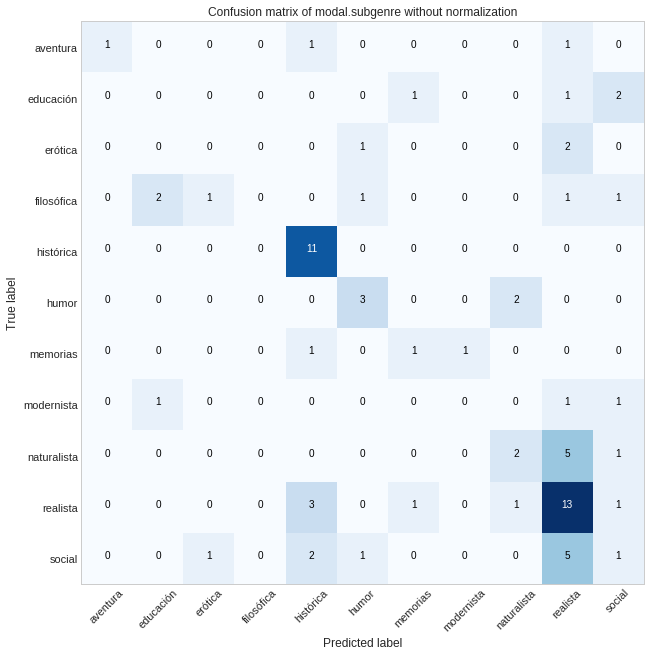

Normalized confusion matrix
[[0.33 0.   0.   0.   0.33 0.   0.   0.   0.   0.33 0.  ]
 [0.   0.   0.   0.   0.   0.   0.25 0.   0.   0.25 0.5 ]
 [0.   0.   0.   0.   0.   0.33 0.   0.   0.   0.67 0.  ]
 [0.   0.33 0.17 0.   0.   0.17 0.   0.   0.   0.17 0.17]
 [0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.6  0.   0.   0.4  0.   0.  ]
 [0.   0.   0.   0.   0.33 0.   0.33 0.33 0.   0.   0.  ]
 [0.   0.33 0.   0.   0.   0.   0.   0.   0.   0.33 0.33]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.25 0.62 0.12]
 [0.   0.   0.   0.   0.16 0.   0.05 0.   0.05 0.68 0.05]
 [0.   0.   0.1  0.   0.2  0.1  0.   0.   0.   0.5  0.1 ]]


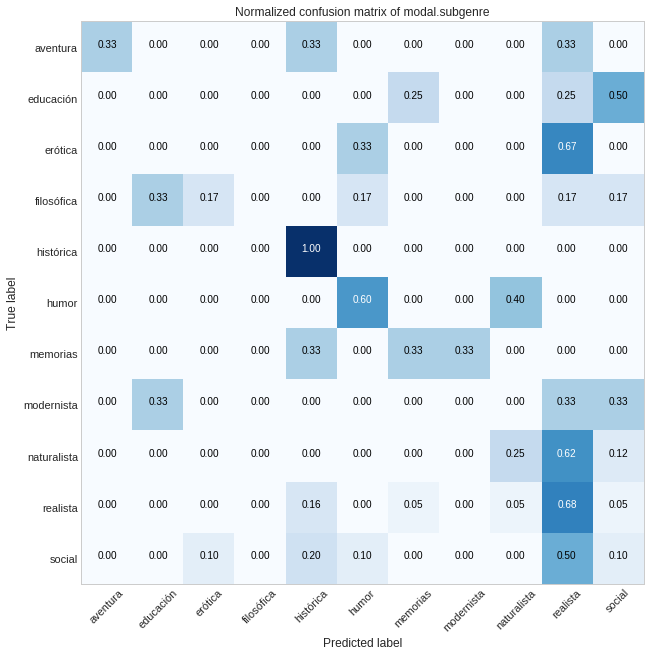

In [55]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df.loc[rel_tags_ling_pos_diff_mw_ord_ent_df.index.tolist()],
             sep = "\t", classes = ["modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5000], text_representations = ["log"], typographies = [True],
             sampling_mode = "standard", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 10, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )

## Further analysis with multi-class

In [42]:
new_metadata_df["alternative.modal.subgenre"] = ""
for index,row in quantified_subgenre_df.loc[:, :].iterrows():
    if index in new_metadata_df.index.tolist():
        highest_value = row.sort_values(ascending=False)[0]
        modal_subgenre = row[row >= highest_value].sample(frac=1).index[0]
    new_metadata_df.loc[index,"alternative.modal.subgenre"] = modal_subgenre


In [177]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df,
             sep = "\t", classes = ["alternative.modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5000], text_representations = ["log"], typographies = [True],
             sampling_mode = "cross", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )

cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(349, 7010)
MFW 5000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['sentando@form_verb@pos', '246@ord_ent', 'escuchando@form_verb@pos']
method used:	 LR
(349,)
(349, 5000)
undersampling None
undersampled (349,) (349, 5000) None
cross validation sampling of  alternative.modal.subgenre
more than 2 classes!
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.281401733584302, pvalue=0.42187014370969)
Class: 	 alternative.modal.subgenre
Scores:
 	 f1          0.286
rec         0.286
prec        0.286
f1_macro    0.105
f1_micro    0.286
dtype: float64
p-value:  0.4219
Baseline: 		 0.26
LR
0.025255014326647562
                        class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  alternative.modal.subgenre    0.286     0.286      0.286     0.105   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.286

In [178]:
results_classification_multiclass_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
0,alternative.modal.subgenre,0.286,0.286,0.286,0.105,0.286,0.260745,0.025255,LR,log,5000,True,"[0.31, 0.27]",0.42187,ne0001 ficción-literaria ne0002 ficción-...,349,2,1,"LogisticRegression(C=1.0, class_weight=None, d..."


cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

[('ficción-literaria', 'ficción-literaria'), ('ficción-literaria', 'ficción-literaria'), ('realista', 'realista'), ('realista', 'ficción-literaria'), ('realista', 'realista'), ('realista', 'realista'), ('autobiografía', 'ficción-literaria'), ('naturalista', 'ficción-literaria'), ('educación', 'ficción-literaria'), ('naturalista', 'ficción-literaria'), ('realista', 'ficción-literaria'), ('erótica', 'ficción-literaria'), ('realista', 'realista'), ('guerra', 'ficción-literaria'), ('realista', 'ficción-literaria'), ('humor', 'realista'), ('ficción-literaria', 'histórica'), ('histórica', 'ficción-literaria'), ('ficción-literaria', 'ficción-literaria'), ('memorias', 'histórica'), ('ficción-literaria', 'realista'), ('biografía', 'ficción-literaria'), ('naturalista', 'realista'), ('ficción-literaria', 'ficción-literaria'), ('ficción-literaria', 'ficción-literaria'), ('ficción-literaria', 'ficción-literaria'), ('psicológica', 'realista'), ('social', 'ficción-literaria'), ('erótica', 'ficción-li

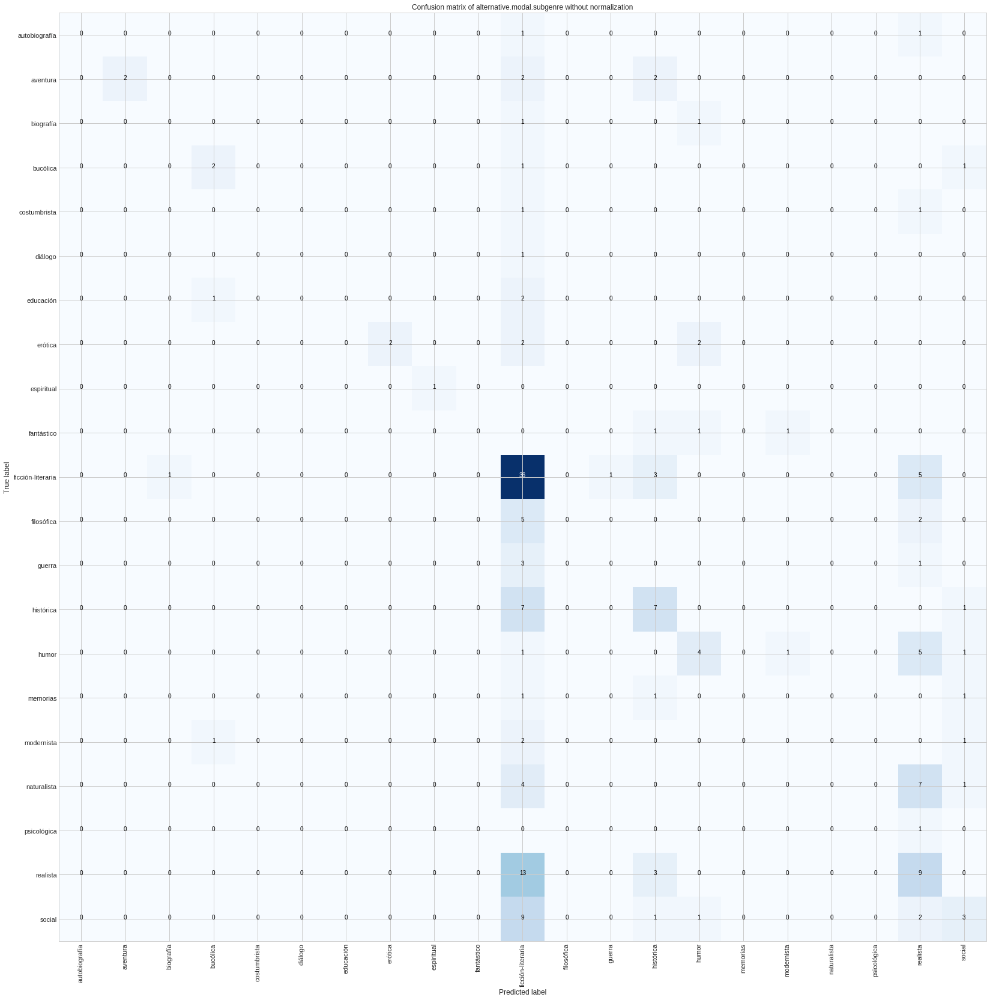

Normalized confusion matrix
[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.5  0.   0.   0.
  0.   0.   0.   0.   0.   0.5  0.  ]
 [0.   0.33 0.   0.   0.   0.   0.   0.   0.   0.   0.33 0.   0.   0.33
  0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.5  0.   0.   0.
  0.5  0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.5  0.   0.   0.   0.   0.   0.   0.25 0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.25]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.5  0.   0.   0.
  0.   0.   0.   0.   0.   0.5  0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.33 0.   0.   0.   0.   0.   0.   0.67 0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.33 0.   0.   0.33 0.   0.   0.
  0.33 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  

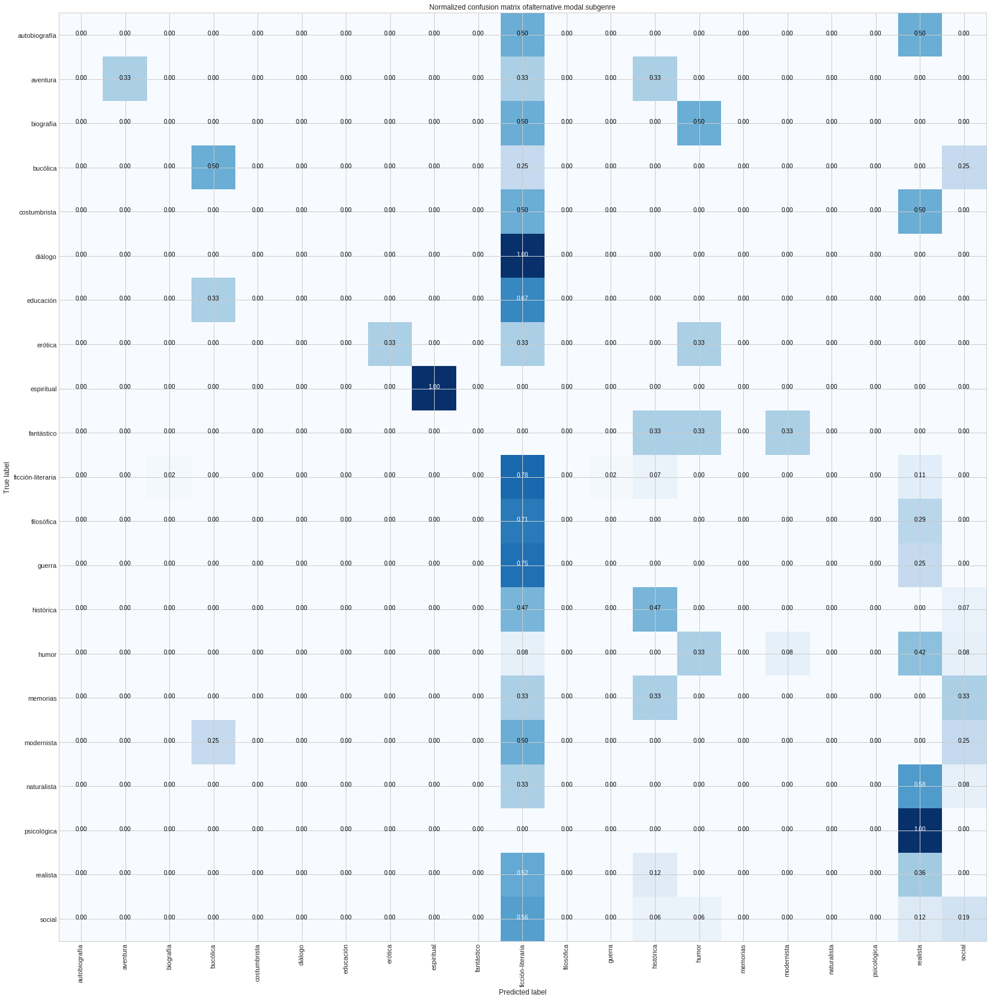

In [179]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df,
             sep = "\t", classes = ["alternative.modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5000], text_representations = ["tfidf-zscores"], typographies = [True],
             sampling_mode = "standard", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )

In [41]:
new_metadata_df["minimal.modal.subgenre"] = ""
for index,row in quantified_subgenre_df.loc[:, quantified_subgenre_df.columns.isin(["humor","histórica","realista"])].iterrows():
    if index in new_metadata_df.index.tolist():
        highest_value = row.sort_values(ascending=False)[0]
        modal_subgenre = row[row >= highest_value].sample(frac=1).index[0]
    new_metadata_df.loc[index,"minimal.modal.subgenre"] = modal_subgenre


In [44]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df.loc[rel_tags_ling_pos_diff_mw_ord_ent_df.index.tolist()],
             sep = "\t", classes = ["minimal.modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5000], text_representations = ["log"], typographies = [True],
             sampling_mode = "cross", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 10, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )


cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 5000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['severo@form_adjective@pos', '250@ord_ent', 'romántico@form_adjective@pos']
method used:	 LR
(352,)
(352, 5000)
undersampling None
undersampled (352,) (352, 5000) None
cross validation sampling of  minimal.modal.subgenre
more than 2 classes!
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.457544656527574, pvalue=0.00011710455613390173)
Class: 	 minimal.modal.subgenre
Scores:
 	 f1          0.698
rec         0.698
prec        0.698
f1_macro    0.629
f1_micro    0.698
dtype: float64
p-value:  0.0001
Baseline: 		 0.56
LR
0.13549999999999995
                    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  minimal.modal.subgenre    0.698     0.698      0.698     0.629     0.698   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0    

In [190]:
results_classification_multiclass_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
0,minimal.modal.subgenre,0.523,0.523,0.523,0.484,0.523,0.417614,0.105386,LR,log,5000,True,"[0.58, 0.39, 0.64, 0.39, 0.61, 0.49, 0.43, 0.7...",0.03118,ne0001 naturalista ne0002 histórica ne...,352,10,1,"LogisticRegression(C=1.0, class_weight=None, d..."


In [45]:
new_metadata_df.

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,modal.subgenre,alternative.modal.subgenre,minimal.modal.subgenre
ne0001,ne0001,Baroja,Mayorazgo,1903.0,narrative,novela,realist,Spain,36912891.0,XX842743,...,0.0,1.0,1.0,0.0,0.0,1.0,0.064103,naturalista,social,naturalista
ne0002,ne0002,Galdos,Misericordia,1889.0,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.067308,realista,realista,histórica
ne0003,ne0003,Galdos,Nazarin,1895.0,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.057692,espiritual,espiritual,naturalista
ne0004,ne0004,Galdos,Halma,1895.0,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.057692,espiritual,realista,naturalista
ne0005,ne0005,Galdos,Tristana,1892.0,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.076923,espiritual,espiritual,naturalista
ne0006,ne0006,Galdos,Angel,1891.0,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.076923,espiritual,espiritual,naturalista
ne0007,ne0007,Sawa,MujerMundo,1885.0,narrative,novela,erotic,Spain,59126336.0,XX1137561,...,0.0,1.0,1.0,0.0,0.0,1.0,0.053846,naturalista,naturalista,naturalista
ne0008,ne0008,Zamacois,Enferma,1896.0,narrative,novela,erotic,Spain,51728159.0,XX1137688,...,0.0,1.0,1.0,0.0,0.0,1.0,0.048077,erótica,erótica,humor
ne0009,ne0009,Galdos,Desheredada,1881.0,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0.0,1.0,1.0,0.0,0.0,1.0,0.061538,naturalista,naturalista,naturalista
ne0010,ne0010,Aparicio,Vicario,1905.0,narrative,novela,philosophical,Spain,4959739.0,XX950311,...,0.0,0.0,1.0,0.0,0.0,0.0,0.025641,social,social,naturalista


cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

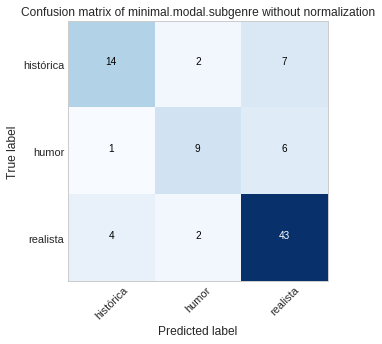

Normalized confusion matrix
[[0.61 0.09 0.3 ]
 [0.06 0.56 0.38]
 [0.08 0.04 0.88]]


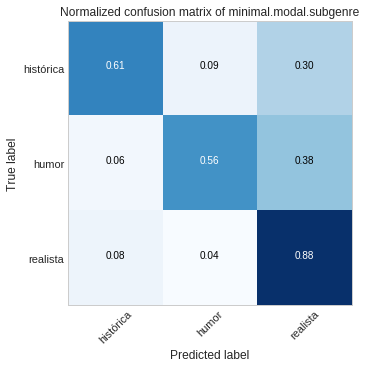

In [43]:
results_classification_multiclass_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df.loc[rel_tags_ling_pos_diff_mw_ord_ent_df.index.tolist()],
             sep = "\t", classes = ["minimal.modal.subgenre"], verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5000], text_representations = ["tfidf-zscores"], typographies = [True],
             sampling_mode = "standard", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 10, make_relative = False,
             under_sample_method = "None", maximum_cases = 5000, sampling_times = 1, outdir_results = "",
             )

# 7.1.3. Subgenres as Categories: Multi-Label Classification

In [25]:
semantic_subgenres_lt

['autobiografía',
 'aventura',
 'biografía',
 'costumbrista',
 'diálogo',
 'educación',
 'episodio nacional',
 'erótica',
 'espiritual',
 'fantástico',
 'filosófica',
 'greguería',
 'guerra',
 'histórica',
 'humor',
 'memorias',
 'modernista',
 'naturalista',
 'nivola',
 'poética',
 'psicológica',
 'realista',
 'social',
 'ficción-literaria',
 'mono-diálogo',
 'bucólica']

Different manners of transforming the labels:

In [33]:
quantified_subgenre_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]]

ficción-literaria    1
histórica            3
guerra               1
erótica              0
Name: ne0292, dtype: int64

In [34]:
new_metadata_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]]

ficción-literaria    1
histórica            1
guerra               1
erótica              0
Name: ne0292, dtype: object

In [36]:
pd.DataFrame([quantified_subgenre_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]],
             new_metadata_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]]],
            index=["amount of sources","binary"])

,ficción-literaria,histórica,guerra,erótica
amount of sources,1,3,1,0
binary,1,1,1,0


The multi-label classification test is run:

In [26]:
classification_results_linguistic_features_df = classify.classify(wdir, freq_table  = rel_tags_ling_pos_diff_mw_ord_ent_df, metadata = new_metadata_df,
             sep = "\t", classes = semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [100,1000,2000, 3000, 5000,7000], text_representations = ["log","log10-zscores","tfidf-zscores"], typographies = [True],
             sampling_mode = "cross", 
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
             )

cut_raw_features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           .

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling o

(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 100) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling l

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 7000)
undersampling lpc
undersampled (52,) (52, 7000) lpc
cross validation sampling of  autobiografía
(35

The three first MFWs:  ['am.divs', 'future@tense', 'noun.plant@wnlex']
The three last MFWs:  ['agrura@form_noun@pos', '77@ord_ent', 'legislar@form_verb@pos']
method used:	 LR
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
undersampling lpc
undersampled (52,) (52, 2000) lpc
cross validation sampling of  autobiografía
(352,)
(352, 2000)
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100)

(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
result of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100

(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  aventura
result of 

(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.193876603214257, pvalue=1.420898037714062e-38)
Class: 	 aventura
Scores:
 	 f1          0.792
rec         0.780
prec        0.842
f1_macro    0.794
f1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (60, 100) lpc
cross validation sampling of  biografía
(352,)
(352, 100)
undersampling lpc
undersampled (60,) (6

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersampling lpc
undersampled (60,) (60, 7000) lpc
cross validation sampling of  biografía
(352,)
(352, 7000)
undersamplin

(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
(352,)
(352, 2000)
undersampling lpc
undersampled (60,) (60, 2000) lpc
cross validation sampling of  biografía
r

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
unde

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 100) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
und

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 7000)
undersampling lpc
undersampled (32,) (32, 7000) lpc
cross validation sampling of  costumbrista
(352,)
(35

(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation sampling of  costumbrista
(352,)
(352, 2000)
undersampling lpc
undersampled (32,) (32, 2000) lpc
cross validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
c

(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
result of comparing

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc
cross validation sampling of  diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (18,) (18, 100) lpc


(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (18,) (18, 7000) lpc
cross validation sampling of  diálogo
result of comparing

(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (18,) (18, 2000) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.034852504572968, pvalue=2.4781925253226714e-06)
Class: 	 diálogo
Scores:
 	 f1          0.667
rec         0.778
prec        0.611
f1_macro    0.630
f1_micro    0.722
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004
MFW 3000
The three first MFWs:  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampl

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 100) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersamp

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000)
undersampling lpc
undersampled (140,) (140, 7000) lpc
cross validation sampling of  educación
(352,)
(352, 7000

(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampling of  educación
(352,)
(352, 2000)
undersampling lpc
undersampled (140,) (140, 2000) lpc
cross validation sampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(35

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.278919180365829, pvalue=1.020054386007407e-23)
Class: 	 episodio nacional
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997
MFW 7000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  episodio nacional
(352,)
(3

(352,)
(352, 5000)
undersampling lpc
undersampled (22,) (22, 5000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.468308410221015, pvalue=5.166707708912281e-22)
Class: 	 episodio nacional
Scores:
 	 f1          0.867
rec         0.900
prec        0.850
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367
MFW 7000
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 

(352,)
(352, 1000)
undersampling lpc
undersampled (22,) (22, 1000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 1000)
undersampling lpc
undersampled (22,) (22, 1000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.548884009473873, pvalue=6.966592172915639e-18)
Class: 	 episodio nacional
Scores:
 	 f1          0.847
rec         0.900
prec        0.817
f1_macro    0.840
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.347
MFW 2000
The three first MFWs:  ['am.divs', 'future@tense', 'noun.plant@wnlex']
The three last MFWs:  ['agrura@form_noun@pos', '77@ord_ent', 'legislar@form_verb@pos']
method used:	 LR
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 2000)
undersampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
c

(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
result of comparing

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 100) lpc


(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
(352,)
(352, 7000)
undersampling lpc
undersampled (34,) (34, 7000) lpc
cross validation sampling of  erótica
result of comparing

(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
(352,)
(352, 2000)
undersampling lpc
undersampled (34,) (34, 2000) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.914739356153083, pvalue=7.80802789065332e-21)
Class: 	 erótica
Scores:
 	 f1          0.807
rec         0.950
prec        0.750
f1_macro    0.693
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30700000000000005
MFW 3000
The three first MFWs:  [

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espir

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 100) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (6

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
undersampling lpc
undersampled (68,) (68, 7000) lpc
cross validation sampling of  espiritual
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  espiritual
(352,)
(352, 2000)
undersampling lpc
undersampled (68,) (68, 2000) lpc
cross validation sampling of  esp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantá

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (48,) (48, 100) lpc
cross validation sampling of  fantástico
(352,)
(352, 100)
undersampling lpc
undersampled (4

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
undersampling lpc
undersampled (48,) (48, 7000) lpc
cross validation sampling of  fantástico
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fantástico
(352,)
(352, 2000)
undersampling lpc
undersampled (48,) (48, 2000) lpc
cross validation sampling of  fan

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
unde

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation samp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 100) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
und

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(352, 7000)
undersampling lpc
undersampled (176,) (176, 7000) lpc
cross validation sampling of  filosófica
(352,)
(35

(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validation sampling of  filosófica
(352,)
(352, 2000)
undersampling lpc
undersampled (176,) (176, 2000) lpc
cross validatio

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cro

(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.341528403189805, pvalue=2.340440092141138e-14)
Class: 	 greguería
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 100) lpc
cr

(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
(352,)
(352, 7000)
undersampling lpc
undersampled (4,) (4, 7000) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.999999999999986, pvalue=3.40142217528536e-17)
Cl

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.341528403189805, pvalue=2.340440092141138e-14)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
MFW 3000
The three first MFWs:  ['am.divs', 'future@tense', 'noun.plant@wnlex']
The three last MFWs:  ['fresquito@form_adjective@pos', 'convivía@form_verb@pos', '57@form_number@pos']
method used:	 LR
(352,)
(352, 3000)
undersampling lpc
undersampled (4,) (4, 3000) lpc
cross validation sampling of  greguería
(352,)
(352, 3000)
undersampling lpc
undersampled (4,) (4, 3000) lpc
cross validation sampling of  greguería
(352,)
(352, 3000)
undersampling lpc
undersampled (4,) (4, 3000) lpc
cross validation sampling of  greguería
(352,)
(352, 3000)
undersampling lpc
undersampled (4,) (4, 3000) lpc
cross validation sampling of  greguería
(352,)
(352, 3000)
undersampling lpc
undersampled (4,) (4, 3000) lpc
cross

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross v

(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
result of comparing cross-va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 100) lpc
cross 

(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
(352,)
(352, 7000)
undersampling lpc
undersampled (42,) (42, 7000) lpc
cross validation sampling of  guerra
result of comparing cross-va

(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
(352,)
(352, 2000)
undersampling lpc
undersampled (42,) (42, 2000) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.672377905885483, pvalue=5.673119392919623e-16)
Class: 	 guerra
Scores:
 	 f1          0.707
rec         0.717
prec        0.783
f1_macro    0.716
f1_micro    0.758
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.20699999999999996
MFW 3000
The three first MFWs:  ['am.div

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampl

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersamp

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000)
undersampling lpc
undersampled (226,) (226, 7000) lpc
cross validation sampling of  histórica
(352,)
(352, 7000

(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampling of  histórica
(352,)
(352, 2000)
undersampling lpc
undersampled (226,) (226, 2000) lpc
cross validation sampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validat

(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
result of comparing cross-validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross validation sampling of  humor
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 100) lpc
cross valida

(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
(352,)
(352, 7000)
undersampling lpc
undersampled (98,) (98, 7000) lpc
cross validation sampling of  humor
result of comparing cross-validation 

(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
(352,)
(352, 2000)
undersampling lpc
undersampled (98,) (98, 2000) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.030209165256636, pvalue=4.8339456813513396e-33)
Class: 	 humor
Scores:
 	 f1          0.770
rec         0.735
prec        0.845
f1_macro    0.784
f1_micro    0.788
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.27
MFW 3000
The three first MFWs:  ['am.divs', 'future@tense', 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (11

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  mem

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 100) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (1

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
undersampling lpc
undersampled (110,) (110, 7000) lpc
cross validation sampling of  memorias
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  memorias
(352,)
(352, 2000)
undersampling lpc
undersampled (110,) (110, 2000) lpc
cross validation sampling of  m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  moder

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 100) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (7

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
undersampling lpc
undersampled (70,) (70, 7000) lpc
cross validation sampling of  modernista
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  modernista
(352,)
(352, 2000)
undersampling lpc
undersampled (70,) (70, 2000) lpc
cross validation sampling of  mod

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lp

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validatio

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling lpc
undersampled (166,) (166, 100) lpc
cross validation sampling of  naturalista
(352,)
(352, 100)
undersampling l

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(352,)
(352, 7000)
undersampling lpc
undersampled (166,) (166, 7000) lpc
cross validation sampling of  naturalista
(35

(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross validation sampling of  naturalista
(352,)
(352, 2000)
undersampling lpc
undersampled (166,) (166, 2000) lpc
cross v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross v

(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.153719106758494, pvalue=1.3527004670173697e-44)
Class: 	

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross 

(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  nivola
result of comparing cross-va

(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  nivola
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  nivola
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  nivola
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 nivola
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
MFW 3000
The three first MFWs:  ['am.divs', 'future@tense', 'noun.plant@wnlex']
The three last MFWs:  ['fresquito@form_adjective@pos', 'convivía@form_verb@pos', '57@form_number@pos']
method used:	 LR
(352,)
(352, 3000)
undersampling lpc
undersampled (10,) (10, 3000) lpc
cross validation sampling of  nivola
(352,)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
c

(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
result of comparing

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7010)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 100) lpc


(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
(352,)
(352, 7000)
undersampling lpc
undersampled (10,) (10, 7000) lpc
cross validation sampling of  poética
result of comparing

(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
(352,)
(352, 2000)
undersampling lpc
undersampled (10,) (10, 2000) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7648303678024152, pvalue=0.4480405452630981)
Class: 	 poética
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.448
Baseline: 		 0.5
LR
-0.16699999999999998
MFW 3000
The three first MFWs: 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampl

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 100) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersamp

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000)
undersampling lpc
undersampled (40,) (40, 7000) lpc
cross validation sampling of  psicológica
(352,)
(352, 7000

(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling of  psicológica
(352,)
(352, 2000)
undersampling lpc
undersampled (40,) (40, 2000) lpc
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (26

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  rea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (262,) (262, 100) lpc
cross validation sampling of  realista
(352,)
(352, 100)
undersampling lpc
undersampled (2

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
undersampling lpc
undersampled (262,) (262, 7000) lpc
cross validation sampling of  realista
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  realista
(352,)
(352, 2000)
undersampling lpc
undersampled (262,) (262, 2000) lpc
cross validation sampling of  r

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 10

(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
result of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 1

(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
(352,)
(352, 7000)
undersampling lpc
undersampled (334,) (334, 7000) lpc
cross validation sampling of  social
result of 

(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
(352,)
(352, 2000)
undersampling lpc
undersampled (334,) (334, 2000) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.805866805505243, pvalue=1.8993965168380644e-34)
Class: 	 social
Scores:
 	 f1          0.664
rec         0.661
prec        0.677
f1_macro    0.672
f1_

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literari

(352,)
(352, 5000)
undersampling lpc
undersampled (324,) (324, 5000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5000)
undersampling lpc
undersampled (324,) (324, 5000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.13476009520115, pvalue=9.144710548967766e-45)
Class: 	 ficción-literaria
Scores:
 	 f1          0.680
rec         0.685
prec        0.682
f1_macro    0.677
f1_micro    0.679
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.18000000000000005
MFW 7000
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (324,) (324, 7000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 7000)
undersampling lpc
undersampled (324,) (324, 7000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literar

(352,)
(352, 5000)
undersampling lpc
undersampled (324,) (324, 5000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.140378903178142, pvalue=2.8550764848614317e-43)
Class: 	 ficción-literaria
Scores:
 	 f1          0.685
rec         0.683
prec        0.699
f1_macro    0.688
f1_micro    0.691
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.18500000000000005
MFW 7000
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (324,) (324, 7000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 7000)
undersampling lpc
undersampled (324,) (324, 7000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 7000)
undersampling lpc
undersampled (324,) (324, 7000) lpc
cross validation sampling of  ficción-

(352,)
(352, 1000)
undersampling lpc
undersampled (324,) (324, 1000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 1000)
undersampling lpc
undersampled (324,) (324, 1000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.998598258016692, pvalue=6.732707182992538e-40)
Class: 	 ficción-literaria
Scores:
 	 f1          0.672
rec         0.680
prec        0.669
f1_macro    0.672
f1_micro    0.673
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.17200000000000004
MFW 2000
The three first MFWs:  ['am.divs', 'future@tense', 'noun.plant@wnlex']
The three last MFWs:  ['agrura@form_noun@pos', '77@ord_ent', 'legislar@form_verb@pos']
method used:	 LR
(352,)
(352, 2000)
undersampling lpc
undersampled (324,) (324, 2000) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 2000)
undersampling lpc
undersampled (324,) (324, 2000) lpc
cross validation sampling of  ficción-literaria
(352,)
(

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
unde

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
und

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 7000)
undersampling lpc
undersampled (22,) (22, 7000) lpc
cross validation sampling of  mono-diálogo
(352,)
(35

(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 2000)
undersampling lpc
undersampled (22,) (22, 2000) lpc
cross validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['?@form_punctuation@pos', '¿@form_punctuation@pos', 'como@form_conjunction@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (17

The three first MFWs:  [',@form_punctuation@pos', 'comma@type', 'de@form_adposition@pos']
The three last MFWs:  ['maleable@form_adjective@pos', 'empeñábanse@form_adjective@pos', 'alcaceres@form_noun@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  buc

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(352, 7012)
MFW 100
The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['deber@form_noun@pos', 'superior@form_adjective@pos', 'sacar@form_verb@pos']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 100) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (1

The three first MFWs:  ['...@form_punctuation@pos', 'etc@type', 'dio@form_verb@pos']
The three last MFWs:  ['am.sections', 'catedral@form_noun@pos', 'comienza@form_verb@pos']
method used:	 LR
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
undersampling lpc
undersampled (174,) (174, 7000) lpc
cross validation sampling of  bucólica
(352,)
(352, 7000)
under

(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  bucólica
(352,)
(352, 2000)
undersampling lpc
undersampled (174,) (174, 2000) lpc
cross validation sampling of  b

done!


In [27]:
classification_results_linguistic_features_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
210,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.67,...",3.401422e-17,ne0110 0 ne0113 0 ne0173 1 ne0172 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
324,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 0.67, 1.0, 0.0, 1.0,...",1.686280e-26,ne0189 0 ne0280 0 ne0069 1 ne0070 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
432,mono-diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.000000e+00,ne0355 0 ne0097 0 ne0072 0 ne0181 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
198,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",2.340440e-14,ne0173 1 ne0259 0 ne0172 1 ne0187 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
211,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,1000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.000000e+00,ne0172 1 ne0173 1 ne0060 0 ne0308 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
337,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,1000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.000000e+00,ne0284 0 ne0069 1 ne0072 1 ne0073 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
73,diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,1000,True,"[1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, ...",1.551680e-22,ne0349 0 ne0224 1 ne0167 0 ne0250 ...,18,9,10,"LogisticRegression(C=1.0, class_weight=None, d..."
205,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log10-zscores,1000,True,"[1.0, 1.0, 1.0, 1.0, 0.67, 0.67, 1.0, 1.0, 1.0...",2.340440e-14,ne0173 1 ne0341 0 ne0172 1 ne0356 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
325,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,1000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.000000e+00,ne0003 0 ne0338 0 ne0073 1 ne0070 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
79,diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log10-zscores,1000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",3.664737e-29,ne0250 1 ne0230 0 ne0187 0 ne0224 ...,18,9,10,"LogisticRegression(C=1.0, class_weight=None, d..."


Best results:

In [28]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
210,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.67,...",3.401422e-17,ne0110 0 ne0113 0 ne0173 1 ne0172 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
334,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log10-zscores,5000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",6.013782e-52,ne0104 0 ne0074 1 ne0325 0 ne0002 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
75,diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.67,...",5.333407e-44,ne0003 0 ne0232 1 ne0274 1 ne0009 ...,18,9,10,"LogisticRegression(C=1.0, class_weight=None, d..."
432,mono-diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.000000e+00,ne0355 0 ne0097 0 ne0072 0 ne0181 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
461,bucólica,0.983,0.978,0.990,0.983,0.983,0.5,0.483,LR,log10-zscores,7000,True,"[0.95, 0.95, 1.0, 0.89, 1.0, 1.0, 0.95, 0.94, ...",7.291590e-105,ne0086 0 ne0064 0 ne0301 0 ne0397 ...,174,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
112,episodio nacional,0.967,0.950,1.000,0.973,0.975,0.5,0.467,LR,log,5000,True,"[1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.67, 1.0, 1.0,...",1.020054e-23,ne0294 0 ne0040 0 ne0223 0 ne0097 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
131,erótica,0.947,0.950,0.967,0.947,0.950,0.5,0.447,LR,log,7000,True,"[1.0, 0.8, 0.67, 0.8, 1.0, 1.0, 0.8, 0.0, 1.0,...",3.920598e-28,ne0233 0 ne0036 0 ne0336 1 ne0085 ...,34,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
62,costumbrista,0.897,0.900,0.917,0.897,0.900,0.5,0.397,LR,log10-zscores,2000,True,"[0.8, 0.4, 0.5, 1.0, 0.8, 1.0, 0.67, 1.0, 1.0,...",3.300211e-22,ne0236 0 ne0015 0 ne0296 1 ne0052 ...,32,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
229,guerra,0.893,0.917,0.917,0.863,0.883,0.5,0.393,LR,tfidf-zscores,1000,True,"[0.86, 1.0, 0.67, 0.67, 0.8, 1.0, 1.0, 0.0, 0....",1.092804e-16,ne0192 0 ne0221 0 ne0069 0 ne0290 ...,42,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
323,naturalista,0.873,0.893,0.859,0.868,0.869,0.5,0.373,LR,tfidf-zscores,7000,True,"[0.84, 0.71, 0.7, 1.0, 0.89, 0.74, 0.67, 0.78,...",3.311524e-54,ne0111 0 ne0384 1 ne0005 1 ne0392 ...,166,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


In [29]:
classification_results_linguistic_features_df.to_csv(wdir+"classification_results_linguistic_features.csv", sep="\t")

In [56]:
classification_results_linguistic_features_df = pd.read_csv(wdir+"classification_results_linguistic_features.csv", sep="\t", index_col=0)

Median of the top 10 best results for each subgenre:

In [5]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].median().round(2)

0.79

In [6]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].std().round(2)

0.11

Median of the best results for each subgenre:

In [58]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].median().round(2)

0.84

In [7]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].std().round(2)

0.1

Lowest value in the top 10 best results for each subgenre:

In [40]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].min().round(2)

0.53

Results as box-plots using the 10 top combinations:

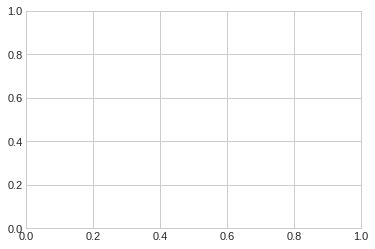

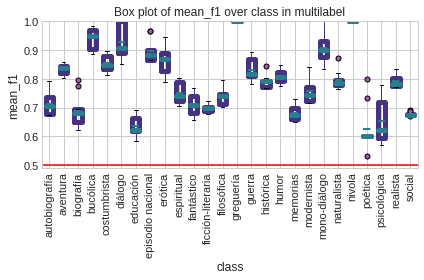

In [80]:
describe_data.boxplots(classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10), "mean_f1", "class", wdir,"multilabel", rotation=90, baseline=0.5,ylim=[0.49,1])

Results as box-plots using the top combination:

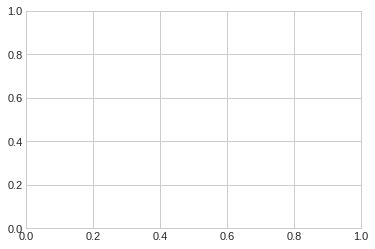

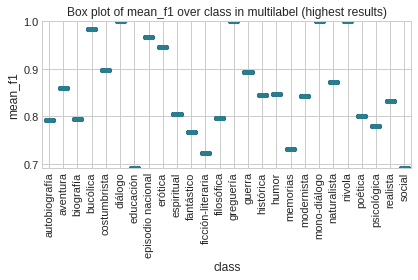

In [72]:
describe_data.boxplots(classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1), "mean_f1", "class", wdir,"multilabel (highest results)", rotation=90)

In [41]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
210,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,100,True,[1. 1. 1. 1. 1. 1. 1. 1. 0.67 ...,3.401422e-17,ne0110 0\nne0113 0\nne0173 1\nne0172 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
334,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log10-zscores,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,6.013782e-52,ne0104 0\nne0074 1\nne0325 0\nne0002 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
75,diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 0.67 ...,5.333407e-44,ne0003 0\nne0232 1\nne0274 1\nne0009 ...,18,9,10,"LogisticRegression(C=1.0, class_weight=None, d..."
432,mono-diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,0.000000e+00,ne0355 0\nne0097 0\nne0072 0\nne0181 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
461,bucólica,0.983,0.978,0.990,0.983,0.983,0.5,0.483,LR,log10-zscores,7000,True,[0.95 0.95 1. 0.89 1. 1. 0.95 0.94 1. ...,7.291590e-105,ne0086 0\nne0064 0\nne0301 0\nne0397 ...,174,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
112,episodio nacional,0.967,0.950,1.000,0.973,0.975,0.5,0.467,LR,log,5000,True,[1. 1. 1. 1. 0. 1. 0.67 1. 1. ...,1.020054e-23,ne0294 0\nne0040 0\nne0223 0\nne0097 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
131,erótica,0.947,0.950,0.967,0.947,0.950,0.5,0.447,LR,log,7000,True,[1. 0.8 0.67 0.8 1. 1. 0.8 0. 1. ...,3.920598e-28,ne0233 0\nne0036 0\nne0336 1\nne0085 ...,34,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
62,costumbrista,0.897,0.900,0.917,0.897,0.900,0.5,0.397,LR,log10-zscores,2000,True,[0.8 0.4 0.5 1. 0.8 1. 0.67 1. 1. ...,3.300211e-22,ne0236 0\nne0015 0\nne0296 1\nne0052 ...,32,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
229,guerra,0.893,0.917,0.917,0.863,0.883,0.5,0.393,LR,tfidf-zscores,1000,True,[0.86 1. 0.67 0.67 0.8 1. 1. 0. 0.5 ...,1.092804e-16,ne0192 0\nne0221 0\nne0069 0\nne0290 ...,42,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
323,naturalista,0.873,0.893,0.859,0.868,0.869,0.5,0.373,LR,tfidf-zscores,7000,True,[0.84 0.71 0.7 1. 0.89 0.74 0.67 0.78 0.88 ...,3.311524e-54,ne0111 0\nne0384 1\nne0005 1\nne0392 ...,166,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


# 7.1.4. Subgenres of Chapters

In [50]:
set(metadata_chapters_df["naturalista"])

{0, 1}

In [51]:
metadata_chapters_df.head()

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres,id_chapter,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,
ne0001_chap1,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap1,8771,31
ne0001_chap10,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap10,7812,31
ne0001_chap11,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap11,10368,31
ne0001_chap12,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap12,13016,31
ne0001_chap13,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,1,1,0,0,1,0.064103,ne0001_chap13,7098,31


In [52]:
metadata_chapters_df.shape

(10306, 208)

Comparison of sizes between corpus of novels and corpus of chapters of novels:

In [53]:
metadata_chapters_df.shape[0] / new_metadata_df.shape[0]

29.27840909090909

Classification test using chapters is run:

In [49]:
classification_results_chapters_df = classify.classify(wdir, freq_table  = rel_chapters_df, metadata = metadata_chapters_df,
             sep = "\t", classes = semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0, #"log","zscores","binary","tfidf","log10-zscores","tfidf-zscores"
             max_MFFs = [100,1000,2000, 3000, 5000,7000], text_representations = ["log","log10-zscores","tfidf-zscores"], typographies = [True],
             sampling_mode = "cross", 
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
             )


cut_raw_features                        ,         .        de        la         y       que  \
ne0001_chap1   0.011059  0.010375  0.010717  0.008893  0.005359  0.003420   
ne0001_chap10  0.010881  0.009857  0.008833  0.006912  0.008961  0.003328   
ne0001_chap11  0.011478  0.009259  0.008488  0.004533  0.005691  0.003858   
ne0001_chap12  0.011371  0.008528  0.008144  0.007299  0.006991  0.006454   
ne0001_chap13  0.013243  0.009439  0.011975  0.005635  0.006199  0.003804   

                     el        en         a       los  ...    cualidad  \
ne0001_chap1   0.005701  0.004560  0.003306  0.002280  ...         0.0   
ne0001_chap10  0.004352  0.003456  0.004864  0.002944  ...         0.0   
ne0001_chap11  0.005883  0.003665  0.003858  0.004533  ...         0.0   
ne0001_chap12  0.004994  0.003765  0.005685  0.002382  ...         0.0   
ne0001_chap13  0.005495  0.004227  0.002254  0.002959  ...         0.0   

               metiéndose  perfumado  rapaces  heredad  causar  boers  \
n

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampl

undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (18

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cro

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306,

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(103

undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  ave

undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation s

(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biograf

undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling o

undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross vali

undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  cos

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampli

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling 

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
und

(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (810,) (810, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306

(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (810,) (810, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (810,) (810, 5000) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=106.851972991589, pvalue=4.505375805651795e-104)
Class: 	 diálogo
Scores:
 	 f1          0.903
rec         0.857
prec 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educaci

undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling o

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
und

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
und

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cro

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 10

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=221.72229655609945, pvalue=2.5646041743243616e-135)
Class: 	 episodio nacional
Scores:
 	 f1          0.955
rec         0.924
prec        0.989
f1_macro    0.957
f1_micro    0.957
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45499999999999996
MFW 7000
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
u

(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=142.95897707717904, pvalue=1.6526460305314446e-116)
Class: 	 episodio nacional
Scores:
 	 f1          0.922
rec         0.937
prec        0.908
f1_macro    0.920
f1_micro    0.920
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42200000000000004
MFW 5000
The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (762,) (762, 5000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 5000)
undersampling lpc
undersampled (762,) (762, 5000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 5000)
undersampling lpc
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
und

undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
result

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306

(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=136.05184523844517, pvalue=2.1711614291409734e-114)
Class: 	 erótica
Scores:
 	 f1          0.937
rec         0.954
pr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  e

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation samp

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling 

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  f

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation samp

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling 

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  f

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation samp

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling 

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
und

(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=58.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306

(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross

(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=89.40637561158601, pvalue=1.7357752345633227e-96)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampl

(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=116.1706872

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)


(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=139.7194300

(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=117.24571875305132, pvalue=4.938856269940591e-108)
Class: 	 guerra
Scores:
 	 f1          0.891
rec         0.871
prec        0.915
f1_macro    0.895
f1_micro    0.895
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.391
MFW 7000
The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['oyeron', 'pantalón', 'preparativos']
method used:	

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  históri

undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling o

undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross vali

undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
und

undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
result

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306

undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
result

(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=216.76363425364931, pvalue=2.39614132914044e-134)
Class: 	 humor
Scores:
 	 f1          0.861
rec         0.828
prec  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(103

undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  mem

undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation s

(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  m

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation samp

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling 

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validatio

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersa

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampl

(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=331.5287766

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)


(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=815.8896984

(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=138.7979102100172, pvalue=3.0335995814210023e-115)
Class: 	 nivola
Scores:
 	 f1          0.965
rec         0.934
prec        1.000
f1_macro    0.967
f1_micro    0.967
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46499999999999997
MFW 7000
The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['oyeron', 'pantalón', 'preparativos']

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
und

(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306

(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=39.97569131029829, pvalue=6.757635274076967e-63)
Class: 	 poética
Scores:
 	 f1          0.843
rec         0.737
prec 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling

The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validatio

The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersa

The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['atrevimiento', 'viajero', 'fumar']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(103

undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  rea

undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation s

(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 1

(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 700

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)

undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  soci

undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  soci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['gran', 'mucho', 'eso']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=219.25757603998966, pvalue=7.738814620889444e-135)
Class: 	 ficción-literaria
Scores:
 	 f1          0.829
rec         0.828
prec        0.830
f1_macro    0.829
f1_micro    0.829
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.32899999999999996
MFW 7000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mujercita', 'cantante', 'diálogos']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 10000)
MFW 100
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['mundo', '!', 'a']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (78

(10306,)
(10306, 5000)
undersampling lpc
undersampled (7842,) (7842, 5000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=249.70836305596137, pvalue=2.02920169261428e-140)
Class: 	 ficción-literaria
Scores:
 	 f1          0.835
rec         0.836
prec        0.834
f1_macro    0.835
f1_micro    0.835
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33499999999999996
MFW 7000
The three first MFWs:  ['—', 'mismo', 'vez']
The three last MFWs:  ['fuertemente', 'diestra', 'disimulo']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling

undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=198.57398866459872, pvalue=1.3781048401041758e-130)
Class: 	 ficción-literaria
Scores:
 	 f1          0.810
rec         0.795
prec        0.825
f1_macro    0.813
f1_micro    0.813
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31000000000000005
MFW 5000
The three first MFWs:  ['a', 'que', 'mairena']
The three last MFWs:  ['

In [55]:
classification_results_chapters_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
198,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,[0.8 1. 1. 1. 1. 1. 1. 1. 0.67 ...,5.663509e-69,id_chapter\nne0172_chap4 1\nne0242_chap57 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
201,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,5.507733e-92,id_chapter\nne0173_chap1 1\nne0123_chap19 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
214,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf-zscores,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,1.735775e-96,id_chapter\nne0173_chap4 1\nne0173_chap3 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
328,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,9.355608e-176,id_chapter\nne0070_chap10 1\nne0070_chap1 ...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
335,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log10-zscores,7000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,2.705759e-191,id_chapter\nne0292_chap11 0\nne0030_chap94...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
332,nivola,0.992,0.992,0.992,0.992,0.992,0.5,0.492,LR,log10-zscores,2000,True,[1. 0.96 1. 1. 1. 0.96 1. 1. 0.96 ...,1.049059e-134,id_chapter\nne0069_chap32 1\nne0070_chap12...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
334,nivola,0.992,0.992,0.992,0.992,0.992,0.5,0.492,LR,log10-zscores,5000,True,[0.96 1. 1. 1. 1. 1. 1. 1. 1. ...,1.230775e-162,id_chapter\nne0243_chap32 0\nne0069_chap29 ...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
329,nivola,0.992,1.000,0.986,0.992,0.992,0.5,0.492,LR,log,7000,True,[1. 1. 1. 1. 1. 0.96 1. 1. 1. ...,1.368368e-152,id_chapter\nne0069_chap30 1\nne0328_chap61...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
331,nivola,0.991,0.983,1.000,0.992,0.992,0.5,0.491,LR,log10-zscores,1000,True,[1. 1. 1. 1. 0.96 1. 0.96 1. 1. ...,1.086800e-139,id_chapter\nne0037_chap11 0\nne0324_chap3 ...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
112,episodio nacional,0.991,0.984,0.997,0.991,0.991,0.5,0.491,LR,log,5000,True,[0.99 0.99 0.99 0.97 0.97 1. 0.99 0.97 1. ...,5.929107e-162,id_chapter\nne0278_chap40 1\nne0279_chap39...,762,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


In [56]:
classification_results_chapters_df.groupby(["class"]).head(1)

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
198,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,100,True,[0.8 1. 1. 1. 1. 1. 1. 1. 0.67 ...,5.663509e-69,id_chapter\nne0172_chap4 1\nne0242_chap57 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
328,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,9.355608e-176,id_chapter\nne0070_chap10 1\nne0070_chap1 ...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
112,episodio nacional,0.991,0.984,0.997,0.991,0.991,0.5,0.491,LR,log,5000,True,[0.99 0.99 0.99 0.97 0.97 1. 0.99 0.97 1. ...,5.929107e-162,id_chapter\nne0278_chap40 1\nne0279_chap39...,762,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
77,diálogo,0.976,0.985,0.967,0.975,0.975,0.5,0.476,LR,log,7000,True,[0.95 0.98 0.96 0.96 0.98 0.91 0.94 0.98 0.94 ...,3.666858e-136,id_chapter\nne0232_chap19 1\nne0033_chap74...,810,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
347,poética,0.950,0.950,0.953,0.950,0.950,0.5,0.450,LR,log,7000,True,[0.97 0.89 0.91 0.89 0.97 0.97 1. 0.97 0.97 ...,1.065552e-110,id_chapter\nne0176_chap32 0\nne0127_chap26...,356,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
136,erótica,0.947,0.930,0.965,0.947,0.947,0.5,0.447,LR,log10-zscores,5000,True,[0.97 0.94 0.96 0.94 0.91 0.97 0.96 0.93 0.93 ...,8.259536e-127,id_chapter\nne0176_chap37 0\nne0227_chap21 ...,686,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
59,costumbrista,0.942,0.938,0.947,0.942,0.942,0.5,0.442,LR,log,7000,True,[0.9 0.93 0.94 0.87 0.95 0.94 0.94 0.89 0.97 ...,9.463981e-120,id_chapter\nne0070_chap15 0\nne0121_chap48...,848,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
227,guerra,0.918,0.906,0.932,0.919,0.920,0.5,0.418,LR,log10-zscores,7000,True,[0.88 0.96 0.85 0.89 0.96 0.92 0.95 0.99 0.85 ...,1.580793e-115,id_chapter\nne0182_chap6 1\nne0250_chap10 ...,932,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
173,fantástico,0.905,0.901,0.912,0.906,0.906,0.5,0.405,LR,log10-zscores,7000,True,[0.91 0.91 0.88 0.93 0.9 0.9 0.88 0.91 0.91 ...,4.857224e-117,id_chapter\nne0338_chap17 1\nne0230_chap25 ...,1410,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
299,modernista,0.902,0.921,0.884,0.900,0.900,0.5,0.402,LR,log10-zscores,7000,True,[0.87 0.85 0.93 0.88 0.9 0.88 0.88 0.84 0.89 ...,1.834852e-123,id_chapter\nne0068_chap13 1\nne0121_chap26...,1924,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


In [ ]:
classification_results_chapters_df.to_csv(wdir+"tokens_classification_results_chapters.csv", sep="\t")

In [6]:
classification_results_chapters_df = pd.read_csv(wdir+"tokens_classification_results_chapters.csv", sep="\t", index_col=0)

In [7]:
classification_results_chapters_df.head()

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
198,greguería,1.0,1.0,1.0,1.0,1.0,0.5,0.5,LR,log,100,True,[0.8 1. 1. 1. 1. 1. 1. 1. 0.67 ...,5.663509e-69,id_chapter\nne0172_chap4 1\nne0242_chap57 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
201,greguería,1.0,1.0,1.0,1.0,1.0,0.5,0.5,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,5.507733e-92,id_chapter\nne0173_chap1 1\nne0123_chap19 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
214,greguería,1.0,1.0,1.0,1.0,1.0,0.5,0.5,LR,tfidf-zscores,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,1.735775e-96,id_chapter\nne0173_chap4 1\nne0173_chap3 ...,26,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
328,nivola,1.0,1.0,1.0,1.0,1.0,0.5,0.5,LR,log,5000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,9.355608e-176,id_chapter\nne0070_chap10 1\nne0070_chap1 ...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
335,nivola,1.0,1.0,1.0,1.0,1.0,0.5,0.5,LR,log10-zscores,7000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,2.705759e-191,id_chapter\nne0292_chap11 0\nne0030_chap94...,242,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


Results using the top 10 combinations of each subgenre:

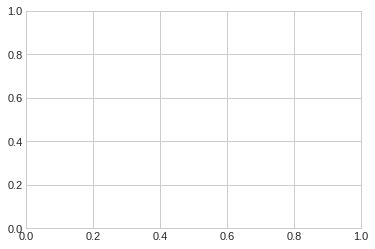

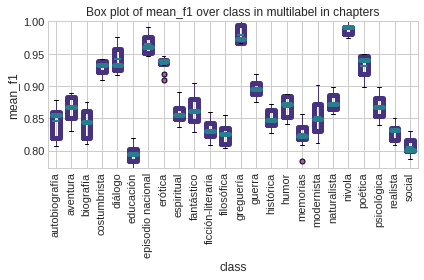

In [54]:
describe_data.boxplots(classification_results_chapters_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10), "mean_f1", "class", wdir,"multilabel in chapters", rotation=90)

Median of the very top results:

In [55]:
classification_results_chapters_df.groupby(["class"]).head(1)["mean_f1"].median().round(2)

0.89

In [85]:
metadata_chapters_df

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,id_chapter,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,
ne0001_chap1,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap1,8771,31
ne0001_chap2,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap2,11578,31
ne0001_chap3,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap3,7239,31
ne0001_chap4,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap4,10652,31
ne0001_chap5,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap5,5840,31
ne0001_chap6,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap6,9267,31
ne0001_chap7,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap7,7960,31
ne0001_chap8,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap8,16528,31
ne0001_chap9,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,0,0,1,1,0,0,1,ne0001_chap9,10655,31


Building a comparison between the results of the chapters and the novels:

In [195]:
comparison_results_anno_chapters_df = pd.DataFrame(
    [
    classification_results_chapters_df.groupby(["class"]).head(10).sort_values(by="class").groupby(["class"]).mean()["mean_f1"].tolist(),

     classification_results_linguistic_features_df.loc[~classification_results_linguistic_features_df["class"].isin(["bucólica","mono-diálogo"])].groupby(["class"]).head(10).sort_values(by="class").groupby(["class"]).mean()["mean_f1"].tolist()
        
    ],
    columns = classification_results_chapters_df.groupby(["class"]).head(1).sort_values(by="class")["class"].tolist(),
    index = ["chapters","anno"]
    
).T
comparison_results_anno_chapters_df["difference"] = comparison_results_anno_chapters_df["chapters"] - comparison_results_anno_chapters_df["anno"] 
comparison_results_anno_chapters_df.sort_values(by="anno", inplace=True)

comparison_results_anno_chapters_df.sort_values(by="difference").round(2)

,chapters,anno,difference
greguería,0.98,1.00,-0.02
nivola,0.99,1.00,-0.01
diálogo,0.94,0.93,0.01
aventura,0.86,0.83,0.03
realista,0.83,0.79,0.04
histórica,0.85,0.79,0.06
humor,0.87,0.81,0.06
guerra,0.90,0.83,0.06
episodio nacional,0.96,0.90,0.07
erótica,0.93,0.86,0.07


In [194]:
comparison_results_anno_chapters_df["difference"].mean().round(2)

0.1

Bar plot of the results of chapters and novels:

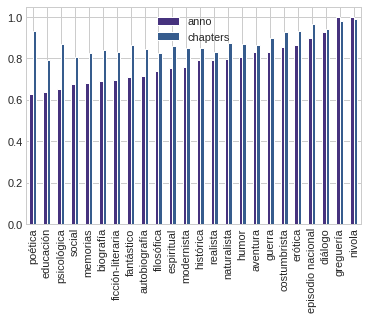

In [188]:
comparison_results_anno_chapters_df[["anno","chapters",]].plot.bar()

Is the results with the novels statistically higher than the results using the entire volumes? Yes, it is (p-value < 0.05).

In [59]:
stats.ttest_ind(
classification_results_chapters_df.groupby(["class"]).head(1)["mean_f1"],
classification_results_linguistic_features_df.groupby(["class"]).head(1)["mean_f1"]
)

Ttest_indResult(statistic=2.2970227382421746, pvalue=0.02602222616380553)

## Further analysis

In [55]:
classification_results_chapters_df = classify.classify(wdir, freq_table  = rel_anno_chapters_df, metadata = metadata_chapters_df,
             sep = "\t", classes = semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0, #"log","zscores","binary","tfidf","log10-zscores","tfidf-zscores"
             max_MFFs = [100,1000,2000, 3000, 5000,7000], text_representations = ["log","log10-zscores","tfidf-zscores"], typographies = [True],
             sampling_mode = "cross", 
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
             sort_by = "none"
             )


cut_raw_features                 1@person    ,@form  2@person   de@form  abandonar@mariax  \
ne0001_chap1   0.003762  0.011059  0.001140  0.010717          0.000114   
ne0001_chap10  0.001536  0.010881  0.001152  0.008961          0.000256   
ne0001_chap11  0.001157  0.011285  0.001061  0.009549          0.000193   
ne0001_chap12  0.001844  0.011140  0.001152  0.007913          0.000077   
ne0001_chap13  0.000986  0.013243  0.000282  0.013384          0.000423   

                 .@form  abatir@mariax   el@form  abeja@mariax   la@form  \
ne0001_chap1   0.010375       0.000684  0.007867      0.000684  0.008893   
ne0001_chap10  0.009601       0.000128  0.007424      0.000000  0.006912   
ne0001_chap11  0.009163       0.000579  0.009163      0.000579  0.004437   
ne0001_chap12  0.008297       0.000230  0.007760      0.000077  0.007376   
ne0001_chap13  0.009439       0.000704  0.009298      0.000282  0.005635   

                   ...        burlando@form  praderas@form  originalidad@f

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampl

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobio

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1860,) (1860, 100) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 100)
undersampling lpc
unde

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=135.95106540724592, pvalue=2.3355246428894382e-114)
Class: 	 autobiografía
Scores:
 	 f1          0.843
rec         0.854
prec        0.834
f1_macro    0.841
f1_micro    0.841
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.34299999999999997
MFW 7000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1860,) (1860, 7000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 7000)
undersam

(10306,)
(10306, 3000)
undersampling lpc
undersampled (1860,) (1860, 3000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 3000)
undersampling lpc
undersampled (1860,) (1860, 3000) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=118.98103872158788, pvalue=1.1650333851753347e-108)
Class: 	 autobiografía
Scores:
 	 f1          0.811
rec         0.812
prec        0.811
f1_macro    0.811
f1_micro    0.811
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31100000000000005
MFW 5000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1860,) (1860, 5000) lpc
cross validation sampling of  autobiografía
(10306,)
(10306, 5000)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross v

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) lpc
cross validation sampling of  aventura
(10306,)
(10306, 100)
undersampling lpc
undersampled (3672,) (3672, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3672,) (3672, 7000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 7000)
under

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3672,) (3672, 5000) lpc
cross validation sampling of  aventura
(10306,)
(10306, 50

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
c

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 100) lpc
cross validation sampling of  biografía
(10306,)
(10306, 100)
undersampling lpc
undersampled (1974,) (1974, 

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1974,) (1974, 7000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 7000

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1974,) (1974, 5000) lpc
cross validation sampling of  biografía
(10306,)
(10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (848, 100) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 100)
undersampling lpc
undersampled (848,) (8

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (848,) (848, 7000) lpc
cross validation sampling of  costumbrista
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (848,) (848, 5000) lpc
cross validation sampling of  costumbrista
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling o

(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (976,) (976, 100) lpc
cross validation 

(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (976,) (976, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (976,) (976, 5000) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=183

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
c

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 100) lpc
cross validation sampling of  educación
(10306,)
(10306, 100)
undersampling lpc
undersampled (5168,) (5168, 

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5168,) (5168, 7000) lpc
cross validation sampling of  educación
(10306,)
(10306, 7000

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5168,) (5168, 5000) lpc
cross validation sampling of  educación
(10306,)
(10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
un

(10306,)
(10306, 5000)
undersampling lpc
undersampled (762,) (762, 5000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=314.70772464986266, pvalue=2.3597701882510786e-150)
Class: 	 episodio nacional
Scores:
 	 f1          0.975
rec         0.969
prec        0.982
f1_macro    0.975
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475
MFW 7000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampling lpc
undersampled (762,) (762, 100) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 100)
undersampl

(10306,)
(10306, 5000)
undersampling lpc
undersampled (762,) (762, 5000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=247.43414243637392, pvalue=5.012736272382932e-140)
Class: 	 episodio nacional
Scores:
 	 f1          0.969
rec         0.974
prec        0.964
f1_macro    0.968
f1_micro    0.968
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.469
MFW 7000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampling lpc
undersampled (762,) (762, 7000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 7000)
undersampli

(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
(10306,)
(10306, 3000)
undersampling lpc
undersampled (762,) (762, 3000) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=235.1706988597096, pvalue=7.620143547394398e-138)
Class: 	 episodio nacional
Scores:
 	 f1          0.970
rec         0.997
prec        0.945
f1_macro    0.968
f1_micro    0.968
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.47
MFW 5000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
unde

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling o

(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation sampling of  erótica
(10306,)
(10306, 100)
undersampling lpc
undersampled (686,) (686, 100) lpc
cross validation 

(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (686,) (686, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (686,) (686, 5000) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=135

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100)

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (2020, 100) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 100)
undersampling lpc
undersampled (2020,) (

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 7000)
undersampling lpc
undersampled (2020,) (2020, 7000) lpc
cross validation sampling of  espiritual
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(10306,)
(10306, 5000)
undersampling lpc
undersampled (2020,) (2020, 5000) lpc
cross validation sampling of  espiritual
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100)

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (1410, 100) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 100)
undersampling lpc
undersampled (1410,) (

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1410,) (1410, 7000) lpc
cross validation sampling of  fantástico
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1410,) (1410, 5000) lpc
cross validation sampling of  fantástico
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100)

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (5532, 100) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 100)
undersampling lpc
undersampled (5532,) (

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (5532,) (5532, 7000) lpc
cross validation sampling of  filosófica
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (5532,) (5532, 5000) lpc
cross validation sampling of  filosófica
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of 

(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sampling of  greguería
(10306,)
(10306, 100)
undersampling lpc
undersampled (26,) (26, 100) lpc
cross validation sa

(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 7000)
undersampling lpc
undersampled (26,) (26, 7000) lpc
cross

(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
(10306,)
(10306, 5000)
undersampling lpc
undersampled (26,) (26, 5000) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=113.74330680118055, pvalue=9.728697219690632e-107)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  gue

(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross valid

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampling of  guerra
(10306,)
(10306, 100)
undersampling lpc
undersampled (932,) (932, 100) lpc
cross validation sampli

(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 7000)
undersampling lpc
undersampled (932,) (932, 7000) lpc
cross valid

(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
(10306,)
(10306, 5000)
undersampling lpc
undersampled (932,) (932, 5000) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=107.05761611918732, pvalue=3.730491269718806e-104)
Class: 	 guerra
Scores:
 	 f1          0.894
rec         0.912
prec       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
c

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 100) lpc
cross validation sampling of  histórica
(10306,)
(10306, 100)
undersampling lpc
undersampled (8196,) (8196, 

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8196,) (8196, 7000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 7000

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8196,) (8196, 5000) lpc
cross validation sampling of  histórica
(10306,)
(10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling

undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validation sampling of  humor
(10306,)
(10306, 100)
undersampling lpc
undersampled (3600,) (3600, 100) lpc
cross validatio

undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3600,) (3600, 7000) lpc
cross validation sampling of  humor
(10306

undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3600,) (3600, 5000) lpc
cross validation sampling of  humor
result

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross v

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) lpc
cross validation sampling of  memorias
(10306,)
(10306, 100)
undersampling lpc
undersampled (4234,) (4234, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4234,) (4234, 7000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 7000)
under

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4234,) (4234, 5000) lpc
cross validation sampling of  memorias
(10306,)
(10306, 50

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100)

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (1924, 100) lpc
cross validation sampling of  modernista
(10306,)
(10306, 100)
undersampling lpc
undersampled (1924,) (

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1924,) (1924, 7000) lpc
cross validation sampling of  modernista
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1924,) (1924, 5000) lpc
cross validation sampling of  modernista
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (4614,) (4614, 100) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 100)
undersampling lpc
undersampled (46

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (4614,) (4614, 7000) lpc
cross validation sampling of  naturalista
(10306,

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (4614,) (4614, 5000) lpc
cross validation sampling of  naturalist

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  niv

(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross valid

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampling of  nivola
(10306,)
(10306, 100)
undersampling lpc
undersampled (242,) (242, 100) lpc
cross validation sampli

(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 7000)
undersampling lpc
undersampled (242,) (242, 7000) lpc
cross valid

(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
(10306,)
(10306, 5000)
undersampling lpc
undersampled (242,) (242, 5000) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=173.12678604684228, pvalue=1.0440424943285065e-124)
Class: 	 nivola
Scores:
 	 f1          0.983
rec         0.975
prec      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling o

(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation sampling of  poética
(10306,)
(10306, 100)
undersampling lpc
undersampled (356,) (356, 100) lpc
cross validation 

(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cross validation sampling of  poética
(10306,)
(10306, 7000)
undersampling lpc
undersampled (356,) (356, 7000) lpc
cro

(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
(10306,)
(10306, 5000)
undersampling lpc
undersampled (356,) (356, 5000) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=114

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (1414,) (1414, 100) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 100)
undersampling lpc
undersampled (14

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (1414,) (1414, 7000) lpc
cross validation sampling of  psicológica
(10306,

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (1414,) (1414, 5000) lpc
cross validation sampling of  psicológic

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross v

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) lpc
cross validation sampling of  realista
(10306,)
(10306, 100)
undersampling lpc
undersampled (7016,) (7016, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7016,) (7016, 7000) lpc
cross validation sampling of  realista
(10306,)
(10306, 7000)
under

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7016,) (7016, 5000) lpc
cross validation sampling of  realista
(10306,)
(10306, 50

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sa

undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  soci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross validation sampling of  social
(10306,)
(10306, 100)
undersampling lpc
undersampled (8922,) (8922, 100) lpc
cross val

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
undersampled (8922,) (8922, 7000) lpc
cross validation sampling of  social
(10306,)
(10306, 7000)
undersampling lpc
u

undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  social
(10306,)
(10306, 5000)
undersampling lpc
undersampled (8922,) (8922, 5000) lpc
cross validation sampling of  soci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross v

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 100)
undersampling lpc
undersampled (3914,) (3914, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
undersampling lpc
undersampled (3914,) (3914, 7000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 7000)
under

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 5000)
undersampling lpc
undersampled (3914,) (3914, 5000) lpc
cross validation sampling of  bucólica
(10306,)
(10306, 50

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) l

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (684, 100) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 100)
undersampling lpc
undersampled (684,) (6

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 7000)
undersampling lpc
undersampled (684,) (684, 7000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(1030

The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['pliegues@form', 'instrumento@form', 'conferencia@form']
method used:	 LR
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(10306,)
(10306, 5000)
undersampling lpc
undersampled (684,) (684, 5000) lpc
cross validation sampling of  mono-diálogo
(1030

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersam

undersampled (7842,) (7842, 5000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7842,) (7842, 5000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=194.45104506979393, pvalue=1.0941923045995356e-129)
Class: 	 ficción-literaria
Scores:
 	 f1          0.797
rec         0.793
prec        0.803
f1_macro    0.799
f1_micro    0.799
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.29700000000000004
MFW 7000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersample

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
(10306, 8829)
MFW 100
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['él@form', 'ambición@mariax', 'todo@form']
method used:	 LR
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100)
undersampling lpc
undersampled (7842,) (7842, 100) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 100

(10306,)
(10306, 5000)
undersampling lpc
undersampled (7842,) (7842, 5000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 5000)
undersampling lpc
undersampled (7842,) (7842, 5000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=217.5342858253327, pvalue=1.6874891659167107e-134)
Class: 	 ficción-literaria
Scores:
 	 f1          0.777
rec         0.776
prec        0.778
f1_macro    0.777
f1_micro    0.777
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.277
MFW 7000
The three first MFWs:  ['1@person', ',@form', '2@person']
The three last MFWs:  ['permita@form', 'fuegos@form', 'algazara@form']
method used:	 LR
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
undersampling lpc
undersampled (7842,) (7842, 7000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 7000)
und

(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
(10306,)
(10306, 3000)
undersampling lpc
undersampled (7842,) (7842, 3000) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=156.16215560667277, pvalue=2.733578247641381e-120)
Class: 	 ficción-literaria
Scores:
 	 f1          0.752
rec         0.749
prec        0.755
f1_macro    0.753


In [56]:
classification_results_chapters_df.to_csv(wdir+"anno_classification_results_chapters.csv", sep="\t")

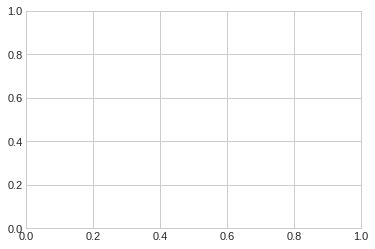

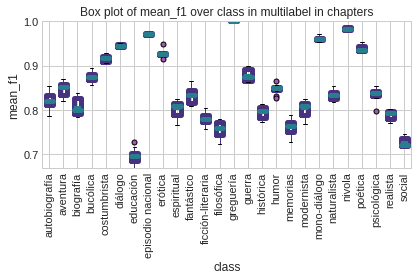

In [57]:
describe_data.boxplots(classification_results_chapters_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10), "mean_f1", "class", wdir,"multilabel in chapters", rotation=90)

In [59]:
classification_results_chapters_df.groupby(["class"]).head(1)["mean_f1"].mean().round(2)

0.87

# 7.1.5. Subgenres as Linguistic and Literary Categories

In [29]:
metadata_recategorized_df.head()

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,author.movement_ordinal,author.submovement_ordinal,authorText.relation_ordinal,litHist.brow_ordinal,setting.type_ordinal,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,end_ordinal,representation_ordinal
ne0001,ne0001,Baroja,Mayorazgo,1903,narrative,novela,realist,Spain,36912891.0,XX842743,...,1,4,0,NaN,1,3,3,2,4,2
ne0002,ne0002,Galdos,Misericordia,1889,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,2,0,0,2
ne0003,ne0003,Galdos,Nazarin,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,0.0,-,3,2,0,4,2
ne0004,ne0004,Galdos,Halma,1895,narrative,novela,realist,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,2,2,4,2
ne0005,ne0005,Galdos,Tristana,1892,narrative,novela,bildungsroman,Spain,71395987.0,XX1014802,...,0,0,0,NaN,3,3,1,0,3,2


Sorting the groups of literary metadata after their informational type:

In [30]:
metadata_features_lt = [
                        'narrator', 'protagonist.gender', 'setting.type',  
                        'protagonist.age', 'protagonist.socLevel', 'protagonist.profession', 'representation', 
                        'setting.continent', 'setting.country', 'setting.settlement', 'setting.territory', 
                        'time.period', 'time.span',  'end',  
                        'setting.settlement.represented.exist', 'setting.represented',
                        'year','decade','litHist.pages','litHist.literaryQuality',
                        'author.litHist.pages','authorText.relation','author.name',"author.date.birth","author.date.death", "author.gender"]

In [31]:
numerical_metadata_lt = [
                    'setting.type_ordinal', 'time.period_ordinal',
                    'protagonist.age_ordinal', 'protagonist.socLevel_ordinal',
                    'end_ordinal', 'representation_ordinal','time.span','authorText.relation_ordinal']

In [32]:
categorical_metadata_lt = [
                         'narrator', 'protagonist.gender',
                        'protagonist.profession', 
                        'setting.continent', 'setting.country', 'setting.settlement', 'setting.territory', 
                        'setting.settlement.represented.exist', 'setting.represented',
                        ]

In [33]:
extern_metadata_features_lt = ['year','decade','litHist.pages','litHist.literaryQuality',
                        'author.litHist.pages','authorText.relation','author.name',"author.date.birth","author.date.death", "author.gender"]

In [34]:
author_metadata_features_lt = ['author.litHist.pages','authorText.relation','author.name',"author.date.birth","author.date.death", "author.gender"]

Obtaining the metadata in numbers:

In [35]:
numerical_metadata_features_df = metadata2numbers.replace_non_numerical_with_mode(metadata_recategorized_df[numerical_metadata_lt], numerical_metadata_lt).fillna(0)
print(numerical_metadata_features_df.shape)
numerical_metadata_features_df.head()


(358, 8)


,setting.type_ordinal,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,end_ordinal,representation_ordinal,time.span,authorText.relation_ordinal
ne0001,1.0,3.0,3.0,2.0,4.0,2.0,365.0,0.0
ne0002,3.0,3.0,2.0,0.0,0.0,2.0,90.0,0.0
ne0003,3.0,3.0,2.0,0.0,4.0,2.0,90.0,0.0
ne0004,3.0,3.0,2.0,2.0,4.0,2.0,365.0,0.0
ne0005,3.0,3.0,1.0,0.0,3.0,2.0,1800.0,0.0


Exploration of metadata:

In [36]:
new_metadata_df["end"].head()

ne0001            positive
ne0002            negative
ne0003            positive
ne0004            positive
ne0005    partial positive
Name: end, dtype: object

In [37]:
numerical_metadata_features_df["time.span"].max()

25550.0

In [38]:
numerical_metadata_features_df["time.span"].max()/365

70.0

Transformation of metadata usin min-max:

In [39]:
minmax_numerical_metadata_features_df = text2features.calculate_minmax(numerical_metadata_features_df)

In [40]:
minmax_numerical_metadata_features_df.head()

,setting.type_ordinal,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,end_ordinal,representation_ordinal,time.span,authorText.relation_ordinal
ne0001,0.333333,0.75,1.000000,1.0,1.00,1.0,0.014286,0.0
ne0002,1.000000,0.75,0.666667,0.0,0.00,1.0,0.003523,0.0
ne0003,1.000000,0.75,0.666667,0.0,1.00,1.0,0.003523,0.0
ne0004,1.000000,0.75,0.666667,1.0,1.00,1.0,0.014286,0.0
ne0005,1.000000,0.75,0.333333,0.0,0.75,1.0,0.070450,0.0


In [41]:
minmax_numerical_metadata_features_df.max()

setting.type_ordinal            1.0
time.period_ordinal             1.0
protagonist.age_ordinal         1.0
protagonist.socLevel_ordinal    1.0
end_ordinal                     1.0
representation_ordinal          1.0
time.span                       1.0
authorText.relation_ordinal     1.0
dtype: float64

In [42]:
minmax_numerical_metadata_features_df.min()

setting.type_ordinal            0.0
time.period_ordinal             0.0
protagonist.age_ordinal         0.0
protagonist.socLevel_ordinal    0.0
end_ordinal                     0.0
representation_ordinal          0.0
time.span                       0.0
authorText.relation_ordinal     0.0
dtype: float64

Make categorical information binary:

In [43]:
categorical_metadata_features_df = pd.get_dummies(metadata_recategorized_df[categorical_metadata_lt])
print(categorical_metadata_features_df.shape)
categorical_metadata_features_df.head()

(358, 407)


,setting.settlement.represented.exist,narrator_autodiegetic,narrator_dialogue,narrator_epistolary,narrator_heterodiegetic,narrator_homodiegetic,narrator_mixed,narrator_other,protagonist.gender_female,protagonist.gender_male,...,setting.represented_Vilamorta,setting.represented_Villaalegre,setting.represented_Villaclara,setting.represented_Villaruin,setting.represented_Vlasta,setting.represented_Yecla,setting.represented_Zaratán,setting.represented_mixed,setting.represented_other,setting.represented_unknown
ne0001,True,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
ne0002,True,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
ne0003,True,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
ne0004,True,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ne0005,True,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
categorical_metadata_features_df[["protagonist.gender_female","protagonist.gender_male","protagonist.gender_other"]].head()

,protagonist.gender_female,protagonist.gender_male,protagonist.gender_other
ne0001,0,1,0
ne0002,1,0,0
ne0003,0,1,0
ne0004,0,0,0
ne0005,1,0,0


Merging data from both data-frames:

In [45]:
metadata_features_df = pd.merge(categorical_metadata_features_df,minmax_numerical_metadata_features_df, right_index=True, left_index=True)

In [46]:
metadata_features_df.head()

,setting.settlement.represented.exist,narrator_autodiegetic,narrator_dialogue,narrator_epistolary,narrator_heterodiegetic,narrator_homodiegetic,narrator_mixed,narrator_other,protagonist.gender_female,protagonist.gender_male,...,setting.represented_other,setting.represented_unknown,setting.type_ordinal,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,end_ordinal,representation_ordinal,time.span,authorText.relation_ordinal
ne0001,True,0,0,0,0,1,0,0,0,1,...,0,0,0.333333,0.75,1.000000,1.0,1.00,1.0,0.014286,0.0
ne0002,True,0,0,0,1,0,0,0,1,0,...,0,0,1.000000,0.75,0.666667,0.0,0.00,1.0,0.003523,0.0
ne0003,True,0,0,0,0,1,0,0,0,1,...,0,0,1.000000,0.75,0.666667,0.0,1.00,1.0,0.003523,0.0
ne0004,True,0,0,0,0,1,0,0,0,0,...,0,0,1.000000,0.75,0.666667,1.0,1.00,1.0,0.014286,0.0
ne0005,True,0,0,0,1,0,0,0,1,0,...,0,0,1.000000,0.75,0.333333,0.0,0.75,1.0,0.070450,0.0


In [47]:
new_metadata_df.shape

(352, 205)

In [48]:
metadata_features_df = metadata_features_df.loc[new_metadata_df.index.tolist()]

In [49]:
metadata_features_df = metadata_features_df.reindex_axis(metadata_features_df.mean().sort_values(ascending=False).index, axis=1)

In [50]:
metadata_features_df.head()

,setting.settlement.represented.exist,representation_ordinal,setting.continent_Europe,setting.country_Spain,protagonist.gender_male,time.period_ordinal,setting.type_ordinal,narrator_heterodiegetic,protagonist.age_ordinal,protagonist.socLevel_ordinal,...,setting.territory_Liliput,setting.territory_Lisboa,setting.territory_Londres,setting.territory_Mallorca,setting.territory_Maya,setting.territory_Negrimia,narrator_other,setting.settlement_New York,setting.territory_New York,setting.represented_New York
ne0001,True,1.0,1,1,1,0.75,0.333333,0,1.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
ne0002,True,1.0,1,1,0,0.75,1.000000,1,0.666667,0.0,...,0,0,0,0,0,0,0,0,0,0
ne0003,True,1.0,1,1,1,0.75,1.000000,0,0.666667,0.0,...,0,0,0,0,0,0,0,0,0,0
ne0004,True,1.0,1,1,0,0.75,1.000000,0,0.666667,1.0,...,0,0,0,0,0,0,0,0,0,0
ne0005,True,1.0,1,1,0,0.75,1.000000,1,0.333333,0.0,...,0,0,0,0,0,0,0,0,0,0


Running classification using metadata as literary features:

In [48]:
classification_results_metadata_df = classify.classify(wdir, freq_table  = metadata_features_df,
             metadata = new_metadata_df,
             classes = semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5,10,20,30,40,50,60,70,80,90,100,200,300,400,], text_representations = ["raw","zscores","binary","tfidf"], typographies = [True],
             sampling_mode = "cross", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
                                                       sort_by="none"
             )

cut_raw_features          setting.settlement.represented.exist  representation_ordinal  \
ne0001                                  True                     1.0   
ne0002                                  True                     1.0   
ne0003                                  True                     1.0   
ne0004                                  True                     1.0   
ne0005                                  True                     1.0   

        setting.continent_Europe  setting.country_Spain  \
ne0001                         1                      1   
ne0002                         1                      1   
ne0003                         1                      1   
ne0004                         1                      1   
ne0005                         1                      1   

        protagonist.gender_male  time.period_ordinal  setting.type_ordinal  \
ne0001                        1                 0.75              0.333333   
ne0002                        0       

(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
(352,)
(352, 20)
undersampling lpc
undersampled (52,) (52, 20) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.892484276876527, pvalue=6.839713179091831e-43)
Class: 	 autobiografía
Scores:
 	 f1          0.829
rec         0.833
prec        0.858
f1_macro

(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 57) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 58) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 54) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 57) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 57) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 59) lpc
cross validation sampling of  autobiografía
(352,)
(352, 70)
undersampling lpc
undersampled (52,) (52, 55) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.29187736891427, pvalue=4.7421881

(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 87) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 95) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 103) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 103) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 88) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 88) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 95) lpc
cross validation sampling of  autobiografía
(352,)
(352, 300)
undersampling lpc
undersampled (52,) (52, 98) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.448007243553818, pvalu

(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
(352,)
(352, 30)
undersampling lpc
undersampled (52,) (52, 30) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.995823542707008, pvalue=6.803009

(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
(352,)
(352, 80)
undersampling lpc
undersampled (52,) (52, 80) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.149744654539884, pvalue=2.921013

(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling of  autobiografía
(352,)
(352, 400)
undersampling lpc
undersampled (52,) (52, 400) lpc
cross validation sampling o

(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 39) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 40) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 39) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 40) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 39) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 40) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 40) lpc
cross validation sampling of  autobiografía
(352,)
(352, 40)
undersampling lpc
undersampled (52,) (52, 39) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.59879809584563, pvalue=1.4220539

(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 64) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 66) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 61) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 66) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 68) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
(352,)
(352, 90)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.758043628346652, pvalue=3.957883

(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
(352,)
(352, 5)
undersampling lpc
undersampled (52,) (52, 5) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.9430285284974405, pvalue=4.1957068513246735e-08)


(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 45) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 46) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 47) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 49) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 47) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 46) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 47) lpc
cross validation sampling of  autobiografía
(352,)
(352, 50)
undersampling lpc
undersampled (52,) (52, 47) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.023916324784306, pvalue=1.537093

(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 65) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 63) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 66) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 56) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 64) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 59) lpc
cross validation sampling of  autobiografía
(352,)
(352, 100)
undersampling lpc
undersampled (52,) (52, 68) lpc
cross validation sampling of  autobiografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.60958008487083, pvalue=1

(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
(352,)
(352, 10)
undersampling lpc
undersampled (98,) (98, 10) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.424302790360976, pvalue=1.3006866301776674e-17)
Class: 	 aventura
Scores

(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 58) lpc
cross validation sampling of  aventura
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 60) lpc
cross validation sampling of  aventura
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 58) lpc
cross validation sampling of  aventura
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 58) lpc
cross validation sampling of  aventura
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 57) lpc
cross validation sampling of  aventura
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 60) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.062748295590705, pvalue=2.448183941479592e-25)
Class: 	 aventura
Scores:
 	 f1          0.785
rec         0.800
prec        0.801
f1_macro    0.772
f1_micro    0.778
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.28500000000000003
MFW 70
The three first MFWs:  ['setting.settlemen

(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 123) lpc
cross validation sampling of  aventura
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 129) lpc
cross validation sampling of  aventura
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 120) lpc
cross validation sampling of  aventura
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 116) lpc
cross validation sampling of  aventura
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 109) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.458061467275652, pvalue=3.8209731967229575e-28)
Class: 	 aventura
Scores:
 	 f1          0.697
rec         0.695
prec        0.787
f1_macro    0.700
f1_micro    0.712
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.19699999999999995
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFW

(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.077981054648394, pvalue=1.633473982900681e-12)
Class: 	 aventura
Scores:
 	 f1          0.656
rec         0.660
prec        0.682
f1_macro    0.659
f1_micro    0.665
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.15600000000000003
MFW 30
The three first MFWs:  ['setting.settlement

(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 70) lpc
cross validation sampling of  aventura
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 70) lpc
cross validation sampling of  aventura
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 70) lpc
cross validation sampling of  aventura
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 70) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.525879979746177, pvalue=5.337928668112525e-20)
Class: 	 aventura
Scores:
 	 f1          0.673
rec         0.720
prec        0.679
f1_macro    0.654
f1_micro    0.668
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.17300000000000004
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(3

(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 300) lpc
cross validation sampling of  aventura
(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 300) lpc
cross validation sampling of  aventura
(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 300) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.530345171205493, pvalue=3.817522596908335e-22)
Class: 	 aventura
Scores:
 	 f1          0.705
rec         0.700
prec        0.732
f1_macro    0.714
f1_micro    0.718
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.20499999999999996
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (98,) (98, 400) lpc
cross validation sampling of  aventur

(352,)
(352, 30)
undersampling lpc
undersampled (98,) (98, 30) lpc
cross validation sampling of  aventura
(352,)
(352, 30)
undersampling lpc
undersampled (98,) (98, 30) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.39151395791029, pvalue=1.5331113857007682e-17)
Class: 	 aventura
Scores:
 	 f1          0.707
rec         0.700
prec        0.728
f1_macro    0.715
f1_micro    0.718
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.20699999999999996
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  aventura
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  aventura
(352,

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.125130216428836, pvalue=1.8248127097197912e-25)
Class: 	 aventura
Scores:
 	 f1          0.680
rec         0.700
prec        0.680
f1_macro    0.680
f1_micro    0.685
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.18000000000000005
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:	 LR
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 82) lpc
cross validation sampling of  aventura
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 73) lpc
cross validation sampling of  aventura
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 77) lpc
cross validation sampling of  aventura
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 75) lpc
cross validation sampling of  aventura
(35

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.067657028980388, pvalue=2.819177945160482e-23)
Class: 	 aventura
Scores:
 	 f1          0.692
rec         0.710
prec        0.704
f1_macro    0.695
f1_micro    0.702
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.19199999999999995
textual representation:  tfidf
Columns that are empty:  []
(352, 415)
MFW 5
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.continent_Europe', 'setting.country_Spain', 'protagonist.gender_male']
method used:	 LR
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  aventura
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  aventura
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  aventura
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5

(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 50) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 50) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 47) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 49) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 50) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 49) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 50) lpc
cross validation sampling of  aventura
(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 49) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.55396198869873, pvalue=1.0284321795364023e-15)
Class: 	 aventura
Scores:


(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 85) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 79) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 87) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 81) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 82) lpc
cross validation sampling of  aventura
(352,)
(352, 100)
undersampling lpc
undersampled (98,) (98, 84) lpc
cross validation sampling of  aventura
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.974493880890519, pvalue=1.2435038943571176e-16)
Class: 	 aventura
Scores:
 	 f1          0.659
rec         0.655
prec        0.697
f1_macro    0.661
f1_micro    0.675
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.15900000000000003
MFW 200
The three first MFWs:  ['setting.se

(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
(352,)
(352, 10)
undersampling lpc
undersampled (60,) (60, 10) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.5177689180332633, pvalue=0.6057746063716345)
Class: 	 biografía


(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 57) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 54) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 54) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 57) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 55) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 51) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 52) lpc
cross validation sampling of  biografía
(352,)
(352, 60)
undersampling lpc
undersampled (60,) (60, 57) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.36270952894646, pvalue=5.897974773295128e-28)
Class: 	 biografía

(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 82) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 86) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 85) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 97) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 93) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 99) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 87) lpc
cross validation sampling of  biografía
(352,)
(352, 200)
undersampling lpc
undersampled (60,) (60, 92) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.55313156871992, pvalue=2.8344123398455733e-30)
Class: 	 

(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
(352,)
(352, 20)
undersampling lpc
undersampled (60,) (60, 20) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.322299648989965, pvalue=7.229711860539755e-26)
Class: 	 biografí

(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 70)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.38589727861598, pvalue=7.727664542778943e-22)
Class: 	 biografía

(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
(352,)
(352, 300)
undersampling lpc
undersampled (60,) (60, 300) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.576332153374972, pvalue=6.071701962198139e-18)
C

(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
(352,)
(352, 30)
undersampling lpc
undersampled (60,) (60, 30) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.268226749927194, pvalue=1.06866738191921e-38)
Class: 	 biografía
Scores:
 	 f1          0.777
rec         0.833
prec        0.757
f1_macro    0.737
f1_micro    0.750
dtype

(352,)
(352, 80)
undersampling lpc
undersampled (60,) (60, 65) lpc
cross validation sampling of  biografía
(352,)
(352, 80)
undersampling lpc
undersampled (60,) (60, 64) lpc
cross validation sampling of  biografía
(352,)
(352, 80)
undersampling lpc
undersampled (60,) (60, 60) lpc
cross validation sampling of  biografía
(352,)
(352, 80)
undersampling lpc
undersampled (60,) (60, 64) lpc
cross validation sampling of  biografía
(352,)
(352, 80)
undersampling lpc
undersampled (60,) (60, 64) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.685131002042931, pvalue=1.3651835397512702e-28)
Class: 	 biografía
Scores:
 	 f1          0.840
rec         0.867
prec        0.843
f1_macro    0.827
f1_micro    0.833
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33999999999999997
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  [

(352,)
(352, 400)
undersampling lpc
undersampled (60,) (60, 127) lpc
cross validation sampling of  biografía
(352,)
(352, 400)
undersampling lpc
undersampled (60,) (60, 124) lpc
cross validation sampling of  biografía
(352,)
(352, 400)
undersampling lpc
undersampled (60,) (60, 131) lpc
cross validation sampling of  biografía
(352,)
(352, 400)
undersampling lpc
undersampled (60,) (60, 117) lpc
cross validation sampling of  biografía
(352,)
(352, 400)
undersampling lpc
undersampled (60,) (60, 129) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.550758532056154, pvalue=3.6411527012404816e-39)
Class: 	 biografía
Scores:
 	 f1          0.809
rec         0.833
prec        0.852
f1_macro    0.806
f1_micro    0.817
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30900000000000005
textual representation:  tfidf
Columns that are empty:  []
(352, 415)
MFW 5
The three first MFWs:  ['setting.settlement.represented.exist'

(352,)
(352, 40)
undersampling lpc
undersampled (60,) (60, 40) lpc
cross validation sampling of  biografía
(352,)
(352, 40)
undersampling lpc
undersampled (60,) (60, 39) lpc
cross validation sampling of  biografía
(352,)
(352, 40)
undersampling lpc
undersampled (60,) (60, 39) lpc
cross validation sampling of  biografía
(352,)
(352, 40)
undersampling lpc
undersampled (60,) (60, 39) lpc
cross validation sampling of  biografía
(352,)
(352, 40)
undersampling lpc
undersampled (60,) (60, 39) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.426089901768654, pvalue=8.757237718879301e-20)
Class: 	 biografía
Scores:
 	 f1          0.798
rec         0.800
prec        0.817
f1_macro    0.798
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.29800000000000004
MFW 50
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['

(352,)
(352, 90)
undersampling lpc
undersampled (60,) (60, 65) lpc
cross validation sampling of  biografía
(352,)
(352, 90)
undersampling lpc
undersampled (60,) (60, 70) lpc
cross validation sampling of  biografía
(352,)
(352, 90)
undersampling lpc
undersampled (60,) (60, 65) lpc
cross validation sampling of  biografía
(352,)
(352, 90)
undersampling lpc
undersampled (60,) (60, 63) lpc
cross validation sampling of  biografía
(352,)
(352, 90)
undersampling lpc
undersampled (60,) (60, 68) lpc
cross validation sampling of  biografía
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.703661455613526, pvalue=2.2135778476862053e-20)
Class: 	 biografía
Scores:
 	 f1          0.685
rec         0.700
prec        0.702
f1_macro    0.675
f1_micro    0.683
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.18500000000000005
MFW 100
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  

(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
(352,)
(352, 5)
undersampling lpc
undersampled (32,) (32, 5) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.30971687350450167, pvalue=0.7574272434367627)
Class: 	 costumbrista
Scores:
 	 f1          0.533
rec         0.550
prec        0.550
f1_macro    0.580
f1_micro    0.625
dtype: float64
p-value:  0.7574
Baseline: 		 0.5
LR
0.03300000000000003
MFW 10
The three first MFWs:  ['

(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 40) lpc
cross validation sampling of  costumbrista
(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 44) lpc
cross validation sampling of  costumbrista
(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 40) lpc
cross validation sampling of  costumbrista
(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 40) lpc
cross validation sampling of  costumbrista
(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 40) lpc
cross validation sampling of  costumbrista
(352,)
(352, 50)
undersampling lpc
undersampled (32,) (32, 42) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.752178027353376, pvalue=0.00029561129977664045)
Class: 	 costumbrista
Scores:
 	 f1          0.590
rec         0.600
prec        0.633
f1_macro    0.603
f1_micro    0.650
dtype: float64
p-value:  0.0003
Baseline: 		 0.5
LR
0.08999999999999997
MFW 60
The three f

(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 58) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 52) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 51) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 54) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 62) lpc
cross validation sampling of  costumbrista
(352,)
(352, 100)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.383176978741523, pvalue=0.019072008088422805)
Class: 	 costumbrista
Scores:
 	 f1          0.580
rec         0.650
prec        0.567
f1_macro    0.613
f1_micro    0.700
dtype: float64
p-value:  0.0191
Baseline: 		 0.5
LR
0.07999999999999996
MFW 200
The th

(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
(352,)
(352, 10)
undersampling lpc
undersampled (32,) (32, 10) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.894868220217074, pvalue=0.0001785784418918264)
Class: 	 costumbrista
Scores:
 	 f1          0.763
rec         0.800
prec        0.817
f1_macro    0.710

(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
(352,)
(352, 60)
undersampling lpc
undersampled (32,) (32, 60) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.049011010376485, pvalue=0.000102234086987

(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
(352,)
(352, 200)
undersampling lpc
undersampled (32,) (32, 200) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.4892632041934816, pvalue=

undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 20) lpc
cross validation sampling of  costumbrista
(352,)
(352, 20)
undersampling lpc
undersampled (32,) (32, 19) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to basel

(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 49) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 52) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 53) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 54) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 55) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 52) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 51) lpc
cross validation sampling of  costumbrista
(352,)
(352, 70)
undersampling lpc
undersampled (32,) (32, 48) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1060925434674633, pvalue=0.00247340740312

(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 84) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 76) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 70) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 79) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 78) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 77) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 91) lpc
cross validation sampling of  costumbrista
(352,)
(352, 300)
undersampling lpc
undersampled (32,) (32, 87) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.627186098889705, pvalue=0.0099786

(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 29) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 28) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 29) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 30) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 29) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 25) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 29) lpc
cross validation sampling of  costumbrista
(352,)
(352, 30)
undersampling lpc
undersampled (32,) (32, 30) lpc
cross validation sampling of  costumbrista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.313452932146575, pvalue=0.001287911025491

(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 54) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 55) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 50) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 52) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 55) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 52) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 55) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 53) lpc
cross validation sampling of  costumbrista
(352,)
(352, 80)
undersampling lpc
undersampled (32,) (32, 51) lpc
cross validation sampling of  costumbrista
result of 

(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 88) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 97) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 85) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 89) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 89) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 88) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 94) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 97) lpc
cross validation sampling of  costumbrista
(352,)
(352, 400)
undersampling lpc
undersampled (32,) (32, 81) lpc
cross validation sampling of  costumbrista
r

(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 36) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 39) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 36) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 37) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 35) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 38) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 36) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 38) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.0704737303143546, pvalue=2.2102989888918795e-10)
Class: 	 diálogo
Scores:
 	 f1  

(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 62) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 59) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 59) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 57) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 59) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 60) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.425630170066678, pvalue=4.6255800502441735e-09)
Class: 	 diálogo
Scores:
 	 f1          0.630
rec         0.650
prec        0.667
f1_macro    0.637
f1_micro    0.675
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.13
MFW 100
The three first MFWs:  ['setting.settlement.represented.exist',

(352,)
(352, 5)
undersampling lpc
undersampled (28,) (28, 5) lpc
cross validation sampling of  diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (28,) (28, 5) lpc
cross validation sampling of  diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (28,) (28, 5) lpc
cross validation sampling of  diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (28,) (28, 5) lpc
cross validation sampling of  diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (28,) (28, 5) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-6.864382382172676, pvalue=5.902212528816071e-10)
Class: 	 diálogo
Scores:
 	 f1          0.183
rec         0.200
prec        0.200
f1_macro    0.330
f1_micro    0.425
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.317
MFW 10
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_heterodiegetic', 'protagon

(352,)
(352, 50)
undersampling lpc
undersampled (28,) (28, 50) lpc
cross validation sampling of  diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (28,) (28, 50) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.037190063874917, pvalue=2.126792536835984e-06)
Class: 	 diálogo
Scores:
 	 f1          0.563
rec         0.650
prec        0.517
f1_macro    0.557
f1_micro    0.625
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.06299999999999994
MFW 60
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_unknown', 'setting.territory_Navarra', 'setting.represented_Valencia']
method used:	 LR
(352,)
(352, 60)
undersampling lpc
undersampled (28,) (28, 60) lpc
cross validation sampling of  diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (28,) (28, 60) lpc
cross validation sampling of  diálogo
(352,)


result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.418545814661327, pvalue=3.0196569633362086e-13)
Class: 	 diálogo
Scores:
 	 f1          0.800
rec         0.800
prec        0.800
f1_macro    0.833
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30000000000000004
MFW 200
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.country_Australia', 'setting.country_Arabian Peninsula', 'setting.country_?']
method used:	 LR
(352,)
(352, 200)
undersampling lpc
undersampled (28,) (28, 200) lpc
cross validation sampling of  diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (28,) (28, 200) lpc
cross validation sampling of  diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (28,) (28, 200) lpc
cross validation sampling of  diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (28,) (28, 200) lpc
cross validation sampling of  diálogo
(352,

(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (28,) (28, 20) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.517868320611325, pvalue=1.7298234323218814e-05)
Class: 	 diálogo
Scores:
 	 f1   

(352,)
(352, 70)
undersampling lpc
undersampled (28,) (28, 55) lpc
cross validation sampling of  diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (28,) (28, 51) lpc
cross validation sampling of  diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (28,) (28, 50) lpc
cross validation sampling of  diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (28,) (28, 55) lpc
cross validation sampling of  diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (28,) (28, 50) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.996064654820648, pvalue=1.6897568768648353e-14)
Class: 	 diálogo
Scores:
 	 f1          0.757
rec         0.800
prec        0.783
f1_macro    0.683
f1_micro    0.725
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.257
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', '

(352,)
(352, 300)
undersampling lpc
undersampled (28,) (28, 76) lpc
cross validation sampling of  diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (28,) (28, 74) lpc
cross validation sampling of  diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (28,) (28, 83) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.572481799903826, pvalue=2.1692555510236943e-07)
Class: 	 diálogo
Scores:
 	 f1          0.780
rec         0.800
prec        0.817
f1_macro    0.787
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.28
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (28,) (28, 92) lpc
cross validation sampling of  diálogo
(352,)
(352, 400)
unde

undersampled (28,) (28, 29) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-4.357638235215377, pvalue=3.21638276407664e-05)
Class: 	 diálogo
Scores:
 	 f1          0.267
rec         0.350
prec        0.250
f1_macro    0.260
f1_micro    0.350
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.23299999999999998
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 38) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 36) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (28,) (28, 35) lpc
cross validation sampling of  diálogo
(352,)
(352, 40)
undersampling lpc
undersampl

(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 59) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 55) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 57) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 64) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 51) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 61) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 55) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 60) lpc
cross validation sampling of  diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (28,) (28, 55) lpc
cross validation sampling of  diálogo
result of comparing cross-validation to baseline Ttest_

(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
(352,)
(352, 5)
undersampling lpc
undersampled (140,) (140, 5) lpc
cross validation sampling of  educación
result of comparing cross-validation 

(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
(352,)
(352, 50)
undersampling lpc
undersampled (140,) (140, 50) lpc
cross validation sampling of  educación
result of comparing

(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 91) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 91) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 87) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 88) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 93) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 87) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 94) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 91) lpc
cross validation sampling of  educación
(352,)
(352, 100)
undersampling lpc
undersampled (140,) (140, 91) lpc
cross validation sampling of  educación
result of 

(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
(352,)
(352, 10)
undersampling lpc
undersampled (140,) (140, 10) lpc
cross validation sampling of  educación
result of comparing

(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
(352,)
(352, 60)
undersampling lpc
undersampled (140,) (140, 60) lpc
cross validation sampling of  educación
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.818680120608159, pvalue=7.1721034748146e-27)
Cla

(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
(352,)
(352, 200)
undersampling lpc
undersampled (140,) (140, 200) lpc
cross validation sampling of  educación
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.705366317781753, pvalue=9.385083

(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
(352,)
(352, 20)
undersampling lpc
undersampled (140,) (140, 20) lpc
cross validation sampling of  educación
result of comparing

(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 69) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 69) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
(352,)
(352, 70)
undersampling lpc
undersampled (140,) (140, 68) lpc
cross validation sampling of  educación
result of comparing

(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 161) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 161) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 157) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 152) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 164) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 164) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 169) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 173) lpc
cross validation sampling of  educación
(352,)
(352, 300)
undersampling lpc
undersampled (140,) (140, 166) lpc
cross validation sampling of  educación
r

(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
(352,)
(352, 30)
undersampling lpc
undersampled (140,) (140, 30) lpc
cross validation sampling of  educación
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.190142348213918, pvalue=1.24468458104682e-10)
Cla

(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 74) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 75) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 72) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 76) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 76) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 76) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 78) lpc
cross validation sampling of  educación
(352,)
(352, 80)
undersampling lpc
undersampled (140,) (140, 79) lpc
cross validation sampling of  educación
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.591242798230422, pvalue=1.7827570946965743e-11)
C

(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 192) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 181) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 196) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 192) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 191) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 218) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 189) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 192) lpc
cross validation sampling of  educación
(352,)
(352, 400)
undersampling lpc
undersampled (140,) (140, 201) lpc
cross validation sampling of  educación
r

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.70056213138286, pvalue=0.00035367534093091107)
Class: 	 episodio nacional
Scores:
 	 f1          0.580
rec         0.700
prec        0.517
f1_macro    0.540
f1_micro    0.625
dtype: float64
p-value:  0.0004
Baseline: 		 0.5
LR
0.07999999999999996
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 33) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 33) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 33) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 32) lpc
cross 

(352,)
(352, 80)
undersampling lpc
undersampled (22,) (22, 44) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 80)
undersampling lpc
undersampled (22,) (22, 39) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.487739681712416, pvalue=1.9457429681471214e-05)
Class: 	 episodio nacional
Scores:
 	 f1          0.567
rec         0.650
prec        0.550
f1_macro    0.473
f1_micro    0.525
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.06699999999999995
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:	 LR
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 47) lpc
cross v

(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 58) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 60) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 63) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 65) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 58) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 400)
undersampling lpc
undersampled (22,) (22, 65) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.9021050066925604, pvalue=0.004568929058654447)
Class: 	 episodio nacional
Scores:
 	 f1          0.433
rec         0.550
prec        0.400
f1_macro    0.440
f1_micro    0.575
dtype: float64
p-value:  0.0046
Baseline: 		 0.5
L

(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validat

(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 90) lpc
cross validat

(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  e

(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 38) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 38) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 35) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 37) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 34) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 34) lpc
cross validat

(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 49) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 49) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 55) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 49) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 42) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 43) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(stati

(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.

(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 39) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 42) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 40) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 44) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 41) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 41) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 41) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 38) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.1

(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 57) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 58) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 54) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 48) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 62) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 56) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  episodio nacional
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  episodio nacional
result of comparing cross-validation to baseline Ttest_1sampResult(stati

(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
(352,)
(352, 20)
undersampling lpc
undersampled (34,) (34, 20) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.038285803192621, pvalue=0.04418793550909283)
Class: 	 erótica
Scores:
 	 f1      

(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 52) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 53) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 53) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 54) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 54) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 51) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1041510914046855, pvalue=0.002488228705158815)
Class: 	 erótica
Scores:
 	 f1          0.743
rec         0.750
prec        0.783
f1_macro    0.743
f1_micro    0.750
dtype: float64
p-value:  0.0025
Baseline: 		 0.5
LR
0.243
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist

(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 72) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 72) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 84) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 85) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.3924938797536888, pvalue=0.16689261154321675)
Class: 	 erótica
Scores:
 	 f1          0.687
rec         0.700
prec        0.750
f1_macro    0.667
f1_micro    0.700
dtype: float64
p-value:  0.1669
Baseline: 		 0.5
LR
0.18700000000000006
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)

(352,)
(352, 30)
undersampling lpc
undersampled (34,) (34, 30) lpc
cross validation sampling of  erótica
(352,)
(352, 30)
undersampling lpc
undersampled (34,) (34, 30) lpc
cross validation sampling of  erótica
(352,)
(352, 30)
undersampling lpc
undersampled (34,) (34, 30) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.1928811844806018, pvalue=0.030657693004530095)
Class: 	 erótica
Scores:
 	 f1          0.527
rec         0.650
prec        0.483
f1_macro    0.453
f1_micro    0.525
dtype: float64
p-value:  0.0307
Baseline: 		 0.5
LR
0.027000000000000024
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (34,) (34, 40) lpc
cross validation sampling of  erótica
(352,)


(352,)
(352, 80)
undersampling lpc
undersampled (34,) (34, 80) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.510870767492908, pvalue=0.01366250846887323)
Class: 	 erótica
Scores:
 	 f1          0.637
rec         0.700
prec        0.650
f1_macro    0.590
f1_micro    0.650
dtype: float64
p-value:  0.0137
Baseline: 		 0.5
LR
0.137
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:	 LR
(352,)
(352, 90)
undersampling lpc
undersampled (34,) (34, 90) lpc
cross validation sampling of  erótica
(352,)
(352, 90)
undersampling lpc
undersampled (34,) (34, 90) lpc
cross validation sampling of  erótica
(352,)
(352, 90)
undersampling lpc
undersampled (34,) (34, 90) lpc
cross validation sampling of  erótica
(352,)
(352, 90)
unders

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.7673218676294873, pvalue=0.006745973730463451)
Class: 	 erótica
Scores:
 	 f1          0.623
rec         0.650
prec        0.650
f1_macro    0.683
f1_micro    0.725
dtype: float64
p-value:  0.0067
Baseline: 		 0.5
LR
0.123
textual representation:  binary
Columns that are empty:  []
(352, 415)
MFW 5
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.continent_Europe', 'setting.country_Spain', 'protagonist.gender_male']
method used:	 LR
(352,)
(352, 5)
undersampling lpc
undersampled (34,) (34, 5) lpc
cross validation sampling of  erótica
(352,)
(352, 5)
undersampling lpc
undersampled (34,) (34, 5) lpc
cross validation sampling of  erótica
(352,)
(352, 5)
undersampling lpc
undersampled (34,) (34, 5) lpc
cross validation sampling of  erótica
(352,)
(352, 5)
undersampling lpc
undersampled (34,) (34, 5) lpc
cross val

(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 47) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 45) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 44) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 42) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 44) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 43) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 44) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 45) lpc
cross validation sampling of  erótica
(352,)
(352, 50)
undersampling lpc
undersampled (34,) (34, 42) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_

(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 54) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 60) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 59) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 59) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 51) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 59) lpc
cross validation sampling of  erótica
(352,)
(352, 100)
undersampling lpc
undersampled (34,) (34, 57) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8565465374714124, pvalue=0.3937641042823292)
Class: 	 erótica
Scores:
 	 f1          0.500
rec         0.600
prec        0.467
f1_macro    0.473
f1_micro    0.550
dtype: float64


(352,)
(352, 10)
undersampling lpc
undersampled (34,) (34, 10) lpc
cross validation sampling of  erótica
(352,)
(352, 10)
undersampling lpc
undersampled (34,) (34, 10) lpc
cross validation sampling of  erótica
(352,)
(352, 10)
undersampling lpc
undersampled (34,) (34, 10) lpc
cross validation sampling of  erótica
(352,)
(352, 10)
undersampling lpc
undersampled (34,) (34, 10) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.43869673702980855, pvalue=0.6618371862593191)
Class: 	 erótica
Scores:
 	 f1          0.467
rec         0.500
prec        0.467
f1_macro    0.540
f1_micro    0.600
dtype: float64
p-value:  0.6618
Baseline: 		 0.5
LR
-0.032999999999999974
MFW 20
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_autodiegetic', 'setting.settlement_mixed', 'setting.territory_mixed']
method used:	 LR
(352,)
(352, 20)


(352,)
(352, 60)
undersampling lpc
undersampled (34,) (34, 50) lpc
cross validation sampling of  erótica
(352,)
(352, 60)
undersampling lpc
undersampled (34,) (34, 50) lpc
cross validation sampling of  erótica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.2644199318166238, pvalue=0.2090480242099311)
Class: 	 erótica
Scores:
 	 f1          0.323
rec         0.300
prec        0.383
f1_macro    0.417
f1_micro    0.475
dtype: float64
p-value:  0.209
Baseline: 		 0.5
LR
-0.177
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madrid', 'setting.country_Italy', 'protagonist.profession_public servant']
method used:	 LR
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 51) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
undersampling lpc
undersampled (34,) (34, 54) lpc
cross validation sampling of  erótica
(352,)
(352, 70)
unde

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.3454350947319148, pvalue=0.7305002011807835)
Class: 	 erótica
Scores:
 	 f1          0.453
rec         0.600
prec        0.400
f1_macro    0.353
f1_micro    0.450
dtype: float64
p-value:  0.7305
Baseline: 		 0.5
LR
-0.046999999999999986
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	 LR
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 72) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 82) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 80) lpc
cross validation sampling of  erótica
(352,)
(352, 300)
undersampling lpc
undersampled (34,) (34, 72) lpc
cross validation sampling of  eróti

(352,)
(352, 20)
undersampling lpc
undersampled (68,) (68, 20) lpc
cross validation sampling of  espiritual
(352,)
(352, 20)
undersampling lpc
undersampled (68,) (68, 20) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.93979992996703, pvalue=0.00015199530307782286)
Class: 	 espiritual
Scores:
 	 f1          0.482
rec         0.492
prec        0.483
f1_macro    0.509
f1_micro    0.521
dtype: float64
p-value:  0.0002
Baseline: 		 0.5
LR
-0.018000000000000016
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_business owner', 'setting.territory_Valencia', 'setting.territory_Andalucía']
method used:	 LR
(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation sampling of  espiritual
(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation samp

(352,)
(352, 70)
undersampling lpc
undersampled (68,) (68, 58) lpc
cross validation sampling of  espiritual
(352,)
(352, 70)
undersampling lpc
undersampled (68,) (68, 66) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.126440435920647, pvalue=0.0023229267839628663)
Class: 	 espiritual
Scores:
 	 f1          0.631
rec         0.658
prec        0.677
f1_macro    0.610
f1_micro    0.638
dtype: float64
p-value:  0.0023
Baseline: 		 0.5
LR
0.131
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 66) lpc
cross validation sampling of  espiritual
(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 72) lpc
cross validation sampling of  espiritual
(352,)
(352

(352,)
(352, 300)
undersampling lpc
undersampled (68,) (68, 126) lpc
cross validation sampling of  espiritual
(352,)
(352, 300)
undersampling lpc
undersampled (68,) (68, 130) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.706831853516221, pvalue=0.00800172931550123)
Class: 	 espiritual
Scores:
 	 f1          0.610
rec         0.592
prec        0.712
f1_macro    0.629
f1_micro    0.646
dtype: float64
p-value:  0.008
Baseline: 		 0.5
LR
0.10999999999999999
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 141) lpc
cross validation sampling of  espiritual
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 130) lpc
cross validation sampling of  

(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation sampling of  espiritual
(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation sampling of  espiritual
(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation sampling of  espiritual
(352,)
(352, 30)
undersampling lpc
undersampled (68,) (68, 30) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.5329789689970355, pvalue=1.6304475942912856e-05)
Class: 	 espiritual
Scores:
 	 f1          0.551
rec         0.583
prec        0.540
f1_macro    0.519
f1_micro    0.533
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.051000000000000045
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method use

(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
(352,)
(352, 80)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.032440238624583, pvalue=2.803285474226705e-08)
Class: 	 espiritual
Scores:
 	 f1          0.658
rec         0.717
prec        0.645
f1_macro    0.594
f1_micro    0.625
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.15800000000000003
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:

(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 400) lpc
cross validation sampling of  espiritual
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 400) lpc
cross validation sampling of  espiritual
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 400) lpc
cross validation sampling of  espiritual
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 400) lpc
cross validation sampling of  espiritual
(352,)
(352, 400)
undersampling lpc
undersampled (68,) (68, 400) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.558020816874152, pvalue=1.4777991795203926e-05)
Class: 	 espiritual
Scores:
 	 f1          0.616
rec         0.683
prec        0.584
f1_macro    0.589
f1_micro    0.604
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.11599999999999999
textual representation:  binary
Columns that are empty:  []
(352, 415)
MFW 5
The three first MFWs:  ['setting.settlement.represented.

(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 40) lpc
cross validation sampling of  espiritual
(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 40) lpc
cross validation sampling of  espiritual
(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 39) lpc
cross validation sampling of  espiritual
(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 39) lpc
cross validation sampling of  espiritual
(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 39) lpc
cross validation sampling of  espiritual
(352,)
(352, 40)
undersampling lpc
undersampled (68,) (68, 39) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.694191057092046, pvalue=0.008289607809933465)
Class: 	 espiritual
Scores:
 	 f1          0.620
rec         0.700
prec        0.580
f1_macro    0.597
f1_micro    0.638
dtype: float64
p-value:  0.0083
Baseline: 		 0.5
LR
0.12
MFW 50
The three first MFWs:  ['setting.settlemen

(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 70) lpc
cross validation sampling of  espiritual
(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 71) lpc
cross validation sampling of  espiritual
(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 71) lpc
cross validation sampling of  espiritual
(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 63) lpc
cross validation sampling of  espiritual
(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 70) lpc
cross validation sampling of  espiritual
(352,)
(352, 90)
undersampling lpc
undersampled (68,) (68, 72) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.245006346486256, pvalue=8.887428234891322e-07)
Class: 	 espiritual
Scores:
 	 f1          0.615
rec         0.633
prec        0.718
f1_macro    0.594
f1_micro    0.629
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.11499999999999999
MFW 100
The three first MFWs:  ['set

undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
(352,)
(352, 5)
undersampling lpc
undersampled (68,) (68, 5) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.4468339915866737, pvalue=0.15110235604426792)
Class: 	 espiritual
Scores:
 	 f1          0.326
rec        

(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 47) lpc
cross validation sampling of  espiritual
(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 50) lpc
cross validation sampling of  espiritual
(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 49) lpc
cross validation sampling of  espiritual
(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 49) lpc
cross validation sampling of  espiritual
(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 49) lpc
cross validation sampling of  espiritual
(352,)
(352, 50)
undersampling lpc
undersampled (68,) (68, 49) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7881990429060803, pvalue=0.4324635559972645)
Class: 	 espiritual
Scores:
 	 f1          0.555
rec         0.583
prec        0.592
f1_macro    0.544
f1_micro    0.571
dtype: float64
p-value:  0.4325
Baseline: 		 0.5
LR
0.05500000000000005
MFW 60
The three first MFWs:  ['set

(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 85) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 78) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 73) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 80) lpc
cross validation sampling of  espiritual
(352,)
(352, 100)
undersampling lpc
undersampled (68,) (68, 76) lpc
cross validation sampling of  espiritual
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.527815972649345, pvalue=0.0006369786245881839)
Class: 	 espiritual
Scores:
 	 f1          0.542
rec         0.567
prec        0.593
f1_macro    0.521
f1_micro    0.554
dtype: float64
p-value:  0.0006
Baseline: 		 0.5
LR
0.04200000000000004
MFW 200
The three first MFW

(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
(352,)
(352, 10)
undersampling lpc
undersampled (48,) (48, 10) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.09954065637082, pvalue=2.121573465495782e-29)
Class: 	 f

(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 53) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 58) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 56) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 58) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 59) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 54) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 48) lpc
cross validation sampling of  fantástico
(352,)
(352, 60)
undersampling lpc
undersampled (48,) (48, 56) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.56552890056704, pvalue=2.6836682331869235e-30)
Class: 	 

(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 92) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 91) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 92) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 88) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 89) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 93) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 91) lpc
cross validation sampling of  fantástico
(352,)
(352, 200)
undersampling lpc
undersampled (48,) (48, 95) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.08915782014536, pvalue=2.0619250418553497e-27)
C

(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
(352,)
(352, 20)
undersampling lpc
undersampled (48,) (48, 20) lpc
cross validation sampling of  fantástico
result of comparing cross-va

(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 70)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
result of comparing cross-va

(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
(352,)
(352, 300)
undersampling lpc
undersampled (48,) (48, 300) lpc
cross validation sampling of  fantástico
result of 

(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 30) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 29) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 30) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 30) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 29) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 30) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 29) lpc
cross validation sampling of  fantástico
(352,)
(352, 30)
undersampling lpc
undersampled (48,) (48, 30) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.053360644296214, pvalue=2.430525867637208e-27)
Class: 	 

(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 65) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 66) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 64) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 63) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 63) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 59) lpc
cross validation sampling of  fantástico
(352,)
(352, 80)
undersampling lpc
undersampled (48,) (48, 67) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.747881667944641, pvalue=1.0863298481937022e-24)
Class: 	

(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 126) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 128) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 129) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 124) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 124) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 130) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 131) lpc
cross validation sampling of  fantástico
(352,)
(352, 400)
undersampling lpc
undersampled (48,) (48, 135) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.942288465419951, pvalue=5.16489236501433

(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 39) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 36) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 36) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 38) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 36) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 39) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 39) lpc
cross validation sampling of  fantástico
(352,)
(352, 40)
undersampling lpc
undersampled (48,) (48, 38) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.3297491628587634, pvalue=0.1866566582577238)
Class: 	 fan

(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 68) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 67) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 65) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 61) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 62) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 66) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 67) lpc
cross validation sampling of  fantástico
(352,)
(352, 90)
undersampling lpc
undersampled (48,) (48, 70) lpc
cross validation sampling of  fantástico
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.167821937889331, pvalue=1.3856888877803318e-10)
Class: 	 

(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
(352,)
(352, 5)
undersampling lpc
undersampled (176,) (176, 5) lpc
cross validation sampling of  filosófica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.634636081631712, pvalue=1.0292710447513626e-13)
Class: 	 

(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
(352,)
(352, 50)
undersampling lpc
undersampled (176,) (176, 50) lpc
cross validation sampling of  filosófica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.967895194889302, pvalue=2.811877548770513

(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 96) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 93) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 92) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 99) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 93) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 91) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 92) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 92) lpc
cross validation sampling of  filosófica
(352,)
(352, 100)
undersampling lpc
undersampled (176,) (176, 98) lpc
cross validation sampling of  filosófica
r

(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
(352,)
(352, 10)
undersampling lpc
undersampled (176,) (176, 10) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
(352,)
(352, 60)
undersampling lpc
undersampled (176,) (176, 60) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  filosófica
(352,)
(352, 200)
undersampling lpc
undersampled (176,) (176, 200) lpc
cross validation sampling of  fil

(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
(352,)
(352, 20)
undersampling lpc
undersampled (176,) (176, 20) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
(352,)
(352, 70)
undersampling lpc
undersampled (176,) (176, 70) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 210) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 217) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 209) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 209) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 206) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 202) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 212) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 216) lpc
cross validation sampling of  filosófica
(352,)
(352, 300)
undersampling lpc
undersampled (176,) (176, 213) lpc
cross validation sampling of  fil

(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
(352,)
(352, 30)
undersampling lpc
undersampled (176,) (176, 30) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 79) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 79) lpc
cross validation sampling of  filosófica
(352,)
(352, 80)
undersampling lpc
undersampled (176,) (176, 80) lpc
cross validation sampling of  filosófica
result of 

(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 248) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 254) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 272) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 268) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 250) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 243) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 261) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 263) lpc
cross validation sampling of  filosófica
(352,)
(352, 400)
undersampling lpc
undersampled (176,) (176, 264) lpc
cross validation sampling of  fil

(352,)
(352, 40)
undersampling lpc
undersampled (4,) (4, 22) lpc
cross validation sampling of  greguería
(352,)
(352, 40)
undersampling lpc
undersampled (4,) (4, 20) lpc
cross validation sampling of  greguería
(352,)
(352, 40)
undersampling lpc
undersampled (4,) (4, 19) lpc
cross validation sampling of  greguería
(352,)
(352, 40)
undersampling lpc
undersampled (4,) (4, 21) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.4142767745361, pvalue=6.003820960580845e-10)
Class: 	 greguería
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996
MFW 50
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Europe', 'protagonist.profession_doctor', 'setting.settlement_París']
method used:	 LR
(352,)
(35

(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 25) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 25) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 29) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 25) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 25) lpc
cross validation sampling of  greguería
(352,)
(352, 100)
undersampling lpc
undersampled (4,) (4, 26) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseli

(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
(352,)
(352, 10)
undersampling lpc
undersampled (4,) (4, 10) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.50954563482882, pvalue=2.349618214506871e-09)
Class: 	 greguería
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-va

(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 60) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 60) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.999999999999986, pvalue=3.40142217528536e-17)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madrid', 'setting.country_Italy', 'protagonist.profession_public servant']
method used:	 LR
(352,)
(352, 70)
undersampling lpc
undersampled (4,) (4, 70) lpc
cross validation sampling of  greguería
(352,)
(352, 70)
undersampling lpc
undersampled (4,) (4, 70) lpc
cross validation sampling of  greguería
(352,)
(352, 70)
undersampling l

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.4142767745361, pvalue=6.003820960580845e-10)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	 LR
(352,)
(352, 300)
undersampling lpc
undersampled (4,) (4, 300) lpc
cross validation sampling of  greguería
(352,)
(352, 300)
undersampling lpc
undersampled (4,) (4, 300) lpc
cross validation sampling of  greguería
(352,)
(352, 300)
undersampling lpc
undersampled (4,) (4, 300) lpc
cross validation sampling of  greguería
(352,)
(352, 300)
undersampling lpc
undersampled (4,) (4, 300) lpc
cross validation sampling of  greguería
(352,)
(352, 300)
und

undersampled (4,) (4, 18) lpc
cross validation sampling of  greguería
(352,)
(352, 30)
undersampling lpc
undersampled (4,) (4, 19) lpc
cross validation sampling of  greguería
(352,)
(352, 30)
undersampling lpc
undersampled (4,) (4, 14) lpc
cross validation sampling of  greguería
(352,)
(352, 30)
undersampling lpc
undersampled (4,) (4, 18) lpc
cross validation sampling of  greguería
(352,)
(352, 30)
undersampling lpc
undersampled (4,) (4, 18) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.609517849690731, pvalue=3.495522725542101e-07)
Class: 	 greguería
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profe

(352,)
(352, 90)
undersampling lpc
undersampled (4,) (4, 23) lpc
cross validation sampling of  greguería
(352,)
(352, 90)
undersampling lpc
undersampled (4,) (4, 27) lpc
cross validation sampling of  greguería
(352,)
(352, 90)
undersampling lpc
undersampled (4,) (4, 27) lpc
cross validation sampling of  greguería
(352,)
(352, 90)
undersampling lpc
undersampled (4,) (4, 22) lpc
cross validation sampling of  greguería
(352,)
(352, 90)
undersampling lpc
undersampled (4,) (4, 21) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.583057392117912, pvalue=1.1578718039657123e-10)
Class: 	 greguería
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996
MFW 100
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.

(352,)
(352, 5)
undersampling lpc
undersampled (4,) (4, 5) lpc
cross validation sampling of  greguería
(352,)
(352, 5)
undersampling lpc
undersampled (4,) (4, 5) lpc
cross validation sampling of  greguería
(352,)
(352, 5)
undersampling lpc
undersampled (4,) (4, 4) lpc
cross validation sampling of  greguería
(352,)
(352, 5)
undersampling lpc
undersampled (4,) (4, 5) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.999999999999986, pvalue=3.40142217528536e-17)
Class: 	 greguería
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
MFW 10
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_heterodiegetic', 'protagonist.age_ordinal', 'protagonist.socLevel_ordinal']
method used:	 LR
(352,)
(352, 10)
undersampling lpc
undersampled 

(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 23) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 21) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 23) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 22) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 23) lpc
cross validation sampling of  greguería
(352,)
(352, 60)
undersampling lpc
undersampled (4,) (4, 22) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.47993432311299, pvalue=1.0401999427376288e-12)
Class: 	 greguería
Scores:
 	 f1 

undersampled (4,) (4, 28) lpc
cross validation sampling of  greguería
(352,)
(352, 200)
undersampling lpc
undersampled (4,) (4, 24) lpc
cross validation sampling of  greguería
(352,)
(352, 200)
undersampling lpc
undersampled (4,) (4, 27) lpc
cross validation sampling of  greguería
(352,)
(352, 200)
undersampling lpc
undersampled (4,) (4, 26) lpc
cross validation sampling of  greguería
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.166421566507188, pvalue=1.4981796477182865e-11)
Class: 	 greguería
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	 LR
(352,)
(352, 300)
undersampling 

(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.397908573941547, pvalue=0.018363265627279846)
Class: 	 guerra
Scores:
 	 f1          0.665
rec         0.750
prec        0.660
f1_macro    0.579
f1_micro    0.617
dtype: float64
p-value:  0.0184
Baseline: 		 0.5
LR
0.16500000000000004
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profe

(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 55) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 57) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 62) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.151813210976859, pvalue=6.995318456827857e-05)
Class: 	 guerra
Scores:
 	 f1          0.506
rec         0.550
prec        0.475
f1_macro    0.516
f1_micro    0.533
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.006000000000000005
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(352, 80)
undersampling lpc
undersampled (42,) (42, 63) lpc
cross validation sampling of  guerra
(352,)
(352, 80)

(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 96) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.810085431359604, pvalue=7.605656450570997e-08)
Class: 	 guerra
Scores:
 	 f1          0.857
rec         0.900
prec        0.850
f1_macro    0.843
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.357
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (42,) (42, 119) lpc
cross validation sampling of  guerra
(352,)
(352, 400)
undersampling lpc
undersampled (42,) (42, 109) lpc
cross validation sampling of  guerra
(352,)
(352, 400)
undersampling lpc
undersampled (42,) (42, 101) lpc
cross validation sampling of  guerra
(352,)
(352, 400)
unders

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.552125906356102, pvalue=0.012235407243847283)
Class: 	 guerra
Scores:
 	 f1          0.597
rec         0.617
prec        0.657
f1_macro    0.572
f1_micro    0.608
dtype: float64
p-value:  0.0122
Baseline: 		 0.5
LR
0.09699999999999998
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (42,) (42, 40) lpc
cross validation sampling of  guerra
(352,)
(352, 40)
undersampling lpc
undersampled (42,) (42, 40) lpc
cross validation sampling of  guerra
(352,)
(352, 40)
undersampling lpc
undersampled (42,) (42, 40) lpc
cross validation sampling of  guerra
(352,)
(352, 40)
undersampling lpc
undersampled (42,) (42, 40) lpc
cross validation sampling of  guerra
(352,)
(352, 4

(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 90)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.5735640715244206, pvalue=0.11877877044793328)
Class: 	 guerra
Scores:
 	 f1          0.48

(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
(352,)
(352, 5)
undersampling lpc
undersampled (42,) (42, 5) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-4.257716523538706, pvalue=4.7034307306939136e-05)
Class: 	 guerra
Scores:
 	 f1          0.200
rec         0.300
prec        0.150
f1_macro    0.307
f1_micro    0.450
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.3
MFW 10
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_or

(352,)
(352, 50)
undersampling lpc
undersampled (42,) (42, 42) lpc
cross validation sampling of  guerra
(352,)
(352, 50)
undersampling lpc
undersampled (42,) (42, 46) lpc
cross validation sampling of  guerra
(352,)
(352, 50)
undersampling lpc
undersampled (42,) (42, 42) lpc
cross validation sampling of  guerra
(352,)
(352, 50)
undersampling lpc
undersampled (42,) (42, 45) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.278461617193523, pvalue=8.133012818195866e-11)
Class: 	 guerra
Scores:
 	 f1          0.660
rec         0.717
prec        0.650
f1_macro    0.640
f1_micro    0.667
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16000000000000003
MFW 60
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_unknown', 'setting.territory_Navarra', 'setting.represented_Valencia']
method used:	 LR
(352,)
(352,

(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 69) lpc
cross validation sampling of  guerra
(352,)
(352, 100)
undersampling lpc
undersampled (42,) (42, 67) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.2408384668075465, pvalue=9.045923703866081e-07)
Class: 	 guerra
Scores:
 	 f1          0.693
rec         0.700
prec        0.733
f1_macro    0.713
f1_micro    0.725
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.19299999999999995
MFW 200
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.country_Australia', 'setting.country_Arabian Peninsula', 'setting.country_?']
method used:	 LR
(352,)
(352, 200)
undersampling lpc
undersampled (42,) (42, 90) lpc
cross validation sampling of  guerra
(352,)
(352, 200)
undersampling lpc
undersampled (42,) (42, 88) lpc
cross validation sampling of  guerra
(352,)
(352, 2

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.9372046584215012, pvalue=0.004119455039182815)
Class: 	 guerra
Scores:
 	 f1          0.277
rec         0.283
prec        0.300
f1_macro    0.319
f1_micro    0.375
dtype: float64
p-value:  0.0041
Baseline: 		 0.5
LR
-0.22299999999999998
MFW 20
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_autodiegetic', 'setting.settlement_mixed', 'setting.territory_mixed']
method used:	 LR
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
undersampling lpc
undersampled (42,) (42, 20) lpc
cross validation sampling of  guerra
(352,)
(352, 20)
under

(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 56) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 60) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 59) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 58) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 57) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 59) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 58) lpc
cross validation sampling of  guerra
(352,)
(352, 70)
undersampling lpc
undersampled (42,) (42, 55) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.8719816155312907, pvalue=0.004990180055593941)
Class: 	 guerra
Scores:
 	 f1          0.6

(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 97) lpc
cross validation sampling of  guerra
(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 103) lpc
cross validation sampling of  guerra
(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 99) lpc
cross validation sampling of  guerra
(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 85) lpc
cross validation sampling of  guerra
(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 93) lpc
cross validation sampling of  guerra
(352,)
(352, 300)
undersampling lpc
undersampled (42,) (42, 102) lpc
cross validation sampling of  guerra
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.1925019315000176, pvalue=0.030685877653131778)
Class: 	 guerra
Scores:
 	 f1          0.603
rec         0.583
prec        0.667
f1_macro    0.659
f1_micro    0.675
dtype: float64
p-value:  0.0307
Baseline: 		 0.5
LR
0.10299999999999998
MFW 400
The three first MFWs:  ['setting.settlement.r

(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
(352,)
(352, 30)
undersampling lpc
undersampled (226,) (226, 30) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.350849672110136, pvalue=6.5381650742703635e-09)
C

(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 78) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 79) lpc
cross validation sampling of  histórica
(352,)
(352, 80)
undersampling lpc
undersampled (226,) (226, 80) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.650223332374296, pvalue=9.522620554056951e-14)
Cl

(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 298) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 299) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 300) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 288) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 290) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 312) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 310) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 318) lpc
cross validation sampling of  histórica
(352,)
(352, 400)
undersampling lpc
undersampled (226,) (226, 295) lpc
cross validation sampling of  histórica
r

(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
(352,)
(352, 40)
undersampling lpc
undersampled (226,) (226, 40) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.329025800679352, pvalue=1.4182816527306057e-19)


(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
(352,)
(352, 90)
undersampling lpc
undersampled (226,) (226, 90) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.107514665602675, pvalue=6.375502334273781e-17)
C

(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
(352,)
(352, 5)
undersampling lpc
undersampled (226,) (226, 5) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.04336050470738105, pvalue=0.9655014961694607)
Class: 	 histórica

(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
(352,)
(352, 50)
undersampling lpc
undersampled (226,) (226, 50) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.102806529770932, pvalue=3.094652247955451e-21)
C

(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 99) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 97) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 98) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 98) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 98) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 98) lpc
cross validation sampling of  histórica
(352,)
(352, 100)
undersampling lpc
undersampled (226,) (226, 100) lpc
cross validation sampling of  histórica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.837174899545682, pvalue=1.646383088201

(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
(352,)
(352, 10)
undersampling lpc
undersampled (226,) (226, 10) lpc
cross validation sampling of  histórica
result of comparing

(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
(352,)
(352, 60)
undersampling lpc
undersampled (226,) (226, 60) lpc
cross validation sampling of  histórica
result of comparing

(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 165) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 166) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 170) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 159) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 165) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 174) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 169) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 162) lpc
cross validation sampling of  histórica
(352,)
(352, 200)
undersampling lpc
undersampled (226,) (226, 162) lpc
cross validation sampling of  histórica
r

(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.547999853262143, pvalue=1.0596980929127774e-15)
Class: 	 humor
Scores:
 	 f1          0.622
rec  

(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 63) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 66) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 66) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 67) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.828992767818082, pvalue=1.1918013381314391e-20)
Class: 	 humor
Scores:
 	 f1          0.707
rec         0.735
prec        0.696
f1_macro    0.690
f1_micro    0.695
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.20699999999999996
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(352, 80)
unders

(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 154) lpc
cross validation sampling of  humor
(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 147) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.150516140452387, pvalue=2.4482218642271225e-21)
Class: 	 humor
Scores:
 	 f1          0.610
rec         0.640
prec        0.638
f1_macro    0.585
f1_micro    0.602
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.10999999999999999
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (98,) (98, 176) lpc
cross validation sampling of  humor
(352,)
(352, 400)
undersampling lpc
undersampled (98,) (98, 177) lpc
cross validation sampling of  humor
(352,)
(352,

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.301719041274118, pvalue=7.269152086246994e-11)
Class: 	 humor
Scores:
 	 f1          0.664
rec         0.690
prec        0.677
f1_macro    0.662
f1_micro    0.670
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16400000000000003
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  humor
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  humor
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  humor
(352,)
(352, 40)
undersampling lpc
undersampled (98,) (98, 40) lpc
cross validation sampling of  humor
(352,)
(352, 40)
unde

(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
(352,)
(352, 90)
undersampling lpc
undersampled (98,) (98, 90) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.37987593848152, pvalue=4.980801143204376e-11)
Class: 	 humor
Scores:
 	 f1          0.598
rec    

(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  humor
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  humor
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  humor
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  humor
(352,)
(352, 5)
undersampling lpc
undersampled (98,) (98, 5) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-5.138190271222348, pvalue=1.394887360522597e-06)
Class: 	 humor
Scores:
 	 f1          0.371
rec         0.305
prec        0.550
f1_macro    0.494
f1_micro    0.532
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.129
MFW 10
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_heterodiegetic', 'protagonist.age_ordi

(352,)
(352, 50)
undersampling lpc
undersampled (98,) (98, 50) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.683581445171832, pvalue=8.985444141517819e-06)
Class: 	 humor
Scores:
 	 f1          0.516
rec         0.505
prec        0.546
f1_macro    0.531
f1_micro    0.540
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.016000000000000014
MFW 60
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_unknown', 'setting.territory_Navarra', 'setting.represented_Valencia']
method used:	 LR
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 59) lpc
cross validation sampling of  humor
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 58) lpc
cross validation sampling of  humor
(352,)
(352, 60)
undersampling lpc
undersampled (98,) (98, 58) lpc
cross validation sampling of  humor
(352,)
(352, 60)

(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 108) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 113) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 114) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 106) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 117) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 111) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 112) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 106) lpc
cross validation sampling of  humor
(352,)
(352, 200)
undersampling lpc
undersampled (98,) (98, 117) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_

(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
(352,)
(352, 20)
undersampling lpc
undersampled (98,) (98, 20) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.8165707250596, pvalue=0.005859378546244887)
Class: 	 humor
Scores:
 	 f1          0.505
rec         0.505
prec        0.544
f1_macro    0.535
f1_micro    0.550
dtype: float64
p-value:  0.0059
Baseline: 		 0.5
LR
0.0050000000000000044
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist'

(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 69) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 69) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 69) lpc
cross validation sampling of  humor
(352,)
(352, 70)
undersampling lpc
undersampled (98,) (98, 65) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.597691986348676, pvalue=1.2638851304258818e-05)
Class: 	 humor
Scores:
 	 f1          0.601
rec         0.640
prec        0.584
f1_macro    0.578
f1_micro    0.595
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.10099999999999998
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(352, 80)
undersa

(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 150) lpc
cross validation sampling of  humor
(352,)
(352, 300)
undersampling lpc
undersampled (98,) (98, 139) lpc
cross validation sampling of  humor
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.357174794055087, pvalue=5.5594851930035715e-11)
Class: 	 humor
Scores:
 	 f1          0.622
rec         0.625
prec        0.703
f1_macro    0.642
f1_micro    0.655
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.122
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (98,) (98, 155) lpc
cross validation sampling of  humor
(352,)
(352, 400)
undersampling lpc
undersampled (98,) (98, 160) lpc
cross validation sampling of  humor
(352,)
(352, 400)
undersamp

(352,)
(352, 30)
undersampling lpc
undersampled (110,) (110, 30) lpc
cross validation sampling of  memorias
(352,)
(352, 30)
undersampling lpc
undersampled (110,) (110, 30) lpc
cross validation sampling of  memorias
(352,)
(352, 30)
undersampling lpc
undersampled (110,) (110, 30) lpc
cross validation sampling of  memorias
(352,)
(352, 30)
undersampling lpc
undersampled (110,) (110, 30) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.162938906944373, pvalue=1.4698395891592878e-27)
Class: 	 memorias
Scores:
 	 f1          0.825
rec         0.787
prec        0.893
f1_macro    0.831
f1_micro    0.833
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.32499999999999996
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	

(352,)
(352, 80)
undersampling lpc
undersampled (110,) (110, 76) lpc
cross validation sampling of  memorias
(352,)
(352, 80)
undersampling lpc
undersampled (110,) (110, 78) lpc
cross validation sampling of  memorias
(352,)
(352, 80)
undersampling lpc
undersampled (110,) (110, 75) lpc
cross validation sampling of  memorias
(352,)
(352, 80)
undersampling lpc
undersampled (110,) (110, 75) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.075118918735413, pvalue=5.057384928602002e-40)
Class: 	 memorias
Scores:
 	 f1          0.782
rec         0.760
prec        0.825
f1_macro    0.795
f1_micro    0.798
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.28200000000000003
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:	

(352,)
(352, 400)
undersampling lpc
undersampled (110,) (110, 191) lpc
cross validation sampling of  memorias
(352,)
(352, 400)
undersampling lpc
undersampled (110,) (110, 182) lpc
cross validation sampling of  memorias
(352,)
(352, 400)
undersampling lpc
undersampled (110,) (110, 179) lpc
cross validation sampling of  memorias
(352,)
(352, 400)
undersampling lpc
undersampled (110,) (110, 181) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.845043978272052, pvalue=5.454706846313235e-38)
Class: 	 memorias
Scores:
 	 f1          0.744
rec         0.737
prec        0.792
f1_macro    0.747
f1_micro    0.755
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.244
textual representation:  zscores
Columns that are empty:  ['narrator_other', 'setting.settlement_New York', 'setting.territory_New York', 'setting.represented_New York']
(352, 415)
MFW 5
The three first MFWs:  ['setting.settlement.represented.exist', 'represe

(352,)
(352, 40)
undersampling lpc
undersampled (110,) (110, 40) lpc
cross validation sampling of  memorias
(352,)
(352, 40)
undersampling lpc
undersampled (110,) (110, 40) lpc
cross validation sampling of  memorias
(352,)
(352, 40)
undersampling lpc
undersampled (110,) (110, 40) lpc
cross validation sampling of  memorias
(352,)
(352, 40)
undersampling lpc
undersampled (110,) (110, 40) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.554945243123713, pvalue=2.72187178170561e-24)
Class: 	 memorias
Scores:
 	 f1          0.674
rec         0.687
prec        0.683
f1_macro    0.678
f1_micro    0.683
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.17400000000000004
MFW 50
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Europe', 'protagonist.profession_doctor', 'setting.settlement_París']
method used:	 L

(352,)
(352, 90)
undersampling lpc
undersampled (110,) (110, 90) lpc
cross validation sampling of  memorias
(352,)
(352, 90)
undersampling lpc
undersampled (110,) (110, 90) lpc
cross validation sampling of  memorias
(352,)
(352, 90)
undersampling lpc
undersampled (110,) (110, 90) lpc
cross validation sampling of  memorias
(352,)
(352, 90)
undersampling lpc
undersampled (110,) (110, 90) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.947723969842238, pvalue=5.030914672748992e-23)
Class: 	 memorias
Scores:
 	 f1          0.670
rec         0.687
prec        0.703
f1_macro    0.663
f1_micro    0.680
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.17000000000000004
MFW 100
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Roma', 'protagonist.gender_mixed', 'setting.represented_Oleza']
method used:	 LR
(35

(352,)
(352, 5)
undersampling lpc
undersampled (110,) (110, 5) lpc
cross validation sampling of  memorias
(352,)
(352, 5)
undersampling lpc
undersampled (110,) (110, 5) lpc
cross validation sampling of  memorias
(352,)
(352, 5)
undersampling lpc
undersampled (110,) (110, 5) lpc
cross validation sampling of  memorias
(352,)
(352, 5)
undersampling lpc
undersampled (110,) (110, 5) lpc
cross validation sampling of  memorias
(352,)
(352, 5)
undersampling lpc
undersampled (110,) (110, 5) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.034945566713326, pvalue=1.311047363403298e-36)
Class: 	 memorias
Scores:
 	 f1          0.697
rec         0.890
prec        0.575
f1_macro    0.573
f1_micro    0.612
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.19699999999999995
MFW 10
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrat

(352,)
(352, 50)
undersampling lpc
undersampled (110,) (110, 50) lpc
cross validation sampling of  memorias
(352,)
(352, 50)
undersampling lpc
undersampled (110,) (110, 49) lpc
cross validation sampling of  memorias
(352,)
(352, 50)
undersampling lpc
undersampled (110,) (110, 50) lpc
cross validation sampling of  memorias
(352,)
(352, 50)
undersampling lpc
undersampled (110,) (110, 50) lpc
cross validation sampling of  memorias
(352,)
(352, 50)
undersampling lpc
undersampled (110,) (110, 50) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.433688635420626, pvalue=2.7145222964342556e-37)
Class: 	 memorias
Scores:
 	 f1          0.776
rec         0.757
prec        0.821
f1_macro    0.786
f1_micro    0.790
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.276
MFW 60
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagoni

(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 91) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 87) lpc
cross validation sampling of  memorias
(352,)
(352, 100)
undersampling lpc
undersampled (110,) (110, 87) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.367162682682036, pvalue=8.166353853478263e-32)
Class: 	 memorias
Scores:
 	 f1          0.724
rec         0.690
prec        0.818
f1_macro    0.742
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.22399999999999998
MFW 200
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.country_Australia', 'setting.country_Arabian Peninsula', 'setting.country_?']
method used:	 LR
(352,)
(352, 200)
undersampling lpc
undersampled (110,) (110, 123) lpc
cross validation sampling of  memo

(352,)
(352, 10)
undersampling lpc
undersampled (110,) (110, 10) lpc
cross validation sampling of  memorias
(352,)
(352, 10)
undersampling lpc
undersampled (110,) (110, 10) lpc
cross validation sampling of  memorias
(352,)
(352, 10)
undersampling lpc
undersampled (110,) (110, 10) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.259367022541067, pvalue=2.5462183487375755e-40)
Class: 	 memorias
Scores:
 	 f1          0.751
rec         0.763
prec        0.761
f1_macro    0.752
f1_micro    0.755
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.251
MFW 20
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_autodiegetic', 'setting.settlement_mixed', 'setting.territory_mixed']
method used:	 LR
(352,)
(352, 20)
undersampling lpc
undersampled (110,) (110, 20) lpc
cross validation sampling of  memorias
(352,)
(352, 20)
unde

(352,)
(352, 60)
undersampling lpc
undersampled (110,) (110, 60) lpc
cross validation sampling of  memorias
(352,)
(352, 60)
undersampling lpc
undersampled (110,) (110, 59) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.964765360478047, pvalue=3.8877330024465846e-25)
Class: 	 memorias
Scores:
 	 f1          0.557
rec         0.537
prec        0.643
f1_macro    0.585
f1_micro    0.595
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.05700000000000005
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madrid', 'setting.country_Italy', 'protagonist.profession_public servant']
method used:	 LR
(352,)
(352, 70)
undersampling lpc
undersampled (110,) (110, 68) lpc
cross validation sampling of  memorias
(352,)
(352, 70)
undersampling lpc
undersampled (110,) (110, 68) lpc
cross validation sampling of  me

(352,)
(352, 200)
undersampling lpc
undersampled (110,) (110, 118) lpc
cross validation sampling of  memorias
(352,)
(352, 200)
undersampling lpc
undersampled (110,) (110, 131) lpc
cross validation sampling of  memorias
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.5250769678178, pvalue=3.207773662641569e-30)
Class: 	 memorias
Scores:
 	 f1          0.769
rec         0.777
prec        0.778
f1_macro    0.777
f1_micro    0.780
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.269
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	 LR
(352,)
(352, 300)
undersampling lpc
undersampled (110,) (110, 148) lpc
cross validation sampling of  memorias
(352,)
(352, 300)
undersampling lpc
undersampled (110,) (110, 145) lpc
cross validation sampling of  memoria

(352,)
(352, 20)
undersampling lpc
undersampled (70,) (70, 20) lpc
cross validation sampling of  modernista
(352,)
(352, 20)
undersampling lpc
undersampled (70,) (70, 20) lpc
cross validation sampling of  modernista
(352,)
(352, 20)
undersampling lpc
undersampled (70,) (70, 20) lpc
cross validation sampling of  modernista
(352,)
(352, 20)
undersampling lpc
undersampled (70,) (70, 20) lpc
cross validation sampling of  modernista
(352,)
(352, 20)
undersampling lpc
undersampled (70,) (70, 20) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.04711008342584, pvalue=2.040878881358528e-06)
Class: 	 modernista
Scores:
 	 f1          0.587
rec         0.650
prec        0.555
f1_macro    0.573
f1_micro    0.583
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.08699999999999997
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:

(352,)
(352, 70)
undersampling lpc
undersampled (70,) (70, 64) lpc
cross validation sampling of  modernista
(352,)
(352, 70)
undersampling lpc
undersampled (70,) (70, 67) lpc
cross validation sampling of  modernista
(352,)
(352, 70)
undersampling lpc
undersampled (70,) (70, 67) lpc
cross validation sampling of  modernista
(352,)
(352, 70)
undersampling lpc
undersampled (70,) (70, 66) lpc
cross validation sampling of  modernista
(352,)
(352, 70)
undersampling lpc
undersampled (70,) (70, 62) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.99344764731686, pvalue=2.549577181298478e-06)
Class: 	 modernista
Scores:
 	 f1          0.696
rec         0.742
prec        0.668
f1_macro    0.682
f1_micro    0.688
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.19599999999999995
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:

(352,)
(352, 300)
undersampling lpc
undersampled (70,) (70, 132) lpc
cross validation sampling of  modernista
(352,)
(352, 300)
undersampling lpc
undersampled (70,) (70, 133) lpc
cross validation sampling of  modernista
(352,)
(352, 300)
undersampling lpc
undersampled (70,) (70, 125) lpc
cross validation sampling of  modernista
(352,)
(352, 300)
undersampling lpc
undersampled (70,) (70, 119) lpc
cross validation sampling of  modernista
(352,)
(352, 300)
undersampling lpc
undersampled (70,) (70, 124) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.959260444576998, pvalue=3.759386011030994e-10)
Class: 	 modernista
Scores:
 	 f1          0.733
rec         0.767
prec        0.725
f1_macro    0.695
f1_micro    0.704
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.23299999999999998
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The thre

(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
(352,)
(352, 30)
undersampling lpc
undersampled (70,) (70, 30) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.335442124818395, pvalue=7.0200302564601125e-09)
Class: 	 modernista
Scores:
 	 f1          0.688
rec         0.692
prec        0.728
f1_macro    0.691
f1_micro    0.700
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.18799999999999994
MFW 40
The three first MFWs:  ['set

(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
(352,)
(352, 80)
undersampling lpc
undersampled (70,) (70, 80) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.271059179655365, pvalue=6.28125685597272e-13)
Class: 	 modernista
Scores:
 	 f1          0.631
rec         0.650
prec        0.675
f1_macro    0.615
f1_micro    0.638
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.131
MFW 90
The three first MFWs:  ['setting.settlement.

(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
(352,)
(352, 400)
undersampling lpc
undersampled (70,) (70, 400) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.4005525980281024, pvalue=0.0009709338394410015)
Class: 	 modernista
Scores:
 	 f1          0.520
rec         0.550
prec        0.503
f1_macro    0.540


(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 39) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
(352,)
(352, 40)
undersampling lpc
undersampled (70,) (70, 40) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.322634683697376, pvalue=6.386089313634055e-07)
Class: 	 modernista
Scores:
 	 f1          0.534
rec         0.575
prec        0.549
f1_macro    0.515
f1_micro    0.5

(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 73) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 73) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 72) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 72) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 73) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 74) lpc
cross validation sampling of  modernista
(352,)
(352, 90)
undersampling lpc
undersampled (70,) (70, 74) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.609603355249983, pvalue=1.630008309689649e-11)
Class: 	 modernista
Scores:
 	 f1          0.544
rec         0.592
prec        0.663
f1_macro    0.533
f1_micro    0.5

(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
(352,)
(352, 5)
undersampling lpc
undersampled (70,) (70, 5) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.007817525921333, pvalue=0.0001188247453426427)
Class: 	 modernista
Scores

(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 50) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 50) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 50) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 49) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 48) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 49) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 48) lpc
cross validation sampling of  modernista
(352,)
(352, 50)
undersampling lpc
undersampled (70,) (70, 50) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.613029278883948, pvalue=1.9308445493442783e-09)
Class: 	 

(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 75) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 73) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 75) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 74) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 75) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 78) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 79) lpc
cross validation sampling of  modernista
(352,)
(352, 100)
undersampling lpc
undersampled (70,) (70, 77) lpc
cross validation sampling of  modernista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.252349092332391, pvalue=8.614776887133288e-07)
Cl

(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
(352,)
(352, 10)
undersampling lpc
undersampled (166,) (166, 10) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 59) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 59) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
(352,)
(352, 60)
undersampling lpc
undersampled (166,) (166, 60) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 150) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 146) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 140) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 141) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 141) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 150) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 138) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 132) lpc
cross validation sampling of  naturalista
(352,)
(352, 200)
undersampling lpc
undersampled (166,) (166, 136) lpc
cross validation sampling

(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
(352,)
(352, 20)
undersampling lpc
undersampled (166,) (166, 20) lpc
cross validation sampling of  naturalista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.74592168551678, pvalue=2.4326774

(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
(352,)
(352, 70)
undersampling lpc
undersampled (166,) (166, 70) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling of  naturalista
(352,)
(352, 300)
undersampling lpc
undersampled (166,) (166, 300) lpc
cross validation sampling

(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
(352,)
(352, 30)
undersampling lpc
undersampled (166,) (166, 30) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 77) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 80) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 80) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 79) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 77) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 80) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 78) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 78) lpc
cross validation sampling of  naturalista
(352,)
(352, 80)
undersampling lpc
undersampled (166,) (166, 78) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 235) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 231) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 230) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 218) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 220) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 248) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 230) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 232) lpc
cross validation sampling of  naturalista
(352,)
(352, 400)
undersampling lpc
undersampled (166,) (166, 232) lpc
cross validation sampling

(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
(352,)
(352, 40)
undersampling lpc
undersampled (166,) (166, 40) lpc
cross validation sampling of  naturalista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.828011786766005, pvalue=8.981181

(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 88) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 84) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 85) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 88) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 86) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 87) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 85) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 89) lpc
cross validation sampling of  naturalista
(352,)
(352, 90)
undersampling lpc
undersampled (166,) (166, 86) lpc
cross validation sampling of  naturalista
r

(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.0735171281308211, pvalue=0.2882975438584775)
Class: 	 nivola
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.533
f1_micro    0.600
dtype: float64
p-value:  0.2883
Baseline: 		

(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 34) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 31) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 29) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 37) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 31) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 nivola
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.400
f1_micro    0.500
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
-0.16699999999999998
MFW 60
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_unknown', 'setting.territor

(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 39) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 33) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 40) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7770928126270507, pvalue=0.4408395845960007)
Class: 	 nivola
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.4408
Baseline: 		 0.5
LR
0.16700000000000004
MFW 200
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.country_Australia', 'setting.country_Arabian Peninsula', 'setting.country_?']
method used:	 LR
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 42) lpc
cross validation sampling of  nivola
(352,)
(352, 

(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  nivola
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.1124421188160722, pvalue=0.03976860874956018)
Class: 	 nivola
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.267
f1_micro    0.400
dtype: float64
p-value:  0.0398
Baseline: 		 0.5
LR
-0.367
MFW 20
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_autodiegetic', 'setting.settlement_mixed', 'setting.territory_mixed']
method used:	 LR
(352,)
(352, 20)
undersampling lpc
undersampled (10,) (10, 20) lpc
cross validation sampling of  nivola
(352,)
(352, 20)
undersampling lpc
undersampled (10,) (10, 20) lpc
cross validation sampling of  nivola
(352,)
(352, 20)
undersampling lpc
un

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2410781800982218, pvalue=0.2204858021665138)
Class: 	 nivola
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.200
f1_micro    0.300
dtype: float64
p-value:  0.2205
Baseline: 		 0.5
LR
-0.367
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madrid', 'setting.country_Italy', 'protagonist.profession_public servant']
method used:	 LR
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 70) lpc
cross validation sampling of  nivola
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 70) lpc
cross validation sampling of  nivola
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 70) lpc
cross validation sampling of  nivola
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 70) lpc
cross validation sampling of  nivola
(352,)
(352, 70)
undersa

(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 300) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.1790126894931263, pvalue=0.24408649656342163)
Class: 	 nivola
Scores:
 	 

undersampled (10,) (10, 27) lpc
cross validation sampling of  nivola
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 22) lpc
cross validation sampling of  nivola
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 21) lpc
cross validation sampling of  nivola
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 25) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.5439294168386386, pvalue=0.12903984881654512)
Class: 	 nivola
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.129
Baseline: 		 0.5
LR
0.03300000000000003
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (

(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 35) lpc
cross validation sampling of  nivola
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 36) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.3289366206774567, pvalue=0.024030211603336814)
Class: 	 nivola
Scores:
 	 f1          0.467
rec         0.600
prec        0.400
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.024
Baseline: 		 0.5
LR
-0.032999999999999974
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santander', 'setting.settlement_Bilbao']
method used:	 LR
(352,)
(352, 90)
undersampling lpc
undersampled (10,) (10, 35) lpc
cross validation sampling of  nivola
(352,)
(352, 90)
undersampling lpc
undersampled (10,) (10, 39) lpc
cross validation sampling of  nivola
(352,)
(35

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.7499999999999996, pvalue=0.08637845637956264)
Class: 	 nivola
Scores:
 	 f1          0.467
rec         0.600
prec        0.400
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.0864
Baseline: 		 0.5
LR
-0.032999999999999974
textual representation:  tfidf
Columns that are empty:  []
(352, 411)
MFW 5
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.continent_Europe', 'setting.country_Spain', 'protagonist.gender_male']
method used:	 LR
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lpc
cross validation sampling of  nivola
(352,)
(352, 5)
undersampling lpc
undersampled (10,) (10, 5) lp

(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 37) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 33) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 37) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 27) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 31) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 34) lpc
cross validation sampling of  nivola
(352,)
(352, 50)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.245911317719118, pvalue=0.02925232548830852)
Class: 	 nivola
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.0293

(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 38) lpc
cross validation sampling of  nivola
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 39) lpc
cross validation sampling of  nivola
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.4446302370292294, pvalue=0.15492643779035933)
Class: 	 nivola
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.1549
Baseline: 		 0.5
LR
0.367
MFW 200
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.country_Australia', 'setting.country_Arabian Peninsula', 'setting.country_?']
method used:	 LR
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 40) lpc
cross validation sampling of  nivola
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 41) lpc
cross validation sampling of  nivola
(352,)
(352, 200)
undersamp

(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.9675494693682094, pvalue=0.05479382126595033)
Class: 	 poética
Scores:
 	 f1          0.267
rec         0.400
prec        0.200
f1_macro    0.267
f1_micro    0.400
dtype: float64
p-value:  0.0548
Baseline: 		 0.5
LR
-0.23299999999999998
MFW 20
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['narrator_autodiegetic', 'setting.settlement_mixed', 'setting.territory_mixed']
method used:	 LR
(352,)
(352, 20)
u

(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 32) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 36) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.1797970436522647, pvalue=0.0341067273994219)
Class: 	 poética
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.533
f1_micro    0.600
dtype: float64
p-value:  0.0341
Baseline: 		 0.5
LR
0.03300000000000003
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madrid', 'setting.country_Italy', 'protagonist.profession_public servant']
method used:	 LR
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 34) lpc
cross validation sampling of  poética
(352,)
(352, 70)
undersampling lpc
undersampled (10,) (10, 34) lpc
cross validation sampling of  poética
(352,)

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.8767151221062965, pvalue=0.00031515157449514645)
Class: 	 poética
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.067
f1_micro    0.100
dtype: float64
p-value:  0.0003
Baseline: 		 0.5
LR
-0.367
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	 LR
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 46) lpc
cross validation sampling of  poética
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 45) lpc
cross validation sampling of  poética
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 44) lpc
cross validation sampling of  poética
(352,)
(352, 300)
undersampling lpc
undersampled (10,) (10, 47) lpc
cross validation sampling of  poética
(352,)


(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 30)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_

(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
(352,)
(352, 80)
undersampling lpc
undersampled (10,) (10, 80) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.6081800238626847, pvalue=0.012032666422665718)
Class: 	 poética
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.267
f1_micro    0.400
dtype: float64
p-val

(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
(352,)
(352, 400)
undersampling lpc
undersampled (10,) (10, 400) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.1430927854685624, pvalue=0.002836726421920739)
Class: 	 poética
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.400
f1_micro    0.500
dtype: float64
p-value:  0.0028
Baseline: 		 0.5
LR
-0.16699999999999998
textual representation:  binary
Columns 

(352,)
(352, 40)
undersampling lpc
undersampled (10,) (10, 31) lpc
cross validation sampling of  poética
(352,)
(352, 40)
undersampling lpc
undersampled (10,) (10, 28) lpc
cross validation sampling of  poética
(352,)
(352, 40)
undersampling lpc
undersampled (10,) (10, 32) lpc
cross validation sampling of  poética
(352,)
(352, 40)
undersampling lpc
undersampled (10,) (10, 35) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.421907343222093, pvalue=0.01918505476820823)
Class: 	 poética
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.200
f1_micro    0.300
dtype: float64
p-value:  0.0192
Baseline: 		 0.5
LR
-0.367
MFW 50
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Europe', 'protagonist.profession_doctor', 'setting.settlement_París']
method used:	 LR
(352,)
(352, 50)
under

(352,)
(352, 90)
undersampling lpc
undersampled (10,) (10, 42) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.293768773990535, pvalue=0.0018403504888094644)
Class: 	 poética
Scores:
 	 f1          0.133
rec         0.200
prec        0.100
f1_macro    0.133
f1_micro    0.200
dtype: float64
p-value:  0.0018
Baseline: 		 0.5
LR
-0.367
MFW 100
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Roma', 'protagonist.gender_mixed', 'setting.represented_Oleza']
method used:	 LR
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 42) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 38) lpc
cross validation sampling of  poética
(352,)
(352, 100)
undersampling lpc
undersampled (10,) (10, 38) lpc
cross validation sampling of  poética
(352,)
(352, 100)
under

undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
(352,)
(352, 10)
undersampling lpc
undersampled (10,) (10, 10) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8115942028

(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 39) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 30) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 37) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 39) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 31) lpc
cross validation sampling of  poética
(352,)
(352, 60)
undersampling lpc
undersampled (10,) (10, 37) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 poética
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.533
f1_micro    0.600
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
0.03300000000000003
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_or

(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 48) lpc
cross validation sampling of  poética
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 46) lpc
cross validation sampling of  poética
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 46) lpc
cross validation sampling of  poética
(352,)
(352, 200)
undersampling lpc
undersampled (10,) (10, 41) lpc
cross validation sampling of  poética
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7770928126270507, pvalue=0.4408395845960007)
Class: 	 poética
Scores:
 	 f1          0.467
rec         0.600
prec        0.400
f1_macro    0.400
f1_micro    0.500
dtype: float64
p-value:  0.4408
Baseline: 		 0.5
LR
-0.032999999999999974
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method used:	

(352,)
(352, 20)
undersampling lpc
undersampled (40,) (40, 20) lpc
cross validation sampling of  psicológica
(352,)
(352, 20)
undersampling lpc
undersampled (40,) (40, 20) lpc
cross validation sampling of  psicológica
(352,)
(352, 20)
undersampling lpc
undersampled (40,) (40, 20) lpc
cross validation sampling of  psicológica
(352,)
(352, 20)
undersampling lpc
undersampled (40,) (40, 20) lpc
cross validation sampling of  psicológica
(352,)
(352, 20)
undersampling lpc
undersampled (40,) (40, 20) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.657952635460875, pvalue=0.10049249327811921)
Class: 	 psicológica
Scores:
 	 f1          0.653
rec         0.700
prec        0.650
f1_macro    0.633
f1_micro    0.675
dtype: float64
p-value:  0.1005
Baseline: 		 0.5
LR
0.15300000000000002
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three la

(352,)
(352, 70)
undersampling lpc
undersampled (40,) (40, 56) lpc
cross validation sampling of  psicológica
(352,)
(352, 70)
undersampling lpc
undersampled (40,) (40, 56) lpc
cross validation sampling of  psicológica
(352,)
(352, 70)
undersampling lpc
undersampled (40,) (40, 58) lpc
cross validation sampling of  psicológica
(352,)
(352, 70)
undersampling lpc
undersampled (40,) (40, 63) lpc
cross validation sampling of  psicológica
(352,)
(352, 70)
undersampling lpc
undersampled (40,) (40, 54) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.524836760387704, pvalue=0.00064337051817577)
Class: 	 psicológica
Scores:
 	 f1          0.74
rec         0.75
prec        0.80
f1_macro    0.74
f1_micro    0.75
dtype: float64
p-value:  0.0006
Baseline: 		 0.5
LR
0.24
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.

(352,)
(352, 300)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 300)
undersampling lpc
undersampled (40,) (40, 88) lpc
cross validation sampling of  psicológica
(352,)
(352, 300)
undersampling lpc
undersampled (40,) (40, 87) lpc
cross validation sampling of  psicológica
(352,)
(352, 300)
undersampling lpc
undersampled (40,) (40, 84) lpc
cross validation sampling of  psicológica
(352,)
(352, 300)
undersampling lpc
undersampled (40,) (40, 81) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.7665555879636567, pvalue=0.0002811271537250985)
Class: 	 psicológica
Scores:
 	 f1          0.710
rec         0.750
prec        0.733
f1_macro    0.710
f1_micro    0.750
dtype: float64
p-value:  0.0003
Baseline: 		 0.5
LR
0.20999999999999996
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The

(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
(352,)
(352, 30)
undersampling lpc
undersampled (40,) (40, 30) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.140510106995614, pvalue=0.002223901996429851)
Class: 	 psicológica
Scores:
 	 f1          0.623
rec         0.650
prec        0.650
f1_macro    0.657
f1_micro    0.675
dtype: float64
p-value:  0.0022
Baseline: 		 0.5
LR
0.123
MFW 40
The three first MFWs:  ['setting.s

(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
(352,)
(352, 80)
undersampling lpc
undersampled (40,) (40, 80) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.6038816760371866, pvalue=0.010635347692811601)
Class: 	 psicológica
Scores:
 	 f1          0.713
rec         0.750
prec        0.733
f1_macro    0.687
f1_micro    0.700
dtype: float64
p-value:  0.0106
Baseline: 		 0.5
LR
0.21299999999999997
MFW 90
The three first MFW

(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
(352,)
(352, 400)
undersampling lpc
undersampled (40,) (40, 400) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.606635542302201, pvalue=1.219977518122044e-05)
Class: 	 psicológica
Scores:
 	 f1          0.723
rec         0.800
prec        0.700
f1_macro   

(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 37) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 38) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 39) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 39) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 40) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 37) lpc
cross validation sampling of  psicológica
(352,)
(352, 40)
undersampling lpc
undersampled (40,) (40, 38) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.347985800919682, pvalue=0.020864196641507626)
Class: 	 psicológica
Scores:
 	 f1          0.560
rec         0.650
prec        0.533
f1_macro    0.527
f1_micro

(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 60) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 64) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 56) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 61) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 58) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 63) lpc
cross validation sampling of  psicológica
(352,)
(352, 90)
undersampling lpc
undersampled (40,) (40, 60) lpc
cross validation sampling of  psicológica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.2723770695801058, pvalue=0.001468947203292318)
Class: 	 psicológica
Scores:
 	 f1          0.510
rec         0.550
prec        0.483
f1_macro    0.550
f1_micr

(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
(352,)
(352, 5)
undersampling lpc
undersampled (40,) (40, 5) lpc
cross validation sampling of  psicológica
result of comparing cross-validation 

(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 47) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 44) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 45) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 46) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 46) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 45) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 46) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 48) lpc
cross validation sampling of  psicológica
(352,)
(352, 50)
undersampling lpc
undersampled (40,) (40, 45) lpc
cross validation sampling of  psicológica
result of comparing

(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 65) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 61) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 65) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 64) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 64) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 64) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 62) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 61) lpc
cross validation sampling of  psicológica
(352,)
(352, 100)
undersampling lpc
undersampled (40,) (40, 62) lpc
cross validation sampling of  psicológica
result of 

(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
(352,)
(352, 10)
undersampling lpc
undersampled (262,) (262, 10) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
(352,)
(352, 60)
undersampling lpc
undersampled (262,) (262, 60) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 183) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 176) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 176) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 179) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 187) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 184) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 183) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 179) lpc
cross validation sampling of  realista
(352,)
(352, 200)
undersampling lpc
undersampled (262,) (262, 177) lpc
cross validation sampling of  realista
result of 

(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
(352,)
(352, 20)
undersampling lpc
undersampled (262,) (262, 20) lpc
cross validation sampling of  realista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.135904488402023, pvalue=5.0352753491124936e-49)
Class: 	

(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
(352,)
(352, 70)
undersampling lpc
undersampled (262,) (262, 70) lpc
cross validation sampling of  realista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.016787650018248, pvalue=6.289636186983665e-40)
Class: 	 

(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
(352,)
(352, 300)
undersampling lpc
undersampled (262,) (262, 300) lpc
cross validation sampling of  realista
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.045766680373838, pvalue=5.64362138572117

(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
(352,)
(352, 30)
undersampling lpc
undersampled (262,) (262, 30) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 79) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
(352,)
(352, 80)
undersampling lpc
undersampled (262,) (262, 80) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 333) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 340) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 338) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 328) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 347) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 348) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 334) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 329) lpc
cross validation sampling of  realista
(352,)
(352, 400)
undersampling lpc
undersampled (262,) (262, 324) lpc
cross validation sampling of  realista
result of 

(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
(352,)
(352, 40)
undersampling lpc
undersampled (262,) (262, 40) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 88) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 88) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
(352,)
(352, 90)
undersampling lpc
undersampled (262,) (262, 90) lpc
cross validation sampling of  realista
result of comparing cross-va

(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
(352,)
(352, 5)
undersampling lpc
undersampled (334,) (334, 5) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=37.27124456603651, pvalue=4.5254447957594434e-60)
Class: 	 social
Scores:
 	 f1          0.

(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
(352,)
(352, 50)
undersampling lpc
undersampled (334,) (334, 50) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.016726966993811, pvalue=2.876518445507758e-27)
Class: 	 social
Scores:
 	 f1          0.636
rec         0.653
prec        0.625
f1_macro    0.627
f1_micro    0.629
dtype: float64

(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
(352,)
(352, 100)
undersampling lpc
undersampled (334,) (334, 100) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.632285845801984, pvalue=2.0001881566189752e-30)
Class: 	 social
Scores:
 	 f1          0.629
rec         0.659
prec        0.611
f1_macro    0.615
f1_micro    0.620
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.129
MFW 200
The three first MFWs:  ['setting.settlement.

undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
(352,)
(352, 10)
undersampling lpc
undersampled (334,) (334, 10) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.83651478017412, pvalue=8.33852223610766e-43)
Class: 	 social
Scores:
 	 f1          0.680
rec         0.804
prec        0.590
f1_macro    0.610
f1_micro    0.624
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.

(352,)
(352, 60)
undersampling lpc
undersampled (334,) (334, 60) lpc
cross validation sampling of  social
(352,)
(352, 60)
undersampling lpc
undersampled (334,) (334, 60) lpc
cross validation sampling of  social
(352,)
(352, 60)
undersampling lpc
undersampled (334,) (334, 60) lpc
cross validation sampling of  social
(352,)
(352, 60)
undersampling lpc
undersampled (334,) (334, 60) lpc
cross validation sampling of  social
(352,)
(352, 60)
undersampling lpc
undersampled (334,) (334, 60) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.121004287096314, pvalue=2.179951795880677e-23)
Class: 	 social
Scores:
 	 f1          0.619
rec         0.631
prec        0.616
f1_macro    0.617
f1_micro    0.620
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.119
MFW 70
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Madr

(352,)
(352, 200)
undersampling lpc
undersampled (334,) (334, 200) lpc
cross validation sampling of  social
(352,)
(352, 200)
undersampling lpc
undersampled (334,) (334, 200) lpc
cross validation sampling of  social
(352,)
(352, 200)
undersampling lpc
undersampled (334,) (334, 200) lpc
cross validation sampling of  social
(352,)
(352, 200)
undersampling lpc
undersampled (334,) (334, 200) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.143373798420425, pvalue=2.535593018396848e-21)
Class: 	 social
Scores:
 	 f1          0.608
rec         0.603
prec        0.623
f1_macro    0.616
f1_micro    0.619
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.10799999999999998
MFW 300
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.represented_Torremar', 'setting.represented_Ursaria', 'setting.represented_Valdecines']
method us

(352,)
(352, 20)
undersampling lpc
undersampled (334,) (334, 20) lpc
cross validation sampling of  social
(352,)
(352, 20)
undersampling lpc
undersampled (334,) (334, 20) lpc
cross validation sampling of  social
(352,)
(352, 20)
undersampling lpc
undersampled (334,) (334, 20) lpc
cross validation sampling of  social
(352,)
(352, 20)
undersampling lpc
undersampled (334,) (334, 20) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.211315455947137, pvalue=2.2550422969839475e-33)
Class: 	 social
Scores:
 	 f1          0.646
rec         0.671
prec        0.628
f1_macro    0.632
f1_micro    0.635
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.14600000000000002
MFW 30
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['protagonist.profession_business owner', 'setting.territory_Valencia', 'setting.territory_Andalucía']
method used:

(352,)
(352, 70)
undersampling lpc
undersampled (334,) (334, 70) lpc
cross validation sampling of  social
(352,)
(352, 70)
undersampling lpc
undersampled (334,) (334, 70) lpc
cross validation sampling of  social
(352,)
(352, 70)
undersampling lpc
undersampled (334,) (334, 70) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.766630390702911, pvalue=9.450231259536043e-29)
Class: 	 social
Scores:
 	 f1          0.613
rec         0.616
prec        0.615
f1_macro    0.612
f1_micro    0.613
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.11299999999999999
MFW 80
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_León', 'setting.represented_Pilares', 'setting.territory_Cataluña']
method used:	 LR
(352,)
(352, 80)
undersampling lpc
undersampled (334,) (334, 80) lpc
cross validation sampling of  social
(352,)
(352

(352,)
(352, 300)
undersampling lpc
undersampled (334,) (334, 294) lpc
cross validation sampling of  social
(352,)
(352, 300)
undersampling lpc
undersampled (334,) (334, 288) lpc
cross validation sampling of  social
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.712941444785113, pvalue=2.7880085968472664e-34)
Class: 	 social
Scores:
 	 f1          0.649
rec         0.665
prec        0.655
f1_macro    0.643
f1_micro    0.649
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.14900000000000002
MFW 400
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_Ginebra', 'setting.territory_Granburgo', 'setting.territory_Holanda']
method used:	 LR
(352,)
(352, 400)
undersampling lpc
undersampled (334,) (334, 383) lpc
cross validation sampling of  social
(352,)
(352, 400)
undersampling lpc
undersampled (334,) (334, 385) lpc
cross validation sampling of  social

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.179992842885632, pvalue=1.359354154465747e-27)
Class: 	 social
Scores:
 	 f1          0.629
rec         0.660
prec        0.607
f1_macro    0.615
f1_micro    0.617
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.129
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (334,) (334, 40) lpc
cross validation sampling of  social
(352,)
(352, 40)
undersampling lpc
undersampled (334,) (334, 40) lpc
cross validation sampling of  social
(352,)
(352, 40)
undersampling lpc
undersampled (334,) (334, 40) lpc
cross validation sampling of  social
(352,)
(352, 40)
undersampling lpc
undersampled (334,) (334, 40) lpc
cross validation sampling of  social
(352,)
(352, 40)
unde

(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
(352,)
(352, 90)
undersampling lpc
undersampled (334,) (334, 90) lpc
cross validation sampling of  social
result of comparing cross-validation to baseli

(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
(352,)
(352, 5)
undersampling lpc
undersampled (174,) (174, 5) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-5.128128306864625, pvalue=1.455034627473721e-06)
Class: 	 bucólica
Scores:

(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
(352,)
(352, 50)
undersampling lpc
undersampled (174,) (174, 50) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.49247946416628, pvalue=3.263281359394708e-26)
Class: 	 b

(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 94) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 94) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 95) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 95) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 93) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 94) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 94) lpc
cross validation sampling of  bucólica
(352,)
(352, 100)
undersampling lpc
undersampled (174,) (174, 95) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.89646356261109, pvalue=5.370160750226891e-25)
Cl

(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
(352,)
(352, 10)
undersampling lpc
undersampled (174,) (174, 10) lpc
cross validation sampling of  bucólica
result of comparing cross-va

(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
(352,)
(352, 60)
undersampling lpc
undersampled (174,) (174, 60) lpc
cross validation sampling of  bucólica
result of comparing cross-va

(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
(352,)
(352, 200)
undersampling lpc
undersampled (174,) (174, 200) lpc
cross validation sampling of  bucólica
result of 

(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
(352,)
(352, 20)
undersampling lpc
undersampled (174,) (174, 20) lpc
cross validation sampling of  bucólica
result of comparing cross-va

(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 70) lpc
cross validation sampling of  bucólica
(352,)
(352, 70)
undersampling lpc
undersampled (174,) (174, 68) lpc
cross validation sampling of  bucólica
result of comparing cross-va

(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 202) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 210) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 205) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 218) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 213) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 211) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 203) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 201) lpc
cross validation sampling of  bucólica
(352,)
(352, 300)
undersampling lpc
undersampled (174,) (174, 209) lpc
cross validation sampling of  bucólica
result of 

(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
(352,)
(352, 30)
undersampling lpc
undersampled (174,) (174, 30) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.413732168625328, pvalue=4.319793638992441e-07)
Class: 	 b

(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 77) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 78) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 79) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 78) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 78) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 78) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 78) lpc
cross validation sampling of  bucólica
(352,)
(352, 80)
undersampling lpc
undersampled (174,) (174, 79) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.545519744434076, pvalue=7.08499796385301e-18)
Class: 	 b

(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 259) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 252) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 254) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 280) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 276) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 259) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 268) lpc
cross validation sampling of  bucólica
(352,)
(352, 400)
undersampling lpc
undersampled (174,) (174, 273) lpc
cross validation sampling of  bucólica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.327928330620173, pvalue=1.42603946293642

(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 35) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 39) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 37) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 38) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 37) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 40)
undersampling lpc
undersampled (22,) (22, 36) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.8011470234494076, pvalue=0.00612485591711

(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 57) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 48) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 56) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 57) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 90)
undersampling lpc
undersampled (22,) (22, 54) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.956824327536117, pvalue=0.000142947245440

(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 5)
undersampling lpc
undersampled (22,) (22, 5) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-7.137781251018899, pvalue=1.6007665180828733e-10)
Class: 	

(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 50)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
result of 

(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 100)
undersampling lpc
undersampled (22,) (22, 100) lpc
cross validation sampling of  mono-

undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 10)
undersampling lpc
undersampled (22,) (22, 10) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.529954086789856, pvalue=2.403205492373249e-11)
Class: 	 mono-diálogo
Scores:

(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 51) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 45) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 41) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 43) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 45) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 50) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 60)
undersampling lpc
undersampled (22,) (22, 45) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.17173715153913, pvalue=1.2113759917716205e-06)
Class: 	 mono-diálogo
Scores:
 	 f1          0.567
rec         0.600
prec        0.550
f1_macro    0.653

(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 62) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 58) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 62) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 61) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 64) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 53) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 61) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 200)
undersampling lpc
undersampled (22,) (22, 58) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.2455114291287908, pvalue=0.001599

undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 20)
undersampling lpc
undersampled (22,) (22, 20) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-4.999184095533433, pvalue=2.489788153282362e-06)
Class: 	 mono-diálogo
Scores

(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 44) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 48) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 52) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 53) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 47) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 47) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 54) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 48) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 70)
undersampling lpc
undersampled (22,) (22, 48) lpc
cross validation sampling of  mono-diálogo
result of 

(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 66) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 71) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 62) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 73) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 65) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 69) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 66) lpc
cross validation sampling of  mono-diálogo
(352,)
(352, 300)
undersampling lpc
undersampled (22,) (22, 71) lpc
cross validation sampling of  mono-diálogo
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.324201613448856, pvalue=0.0012441

(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 30)
undersampling lpc
undersampled (324,) (324, 30)

(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80)

(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 370) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 386) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 384) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 382) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 376) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 382) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 374) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 385) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.3677977617250887, pvalue=0.019837708786792828)
Class: 	 ficción-literaria
Scores:
 	 f1          0.489
rec         0.493
prec        0.490
f1_macro    0.494
f1_micro    0.497
dtype: float64
p-value:  0.0198
Baseline: 		 0.5
LR
-0.01100000000000001
MFW 40
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.territory_unknown', 'protagonist.profession_religious', 'setting.country_France']
method used:	 LR
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) l

(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 80)
undersampling lpc
undersampled (324,) (324, 80) lpc
cross validation sampling of  ficción-literaria
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.05791976458953255, pvalue=0.9539292853739019)
Class: 	 ficción-literaria
Scores:
 	 f1          0.524
rec         0.538
prec        0.522
f1_macro    0.515
f1_micro    0.522
dtype: float64
p-value:  0.9539
Baseline: 		 0.5
LR
0.02400000000000002
MFW 90
The three first MFWs:  ['setting.settlement.represented.exist', 'representation_ordinal', 'setting.continent_Europe']
The three last MFWs:  ['setting.settlement_Pilares', 'setting.represented_Santande

(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled (324,) (324, 400) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 400)
undersampling lpc
undersampled

(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 40)
undersampling lpc
undersampled (324,) (324, 40)

(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 90) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 90)
undersampling lpc
undersampled (324,) (324, 88)

(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 5)
undersampling lpc
undersampled (324,) (324, 5) lpc
cross validat

(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 50)
undersampling lpc
undersampled (324,) (324, 50)

(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 99) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled (324,) (324, 100) lpc
cross validation sampling of  ficción-literaria
(352,)
(352, 100)
undersampling lpc
undersampled 

done!


In [49]:
classification_results_metadata_df.to_csv(wdir+"classification_results_metadata.csv",sep="\t")

In [51]:
classification_results_metadata_df = pd.read_csv(wdir+"classification_results_metadata.csv",sep="\t",index_col=0)

In [52]:
classification_results_metadata_df.sort_values(by="mean_f1",ascending=False, inplace=True)

Median using the top results of each subgenre:

In [53]:
classification_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].median().round(2)


0.82

In [54]:
classification_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
658,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,tfidf,5,True,[0.67 1. 1. 1. 1. 1. 1. 1. 1. ...,3.401422e-17,ne0172 1\nne0210 0\nne0173 1\nne0024 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
4,autobiografía,0.946,0.933,0.975,0.949,0.950,0.5,0.446,LR,raw,40,True,[0.67 0.86 0.5 0.8 1. 0.67 1. 1. 0.8 ...,1.202570e-27,ne0226 0\nne0230 1\nne0363 0\nne0326 ...,52,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
521,fantástico,0.907,0.883,0.967,0.912,0.917,0.5,0.407,LR,zscores,30,True,[0.8 0.8 0.75 0.67 1. 1. 1. 0.67 0.67 ...,8.982134e-34,ne0041 0\nne0354 1\nne0092 1\nne0224 ...,48,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
147,biografía,0.891,0.900,0.935,0.891,0.900,0.5,0.391,LR,binary,70,True,[1. 0.86 0.67 0.4 0.67 0.57 0.8 0.67 0.75 ...,3.818042e-38,ne0277 0\nne0047 1\nne0231 1\nne0216 ...,60,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1387,mono-diálogo,0.880,0.900,0.867,0.873,0.875,0.5,0.380,LR,tfidf,10,True,[1. 0. 1. 1. 1. 0.67 1. 0.67 1. ...,5.145175e-24,ne0250 1\nne0403 1\nne0080 0\nne0256 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1060,nivola,0.867,1.000,0.800,0.733,0.800,0.5,0.367,LR,tfidf,100,True,[0.67 0.67 0. 0. 0.67 0.67 0.67 0.67 0.67 ...,1.549264e-01,ne0070 1\nne0074 1\nne0115 0\nne0044 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
342,episodio nacional,0.867,0.900,0.850,0.867,0.900,0.5,0.367,LR,raw,60,True,[0.8 0. 1. 0. 1. 0.67 0. 1. 1. ...,4.090722e-04,ne0278 1\nne0279 1\nne0070 0\nne0282 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1113,poética,0.867,1.000,0.800,0.733,0.800,0.5,0.367,LR,tfidf,70,True,[1. 0. 0. 1. 1. 0.67 0.67 0. 0. ...,6.715755e-01,ne0127 1\nne0133 0\nne0349 1\nne0398 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
306,educación,0.861,0.829,0.914,0.870,0.871,0.5,0.361,LR,zscores,300,True,[0.8 0.75 0.88 0.62 0.71 0.8 0.71 0.88 0.83 ...,1.721085e-44,ne0085 0\nne0008 0\nne0030 0\nne0006 ...,140,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
684,guerra,0.857,0.900,0.850,0.843,0.850,0.5,0.357,LR,raw,300,True,[0.4 0.5 0.5 0.5 0.67 0. 0.5 0.67 0.4 ...,7.605656e-08,ne0250 0\nne0342 1\nne0245 1\nne0022 ...,42,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


Box plots of each subgenre using literary metadata:

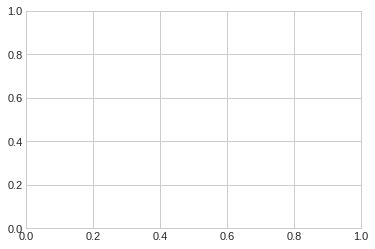

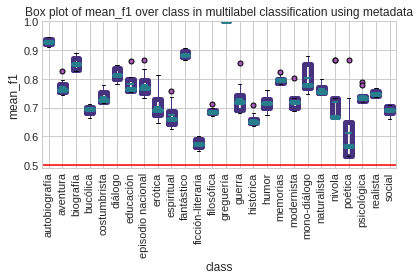

In [71]:
describe_data.boxplots(classification_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10), "mean_f1", "class", wdir,"multilabel classification using metadata", rotation=90, baseline=0.5,ylim=[0.49,1])

Box plots observing different parameters:

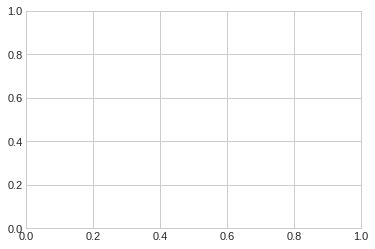

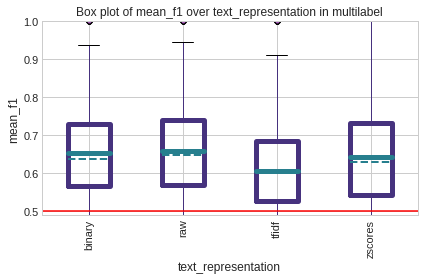

In [72]:
describe_data.boxplots(classification_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class","text_representation"]).head(100), "mean_f1", "text_representation", wdir,"multilabel", rotation=90, baseline=0.5,ylim=[0.49,1])

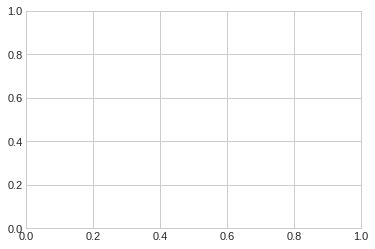

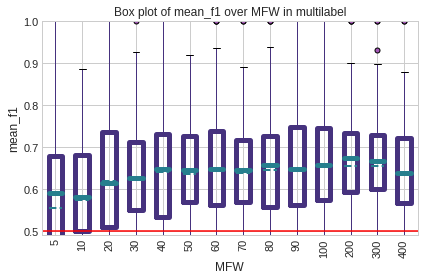

In [73]:
describe_data.boxplots(classification_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class","MFW"]).head(10), "mean_f1", "MFW", wdir,"multilabel", rotation=90, baseline=0.5,ylim=[0.49,1])

In [57]:
classification_results_linguistic_features_df.sort_values(by="class",ascending=False).groupby(["class"]).head(1)["mean_f1"].mean()

0.7540000000000001

Building a comparison between the results using linguistic features and the one using literary metadata:

In [58]:
classification_results_linguistic_features_df.sort_values(by="class",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean()


,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,MFW,typography,test_result_pvalue,sample_size,cv,sampling_times
class,,,,,,,,,,,,,
autobiografía,0.6947,0.7250,0.7153,0.6907,0.7076,0.5,0.1947,3510,True,7.678905e-04,52,10,10
aventura,0.7866,0.7900,0.8102,0.7893,0.7936,0.5,0.2866,3410,True,9.296446e-28,98,10,10
biografía,0.6492,0.6633,0.6807,0.6496,0.6666,0.5,0.1492,3110,True,1.500750e-04,60,10,10
bucólica,0.9007,0.8727,0.9463,0.9067,0.9083,0.5,0.4007,2120,True,6.939627e-56,174,10,10
costumbrista,0.8229,0.8750,0.8135,0.7907,0.8175,0.5,0.3229,3300,True,1.634743e-14,32,10,10
diálogo,0.8816,0.9112,0.8667,0.8816,0.9111,0.5,0.3816,2620,True,8.626039e-08,18,9,10
educación,0.5937,0.6073,0.6041,0.5918,0.5993,0.5,0.0937,2130,True,3.604104e-04,140,10,10
episodio nacional,0.8749,0.9150,0.8567,0.8581,0.8900,0.5,0.3749,2520,True,6.967749e-19,22,10,10
erótica,0.8304,0.8900,0.8150,0.8003,0.8225,0.5,0.3304,2910,True,7.979110e-16,34,10,10


In [59]:
classification_results_metadata_df.sort_values(by="class",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean()

,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,MFW,typography,test_result_pvalue,sample_size,cv,sampling_times
class,,,,,,,,,,,,,
autobiografía,0.7837,0.8149,0.7891,0.7769,0.7934,0.5,0.2837,112.0,True,1.381110e-05,52.0,10.0,10.0
aventura,0.6911,0.7040,0.7155,0.6933,0.7017,0.5,0.1911,124.0,True,4.368649e-12,98.0,10.0,10.0
biografía,0.7037,0.7266,0.7336,0.6927,0.7117,0.5,0.2037,68.5,True,1.005866e-01,60.0,10.0,10.0
bucólica,0.5967,0.5769,0.6642,0.6274,0.6403,0.5,0.0967,157.5,True,5.820462e-02,174.0,10.0,10.0
costumbrista,0.5970,0.6550,0.5885,0.6038,0.6600,0.5,0.0970,203.0,True,8.644909e-02,32.0,10.0,10.0
diálogo,0.7227,0.7800,0.7100,0.6992,0.7500,0.5,0.2227,89.0,True,1.890726e-06,28.0,10.0,10.0
educación,0.7045,0.6930,0.7440,0.7169,0.7221,0.5,0.2045,102.0,True,8.292881e-02,140.0,10.0,10.0
episodio nacional,0.6926,0.7650,0.6583,0.6820,0.7500,0.5,0.1926,104.0,True,5.484609e-04,22.0,10.0,10.0
erótica,0.5354,0.6000,0.5316,0.5145,0.5675,0.5,0.0354,107.0,True,2.928507e-01,34.0,10.0,10.0


In [60]:
comparison_results_df = pd.DataFrame(
    [
    classification_results_linguistic_features_df.sort_values(by="class",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean()["mean_f1"].tolist(),
    classification_results_metadata_df.sort_values(by="class",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean()["mean_f1"].tolist()
    ],
    columns=classification_results_linguistic_features_df.sort_values(by="class",ascending=True).groupby(["class"]).head(1)["class"].tolist(),
index=["mean-F1-linguistic-features","mean-F1-literary-features"]
).T


In [61]:
comparison_results_df

,mean-F1-linguistic-features,mean-F1-literary-features
autobiografía,0.6947,0.7837
aventura,0.7866,0.6911
biografía,0.6492,0.7037
bucólica,0.9007,0.5967
costumbrista,0.8229,0.5970
diálogo,0.8816,0.7227
educación,0.5937,0.7045
episodio nacional,0.8749,0.6926
erótica,0.8304,0.5354
espiritual,0.7025,0.5537


In [65]:
comparison_results_df.sort_values(by="mean-F1-linguistic-features")

,mean-F1-linguistic-features,mean-F1-literary-features
poética,0.5399,0.3399
psicológica,0.5740,0.6160
educación,0.5937,0.7045
fantástico,0.6475,0.8177
biografía,0.6492,0.7037
memorias,0.6574,0.7042
social,0.6699,0.6052
ficción-literaria,0.6932,0.5212
autobiografía,0.6947,0.7837
espiritual,0.7025,0.5537


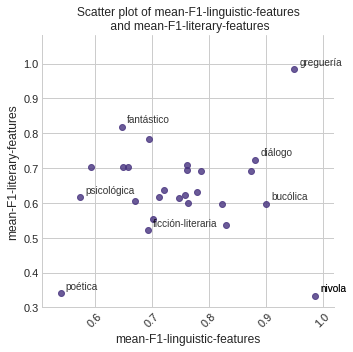

In [67]:
describe_data.describe_corpus_scatter(comparison_results_df, wdir, "mean-F1-linguistic-features","mean-F1-literary-features","comparison", fit_reg=False, annotation_lt=["nivola","greguería","nivola","poética","ficción-literaria","fantástico","bucólica","diálogo","psicológica"])

In [115]:
comparison_results_df

,mean-F1-linguistic-features,mean-F1-literary-features
autobiografía,0.6947,0.7837
aventura,0.7866,0.6911
biografía,0.6492,0.7037
bucólica,0.9007,0.5967
costumbrista,0.8229,0.5970
diálogo,0.8816,0.7227
educación,0.5937,0.7045
episodio nacional,0.8749,0.6926
erótica,0.8304,0.5354
espiritual,0.7025,0.5537


Do they correlate? No, they do not:

In [116]:
stats.pearsonr(
    comparison_results_df["mean-F1-linguistic-features"],
    comparison_results_df["mean-F1-literary-features"]
)

(0.08524133923015206, 0.6788552159441004)

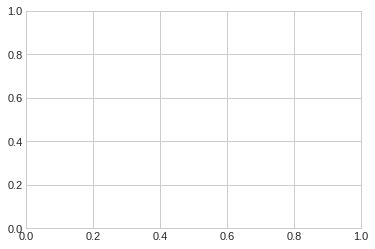

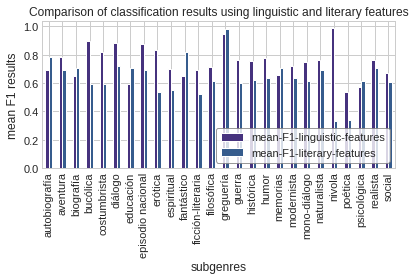

In [117]:
fig  = plt.subplots()

fig = comparison_results_df.sort_index().plot.bar(title = 'Comparison of classification results using linguistic and literary features')
fig.set_ylabel("mean F1 results")
fig.set_xlabel("subgenres")
#    plt.title(r"Box plot of " + class_ + " over "+ class_by +" in "+dataset)

plt.legend(loc="lower right", frameon=True, edgecolor="gray")

plt.tight_layout()
fig.get_figure().savefig(wdir+"/visualisations/literary-linguistic-features-f1.png", dpi=300, format="png")
plt.show(fig)


## Concatenation

Now, the literary metadata are merged with the linguistic features:

In [109]:
log1000_rel_tags_ling_pos_diff_mw_ord_ent_df

,",@form_punctuation@pos",am.divs,1@person,am.verses,de@form_adposition@pos,am.sps,2@person,am.paragraphs,.@form_punctuation@pos,am.pds,...,formalizó@form_verb@pos,volvime@form_adjective@pos,pegadito@form_verb@pos,lavarán@form_verb@pos,abrumo@form_verb@pos,cestillos@form_noun@pos,glicina@form_noun@pos,patriarcalmente@form_adverb@pos,impeler@form_verb@pos,fumadora@form_noun@pos
ne0001,-0.297853,-0.779049,-0.432136,-0.719430,-0.320571,-1.351398,-0.474437,-0.339293,-0.320416,-0.408714,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0002,-0.254986,-0.824987,-0.363897,-1.351398,-0.319076,-1.351398,-0.422360,-0.436921,-0.357784,-0.470057,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0003,-0.249670,-0.799585,-0.338122,-1.351398,-0.326766,-1.351398,-0.423879,-0.436667,-0.351061,-0.470299,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0004,-0.248882,-0.803048,-0.329101,-1.351398,-0.322757,-1.351398,-0.412508,-0.440230,-0.343546,-0.468767,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0005,-0.259251,-0.810890,-0.315700,-1.351398,-0.316879,-1.351398,-0.389007,-0.493901,-0.345955,-0.561252,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0006,-0.264530,-0.802687,-0.346966,-1.351398,-0.316124,-0.735149,-0.431857,-0.478285,-0.346784,-0.538973,...,-1.351398,-1.351398,-1.348860,-1.351398,-1.351398,-1.348860,-1.351398,-1.351398,-1.351398,-1.351398
ne0007,-0.259671,-0.800511,-0.380673,-0.809958,-0.292491,-1.351398,-0.435695,-0.452667,-0.390785,-0.513979,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0008,-0.274699,-0.947513,-0.358842,-1.351398,-0.323801,-1.351398,-0.420711,-0.395201,-0.390093,-0.459557,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0009,-0.268377,-0.795152,-0.370550,-0.979661,-0.312004,-0.706203,-0.420002,-0.430564,-0.323864,-0.497909,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398
ne0010,-0.307638,-0.819191,-0.411630,-1.351398,-0.320983,-1.351398,-0.478117,-0.411978,-0.379963,-0.478545,...,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398,-1.351398


In [110]:
trans_log1000_rel_tags_ling_pos_diff_mw_ord_ent_df = log1000_rel_tags_ling_pos_diff_mw_ord_ent_df + np.absolute(log1000_rel_tags_ling_pos_diff_mw_ord_ent_df.values.min())
trans_log1000_rel_tags_ling_pos_diff_mw_ord_ent_df.head(3)

,",@form_punctuation@pos",am.divs,1@person,am.verses,de@form_adposition@pos,am.sps,2@person,am.paragraphs,.@form_punctuation@pos,am.pds,...,formalizó@form_verb@pos,volvime@form_adjective@pos,pegadito@form_verb@pos,lavarán@form_verb@pos,abrumo@form_verb@pos,cestillos@form_noun@pos,glicina@form_noun@pos,patriarcalmente@form_adverb@pos,impeler@form_verb@pos,fumadora@form_noun@pos
ne0001,1.053545,0.572349,0.919262,0.631968,1.030827,0.0,0.876961,1.012105,1.030982,0.942684,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0002,1.096412,0.526411,0.987501,0.000000,1.032322,0.0,0.929038,0.914477,0.993614,0.881341,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0003,1.101728,0.551813,1.013276,0.000000,1.024632,0.0,0.927519,0.914731,1.000337,0.881099,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [112]:
metadata_features_df = metadata_features_df.reindex(metadata_features_df.median().sort_values(ascending=False).index, axis=1)
metadata_features_df = metadata_features_df[metadata_features_df.sum()[metadata_features_df.sum() > 2].index]
metadata_features_df.shape

(352, 93)

In [113]:
metadata_anno_features_df = pd.merge(metadata_features_df,trans_log1000_rel_tags_ling_pos_diff_mw_ord_ent_df, left_index=True,right_index=True)

In [114]:
metadata_anno_features_df.head()

,setting.settlement.represented.exist,representation_ordinal,setting.continent_Europe,setting.country_Spain,protagonist.gender_male,setting.type_ordinal,narrator_heterodiegetic,time.period_ordinal,protagonist.age_ordinal,protagonist.socLevel_ordinal,...,formalizó@form_verb@pos,volvime@form_adjective@pos,pegadito@form_verb@pos,lavarán@form_verb@pos,abrumo@form_verb@pos,cestillos@form_noun@pos,glicina@form_noun@pos,patriarcalmente@form_adverb@pos,impeler@form_verb@pos,fumadora@form_noun@pos
ne0001,True,1.0,1,1,1,0.333333,0,0.75,1.000000,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0002,True,1.0,1,1,0,1.000000,1,0.75,0.666667,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0003,True,1.0,1,1,1,1.000000,0,0.75,0.666667,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0004,True,1.0,1,1,0,1.000000,0,0.75,0.666667,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ne0005,True,1.0,1,1,0,1.000000,1,0.75,0.333333,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Classification using literary and linguistic features is run:

In [ ]:
combined_results_metadata_df = classify.classify(wdir, freq_table  = metadata_anno_features_df,
             metadata = new_metadata_df, 
             classes = semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [5,10,20,30,40,50,60,70,80,90,100,200,300,400,500,1000,2000,3000,5000,7000], text_representations = ["raw","tfidf","binary","zscores"], typographies = [True],
             sampling_mode = "cross", problematic_class_values = ["n.av.", "other", "mixed", "?", "unknown","none", "second-person"],
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
                                        sort_by="none"
             )

In [64]:
combined_results_metadata_df.to_csv(wdir+"combined_results_metadata.csv", sep="\t")

In [8]:
combined_results_metadata_df = pd.read_csv(wdir+"combined_results_metadata.csv", sep="\t", index_col=0)

Median of the top results:

In [9]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].median().round(2)


0.86

In [10]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].std().round(2)


0.09

In [33]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
920,greguería,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,binary,5,True,[1. 1. 0. 0.67 0.67 0. 1. 1. 0.67 ...,2.454251e-03,ne0173 1\nne0259 0\nne0172 1\nne0361 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1515,nivola,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,zscores,1000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,0.000000e+00,ne0069 1\nne0135 0\nne0336 0\nne0322 ...,10,5,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1934,mono-diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,raw,500,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,1.083461e-16,ne0275 1\nne0250 1\nne0303 0\nne0252 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
398,diálogo,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,zscores,5000,True,[0.8 0.67 0.8 0.5 1. 1. 0.67 0. 1. ...,1.077049e-39,ne0224 1\nne0092 0\nne0254 0\nne0275 ...,28,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1859,bucólica,0.983,0.988,0.980,0.983,0.983,0.5,0.483,LR,raw,7000,True,[0.94 0.95 1. 0.88 0.94 1. 0.95 0.94 1. ...,3.480526e-111,ne0167 0\nne0053 1\nne0069 1\nne0335 ...,174,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
495,episodio nacional,0.967,1.000,0.950,0.933,0.950,0.5,0.467,LR,raw,1000,True,[1. 1. 1. 1. 1. 1. 0.67 1. 1. ...,1.250394e-27,ne0284 1\nne0381 0\nne0282 1\nne0283 ...,22,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
576,erótica,0.960,1.000,0.933,0.947,0.950,0.5,0.460,LR,raw,2000,True,[1. 0.8 0.8 1. 0.8 1. 1. 1. 1. ...,1.107873e-27,ne0345 0\nne0043 0\nne0227 1\nne0040 ...,34,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
730,fantástico,0.947,0.917,1.000,0.956,0.958,0.5,0.447,LR,raw,100,True,[1. 0.8 0.8 0.86 1. 1. 0.8 1. 1. ...,2.360256e-34,ne0363 0\nne0399 0\nne0086 0\nne0223 ...,48,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
6,autobiografía,0.931,0.933,0.950,0.931,0.933,0.5,0.431,LR,raw,60,True,[0.86 0.8 1. 0.86 1. 1. 1. 1. 0.8 ...,2.628103e-43,ne0242 1\nne0333 1\nne0009 0\nne0362 ...,52,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
1034,guerra,0.927,0.950,0.933,0.920,0.925,0.5,0.427,LR,zscores,500,True,[1. 0.67 0.67 0.8 0.8 0.8 0.8 1. 0.8 ...,4.762401e-31,ne0332 0\nne0114 1\nne0226 0\nne0163 ...,42,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


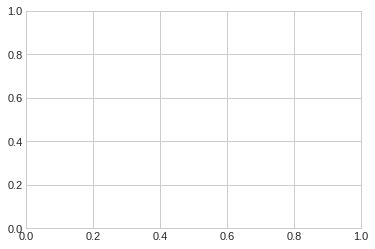

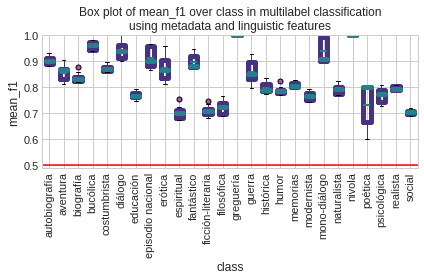

In [68]:
describe_data.boxplots(combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10), "mean_f1", "class", wdir,"multilabel classification\nusing metadata and linguistic features", rotation=90, baseline=0.5,ylim=[0.49,1])

In [192]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean()

0.8349615384615385

In [193]:
classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean()

0.7914346153846153

In [189]:
stats.ttest_ind(
    combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"],
    classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"]
)


Ttest_indResult(statistic=0.798673187627769, pvalue=0.4282574398130784)

In [190]:
stats.ttest_ind(
    combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"],
    classification_results_linguistic_features_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"]
)

Ttest_indResult(statistic=4.750930899472364, pvalue=2.62588310365337e-06)

# 7.1.6. Subgenres as Gradual Categories: Probabilities of Classification


In [91]:
rel_quantified_subgenre_df = quantified_subgenre_df.divide(metadata_df["number.sources"],axis=0)
rel_quantified_subgenre_df.head(15)

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,0.333333,0,0,0,0,0,0,0,0,...,0,0.333333,0,0,0,0.333333,0.333333,0,0,0.333333
ne0002,0,0,0,0,0,0,0,0,0,0.25,...,0,0.25,0,0,0,0.5,0.25,0,0,0.25
ne0003,0,0,0,0,0,0,0,0,0.5,0,...,0,0.25,0,0,0,0.25,0.25,0,0,0.25
ne0004,0,0,0,0,0,0,0,0,0.5,0,...,0,0,0,0,0,0.5,0.25,0,0,0.25
ne0005,0,0,0,0,0,0.25,0,0,0.5,0,...,0,0.25,0,0,0,0.5,0.25,0,0,0.25
ne0006,0,0,0,0,0,0.25,0,0,0.5,0,...,0,0.25,0,0,0,0.5,0.25,0,0,0.25
ne0007,0,0,0,0,0,0,0,0.2,0,0,...,0,0.6,0,0,0,0.2,0.2,0,0,0.2
ne0008,0,0,0,0,0,0,0,0.5,0,0,...,0,0,0,0,0,0.25,0.25,0,0,0.25
ne0009,0,0,0,0,0,0.2,0,0,0,0,...,0,0.4,0,0,0,0.4,0.2,0,0,0.2
ne0010,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.333333,0,0,0


In [92]:
Counter(new_metadata_df["number.sources"]>1)

Counter({False: 13, True: 339})

Showing data of the text ne0292:

In [93]:
pd.DataFrame(
    [
    quantified_subgenre_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica"]],
    new_metadata_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica","number.sources"]],
    rel_quantified_subgenre_df.loc["ne0292"][["ficción-literaria","histórica","guerra","erótica","number.sources"]],
    ],
            index=["amount of sources","binary","proportion"]).fillna(5)

,ficción-literaria,histórica,guerra,erótica,number.sources
amount of sources,1.0,3.0,1.0,0.0,5.0
binary,1.0,1.0,1.0,0.0,5.0
proportion,0.2,0.6,0.2,0.0,5.0


Bar plots of the labels as proportions:

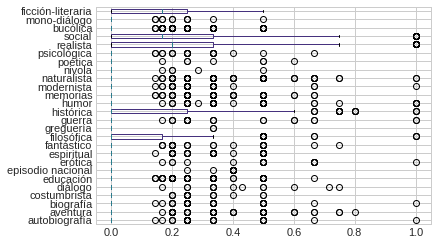

In [94]:
rel_quantified_subgenre_df.plot.box(vert=False)

In [95]:
quantified_subgenre_df = quantified_subgenre_df.loc[new_metadata_df.index]
rel_quantified_subgenre_df = rel_quantified_subgenre_df.loc[new_metadata_df.index]

Transformation data from proportions to ordinal values:

In [96]:
quant_rel_quantified_subgenre_df = rel_quantified_subgenre_df.copy()

for column in rel_quantified_subgenre_df.columns.tolist():
    if quant_rel_quantified_subgenre_df[column].max() > 0.5:
        quant_rel_quantified_subgenre_df[column] = pd.cut(rel_quantified_subgenre_df[column], bins = [-1,0.1,0.7,12], labels = [0,0.5,1], include_lowest=True)
    else:
        quant_rel_quantified_subgenre_df[column] = pd.cut(rel_quantified_subgenre_df[column], bins = [-1,0.1,0.3,12], labels = [0,0.2,0.5], include_lowest=True)

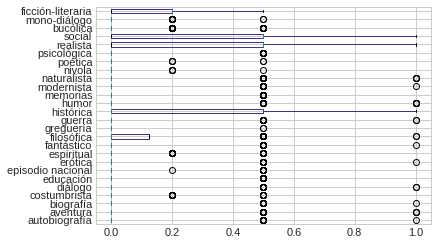

In [97]:
quant_rel_quantified_subgenre_df.astype(float).plot.box(vert=False)

## Functions

In [62]:
from sklearn.linear_model import (LinearRegression, Ridge, Lasso, HuberRegressor,
ARDRegression, BayesianRidge, ElasticNet, Lars, LassoLars, PassiveAggressiveRegressor,
RANSACRegressor, TheilSenRegressor, lars_path, ridge_regression)

from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.svm import SVR


def choose_regression_algorithm(method = "LR"):

    if method == "LR":
        regression_algorithm = LinearRegression()

    elif method == "Lasso":
        regression_algorithm = Lasso()

    elif method == "Ridge":
        regression_algorithm = Ridge()

    elif method == "HR":
        regression_algorithm = HuberRegressor()        
        
    elif method == "SVR":
        regression_algorithm = SVR()
        
    elif method == "LL":
        regression_algorithm = LassoLars()

    elif method == "ARDR":
        regression_algorithm = ARDRegression()

    elif method == "BR":
        regression_algorithm = BayesianRidge()

    elif method == "ElasticNet":
        regression_algorithm = ElasticNet()

    elif method == "Lars":
        regression_algorithm = Lars()

    elif method == "PA":
        regression_algorithm = PassiveAggressiveRegressor()

    elif method == "RANSAC":
        regression_algorithm = RANSACRegressor()

    elif method == "TS":
        regression_algorithm = TheilSenRegressor()

    elif method == "LP":
        regression_algorithm = lars_path()

    elif method == "RR":
        regression_algorithm = ridge_regression()
        
    else:
        print("You haven't chosen a valide classifier!!!")
    print("method used:\t", method)   
    return regression_algorithm

def regressing(wdir, features, outputs, classes, methods_lt, max_MFFs, text_representations, make_relative=False, cv=10):
    results_lt = []
    if features.shape[0] != outputs.shape[0]:
        print("Features and output do not have the same shape!")
        return
    print("features ", features.head())
    if make_relative == True:
        features = text2features.calculate_relative_frequencies(features)
    for class_ in classes:
        print("\n\nanalysed class:\t", class_)
        
        for text_representation in text_representations:
            transformed_features = text2features.choose_features(features, text_representation)
            for MFW in max_MFFs:
                print("MFW", MFW)
                transformed_features_cut = load_data.cut_corpus(transformed_features, min_MFF = 0, max_MFF = MFW)
                for method_st in methods_lt:
                    try:
                        regression_algorithm = choose_regression_algorithm(method = method_st)

                        results_dc = cross_validate(regression_algorithm, transformed_features_cut,
                                       outputs[class_], cv=10)
                        mean_results_fl = results_dc["test_score"].mean().round(3)
                        print(mean_results_fl)
                        results_lt.append([class_, text_representation, MFW, method_st, mean_results_fl, "R2"])
                    except:
                        print("problems with ", method_st)
    results_df = pd.DataFrame(results_lt, columns = ["class", "text_representation", "MFW", "method", "mean_results", "scoring"])
    results_df.sort_values(by="mean_results",ascending=False, inplace=True)
    
    return results_df

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


## Labels

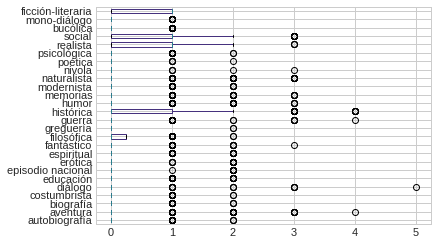

In [63]:
quantified_subgenre_df.plot.box(vert=False)

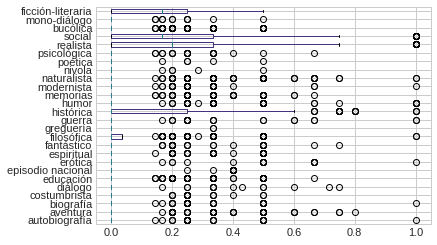

In [64]:
rel_quantified_subgenre_df.plot.box(vert=False)

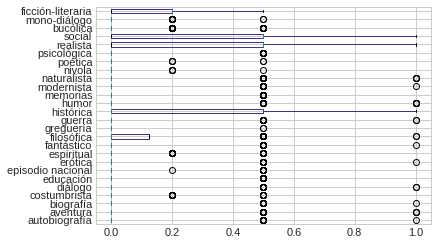

In [65]:
quant_rel_quantified_subgenre_df.astype(float).plot.box(vert=False)

In [66]:
quant_rel_quantified_subgenre_df.sum(axis=1).min()

0.0

In [67]:
quantified_subgenre_df.shape

(352, 26)

In [68]:
rel_tags_ling_pos_diff_mw_ord_ent_df.shape[0]

352

## Regression

Tests with regression that are not reported in the thesis:

In [75]:
results_anno_df = regressing(wdir, features = rel_tags_ling_pos_diff_mw_ord_ent_df,
                             outputs = quant_rel_quantified_subgenre_df, classes = semantic_subgenres_lt,
                             methods_lt = ["Ridge","LR"],
                             max_MFFs = [1000,2000,5000,7000,10000,],
                             text_representations = ["log","log10-zscores","log-tfidf","binary"],
                             make_relative=False, cv=2)

features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           ...      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.231
method used:	 LR
-1.432
MFW 2000
method used:	 Ridge
-0.366
method used:	 LR
-0.378
MFW 5000
method used:	 Ridge
-0.069
method used:	 LR
-0.069
MFW 7000
method used:	 Ridge
-0.061
method used:	 LR
-0.061
MFW 10000
method used:	 Ridge
-0.061
method used:	 LR
-0.061


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.578
method used:	 LR
-0.587
MFW 2000
method used:	 Ridge
-0.232
method used:	 LR
-0.233
MFW 5000
method used:	 Ridge
-0.109
method used:	 LR
-0.107
MFW 7000
method used:	 Ridge
-0.037
method used:	 LR
-0.037
MFW 10000
method used:	 Ridge
-0.034
method used:	 LR
-0.034


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.026
method used:	 LR
-1.457
MFW 2000
method used:	 Ridge
-0.297
method used:	 LR
-2.14
MFW 5000
method used:	 Ridge
-0.088
method used:	 LR
-0.09
MFW 7000
method used:	 Ridge
-0.03
method used:	 LR
-0.029
MFW 10000
method used:	 Ridge
-0.03
method used:	 LR
-0.029
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.532
method used:	 LR
-0.584
MFW 2000
method used:	 Ridge
-0.169
method used:	 LR
-0.174
MFW 5000
method used:	 Ridge
-0.058
method used:	 LR
-0.058
MFW 7000
method used:	 Ridge
-0.026
method used:	 LR
-0.026
MFW 10000
method used:	 Ridge
-0.026
method used:	 LR
-0.025


analysed class:	 aventura


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.563
method used:	 LR
-0.654
MFW 2000
method used:	 Ridge
-0.28
method used:	 LR
-0.284
MFW 5000
method used:	 Ridge
0.182
method used:	 LR
0.182
MFW 7000
method used:	 Ridge
0.197
method used:	 LR
0.197
MFW 10000
method used:	 Ridge
0.197
method used:	 LR
0.197


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.588
method used:	 LR
-0.604
MFW 2000
method used:	 Ridge
-0.022
method used:	 LR
-0.023
MFW 5000
method used:	 Ridge
0.216
method used:	 LR
0.213
MFW 7000
method used:	 Ridge
0.23
method used:	 LR
0.23
MFW 10000
method used:	 Ridge
0.23
method used:	 LR
0.23


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.079
method used:	 LR
-1.196
MFW 2000
method used:	 Ridge
-0.175
method used:	 LR
-3.679
MFW 5000
method used:	 Ridge
0.099
method used:	 LR
0.098
MFW 7000
method used:	 Ridge
0.18
method used:	 LR
0.18
MFW 10000
method used:	 Ridge
0.181
method used:	 LR
0.181
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.445
method used:	 LR
-0.496
MFW 2000
method used:	 Ridge
-0.035
method used:	 LR
-0.039
MFW 5000
method used:	 Ridge
0.045
method used:	 LR
0.044
MFW 7000
method used:	 Ridge
0.1
method used:	 LR
0.099
MFW 10000
method used:	 Ridge
0.1
method used:	 LR
0.102


analysed class:	 biografía


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.287
method used:	 LR
-1.48
MFW 2000
method used:	 Ridge
-0.346
method used:	 LR
-0.355
MFW 5000
method used:	 Ridge
-0.087
method used:	 LR
-0.087
MFW 7000
method used:	 Ridge
-0.08
method used:	 LR
-0.08
MFW 10000
method used:	 Ridge
-0.08
method used:	 LR
-0.08


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.599
method used:	 LR
-0.607
MFW 2000
method used:	 Ridge
-0.237
method used:	 LR
-0.238
MFW 5000
method used:	 Ridge
-0.154
method used:	 LR
-0.152
MFW 7000
method used:	 Ridge
-0.083
method used:	 LR
-0.083
MFW 10000
method used:	 Ridge
-0.08
method used:	 LR
-0.08


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.035
method used:	 LR
-1.472
MFW 2000
method used:	 Ridge
-0.33
method used:	 LR
-2.172
MFW 5000
method used:	 Ridge
-0.13
method used:	 LR
-0.13
MFW 7000
method used:	 Ridge
-0.082
method used:	 LR
-0.082
MFW 10000
method used:	 Ridge
-0.083
method used:	 LR
-0.082
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.52
method used:	 LR
-0.566
MFW 2000
method used:	 Ridge
-0.162
method used:	 LR
-0.166
MFW 5000
method used:	 Ridge
-0.086
method used:	 LR
-0.086
MFW 7000
method used:	 Ridge
-0.059
method used:	 LR
-0.06
MFW 10000
method used:	 Ridge
-0.059
method used:	 LR
-0.059


analysed class:	 costumbrista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.183
method used:	 LR
-0.215
MFW 2000
method used:	 Ridge
-0.15
method used:	 LR
-0.152
MFW 5000
method used:	 Ridge
0.069
method used:	 LR
0.069
MFW 7000
method used:	 Ridge
0.07
method used:	 LR
0.07
MFW 10000
method used:	 Ridge
0.07
method used:	 LR
0.07


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.082
method used:	 LR
-0.085
MFW 2000
method used:	 Ridge
0.021
method used:	 LR
0.021
MFW 5000
method used:	 Ridge
0.071
method used:	 LR
0.07
MFW 7000
method used:	 Ridge
0.077
method used:	 LR
0.077
MFW 10000
method used:	 Ridge
0.078
method used:	 LR
0.078


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.022
method used:	 LR
-0.219
MFW 2000
method used:	 Ridge
-0.057
method used:	 LR
-0.347
MFW 5000
method used:	 Ridge
0.051
method used:	 LR
0.051
MFW 7000
method used:	 Ridge
0.087
method used:	 LR
0.087
MFW 10000
method used:	 Ridge
0.087
method used:	 LR
0.087
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.093
method used:	 LR
-0.105
MFW 2000
method used:	 Ridge
0.004
method used:	 LR
0.003
MFW 5000
method used:	 Ridge
0.041
method used:	 LR
0.041
MFW 7000
method used:	 Ridge
0.054
method used:	 LR
0.054
MFW 10000
method used:	 Ridge
0.054
method used:	 LR
0.054


analysed class:	 diálogo


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.395
method used:	 LR
0.377
MFW 2000
method used:	 Ridge
0.306
method used:	 LR
0.307
MFW 5000
method used:	 Ridge
0.312
method used:	 LR
0.312
MFW 7000
method used:	 Ridge
0.329
method used:	 LR
0.33
MFW 10000
method used:	 Ridge
0.329
method used:	 LR
0.329


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.255
method used:	 LR
0.254
MFW 2000
method used:	 Ridge
0.283
method used:	 LR
0.283
MFW 5000
method used:	 Ridge
0.322
method used:	 LR
0.322
MFW 7000
method used:	 Ridge
0.306
method used:	 LR
0.306
MFW 10000
method used:	 Ridge
0.306
method used:	 LR
0.306


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.001
method used:	 LR
0.281
MFW 2000
method used:	 Ridge
-0.06
method used:	 LR
-0.548
MFW 5000
method used:	 Ridge
0.167
method used:	 LR
0.166
MFW 7000
method used:	 Ridge
0.289
method used:	 LR
0.289
MFW 10000
method used:	 Ridge
0.289
method used:	 LR
0.289
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.128
method used:	 LR
0.118
MFW 2000
method used:	 Ridge
0.189
method used:	 LR
0.188
MFW 5000
method used:	 Ridge
0.221
method used:	 LR
0.221
MFW 7000
method used:	 Ridge
0.234
method used:	 LR
0.233
MFW 10000
method used:	 Ridge
0.234
method used:	 LR
0.234


analysed class:	 educación


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.269
method used:	 LR
-1.492
MFW 2000
method used:	 Ridge
-0.869
method used:	 LR
-0.884
MFW 5000
method used:	 Ridge
-0.263
method used:	 LR
-0.263
MFW 7000
method used:	 Ridge
-0.235
method used:	 LR
-0.235
MFW 10000
method used:	 Ridge
-0.235
method used:	 LR
-0.235


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.866
method used:	 LR
-0.875
MFW 2000
method used:	 Ridge
-0.473
method used:	 LR
-0.474
MFW 5000
method used:	 Ridge
-0.204
method used:	 LR
-0.199
MFW 7000
method used:	 Ridge
-0.135
method used:	 LR
-0.135
MFW 10000
method used:	 Ridge
-0.136
method used:	 LR
-0.136


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.047
method used:	 LR
-1.128
MFW 2000
method used:	 Ridge
-0.794
method used:	 LR
-3.806
MFW 5000
method used:	 Ridge
-0.315
method used:	 LR
-0.321
MFW 7000
method used:	 Ridge
-0.154
method used:	 LR
-0.154
MFW 10000
method used:	 Ridge
-0.155
method used:	 LR
-0.155
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.962
method used:	 LR
-1.077
MFW 2000
method used:	 Ridge
-0.465
method used:	 LR
-0.478
MFW 5000
method used:	 Ridge
-0.23
method used:	 LR
-0.231
MFW 7000
method used:	 Ridge
-0.138
method used:	 LR
-0.135
MFW 10000
method used:	 Ridge
-0.138
method used:	 LR
-0.139


analysed class:	 episodio nacional


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.409
method used:	 LR
-0.453
MFW 2000
method used:	 Ridge
-0.35
method used:	 LR
-0.356
MFW 5000
method used:	 Ridge
-0.102
method used:	 LR
-0.102
MFW 7000
method used:	 Ridge
-0.104
method used:	 LR
-0.105
MFW 10000
method used:	 Ridge
-0.104
method used:	 LR
-0.105


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.512
method used:	 LR
-0.518
MFW 2000
method used:	 Ridge
-0.153
method used:	 LR
-0.151
MFW 5000
method used:	 Ridge
-0.119
method used:	 LR
-0.118
MFW 7000
method used:	 Ridge
-0.102
method used:	 LR
-0.102
MFW 10000
method used:	 Ridge
-0.102
method used:	 LR
-0.102


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.05
method used:	 LR
-0.434
MFW 2000
method used:	 Ridge
-0.274
method used:	 LR
-1.172
MFW 5000
method used:	 Ridge
-0.158
method used:	 LR
-0.157
MFW 7000
method used:	 Ridge
-0.126
method used:	 LR
-0.123
MFW 10000
method used:	 Ridge
-0.127
method used:	 LR
-0.124
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.503
method used:	 LR
-0.537
MFW 2000
method used:	 Ridge
-0.302
method used:	 LR
-0.307
MFW 5000
method used:	 Ridge
-0.124
method used:	 LR
-0.124
MFW 7000
method used:	 Ridge
-0.108
method used:	 LR
-0.108
MFW 10000
method used:	 Ridge
-0.108
method used:	 LR
-0.108


analysed class:	 erótica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.894
method used:	 LR
-1.097
MFW 2000
method used:	 Ridge
-0.393
method used:	 LR
-0.397
MFW 5000
method used:	 Ridge
-0.05
method used:	 LR
-0.05
MFW 7000
method used:	 Ridge
-0.045
method used:	 LR
-0.045
MFW 10000
method used:	 Ridge
-0.045
method used:	 LR
-0.045


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.257
method used:	 LR
-0.263
MFW 2000
method used:	 Ridge
-0.116
method used:	 LR
-0.117
MFW 5000
method used:	 Ridge
-0.033
method used:	 LR
-0.035
MFW 7000
method used:	 Ridge
-0.016
method used:	 LR
-0.016
MFW 10000
method used:	 Ridge
-0.015
method used:	 LR
-0.015


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.015
method used:	 LR
-0.605
MFW 2000
method used:	 Ridge
-0.255
method used:	 LR
-1.12
MFW 5000
method used:	 Ridge
-0.069
method used:	 LR
-0.069
MFW 7000
method used:	 Ridge
-0.064
method used:	 LR
-0.064
MFW 10000
method used:	 Ridge
-0.065
method used:	 LR
-0.064
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.208
method used:	 LR
-0.224
MFW 2000
method used:	 Ridge
-0.074
method used:	 LR
-0.076
MFW 5000
method used:	 Ridge
-0.099
method used:	 LR
-0.099
MFW 7000
method used:	 Ridge
-0.097
method used:	 LR
-0.097
MFW 10000
method used:	 Ridge
-0.096
method used:	 LR
-0.098


analysed class:	 espiritual


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-3.884
method used:	 LR
-4.393
MFW 2000
method used:	 Ridge
-3.07
method used:	 LR
-3.114
MFW 5000
method used:	 Ridge
-1.23
method used:	 LR
-1.232
MFW 7000
method used:	 Ridge
-1.213
method used:	 LR
-1.214
MFW 10000
method used:	 Ridge
-1.213
method used:	 LR
-1.213


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-2.967
method used:	 LR
-2.998
MFW 2000
method used:	 Ridge
-1.716
method used:	 LR
-1.725
MFW 5000
method used:	 Ridge
-1.014
method used:	 LR
-1.013
MFW 7000
method used:	 Ridge
-0.802
method used:	 LR
-0.802
MFW 10000
method used:	 Ridge
-0.804
method used:	 LR
-0.804


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.155
method used:	 LR
-3.119
MFW 2000
method used:	 Ridge
-1.758
method used:	 LR
-10.204
MFW 5000
method used:	 Ridge
-1.502
method used:	 LR
-1.503
MFW 7000
method used:	 Ridge
-0.84
method used:	 LR
-0.839
MFW 10000
method used:	 Ridge
-0.839
method used:	 LR
-0.838
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-4.322
method used:	 LR
-5.188
MFW 2000
method used:	 Ridge
-2.371
method used:	 LR
-2.46
MFW 5000
method used:	 Ridge
-1.357
method used:	 LR
-1.369
MFW 7000
method used:	 Ridge
-0.996
method used:	 LR
-0.995
MFW 10000
method used:	 Ridge
-0.996
method used:	 LR
-1.005


analysed class:	 fantástico


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.669
method used:	 LR
-0.792
MFW 2000
method used:	 Ridge
-0.517
method used:	 LR
-0.528
MFW 5000
method used:	 Ridge
0.073
method used:	 LR
0.072
MFW 7000
method used:	 Ridge
0.122
method used:	 LR
0.122
MFW 10000
method used:	 Ridge
0.122
method used:	 LR
0.122


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.703
method used:	 LR
-0.711
MFW 2000
method used:	 Ridge
-0.23
method used:	 LR
-0.231
MFW 5000
method used:	 Ridge
0.115
method used:	 LR
0.116
MFW 7000
method used:	 Ridge
0.154
method used:	 LR
0.154
MFW 10000
method used:	 Ridge
0.158
method used:	 LR
0.158


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.015
method used:	 LR
-0.923
MFW 2000
method used:	 Ridge
-0.509
method used:	 LR
-2.071
MFW 5000
method used:	 Ridge
-0.038
method used:	 LR
-0.042
MFW 7000
method used:	 Ridge
0.099
method used:	 LR
0.1
MFW 10000
method used:	 Ridge
0.099
method used:	 LR
0.1
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.651
method used:	 LR
-0.711
MFW 2000
method used:	 Ridge
-0.197
method used:	 LR
-0.201
MFW 5000
method used:	 Ridge
0.031
method used:	 LR
0.031
MFW 7000
method used:	 Ridge
0.046
method used:	 LR
0.045
MFW 10000
method used:	 Ridge
0.047
method used:	 LR
0.044


analysed class:	 filosófica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.3
method used:	 LR
-1.522
MFW 2000
method used:	 Ridge
-0.855
method used:	 LR
-0.863
MFW 5000
method used:	 Ridge
0.034
method used:	 LR
0.034
MFW 7000
method used:	 Ridge
0.037
method used:	 LR
0.037
MFW 10000
method used:	 Ridge
0.037
method used:	 LR
0.037


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.63
method used:	 LR
-0.639
MFW 2000
method used:	 Ridge
-0.145
method used:	 LR
-0.146
MFW 5000
method used:	 Ridge
0.025
method used:	 LR
0.025
MFW 7000
method used:	 Ridge
0.11
method used:	 LR
0.11
MFW 10000
method used:	 Ridge
0.111
method used:	 LR
0.111


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.072
method used:	 LR
-0.821
MFW 2000
method used:	 Ridge
-0.473
method used:	 LR
-2.724
MFW 5000
method used:	 Ridge
0.027
method used:	 LR
0.027
MFW 7000
method used:	 Ridge
0.097
method used:	 LR
0.097
MFW 10000
method used:	 Ridge
0.096
method used:	 LR
0.096
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.971
method used:	 LR
-1.058
MFW 2000
method used:	 Ridge
-0.092
method used:	 LR
-0.096
MFW 5000
method used:	 Ridge
0.033
method used:	 LR
0.032
MFW 7000
method used:	 Ridge
0.041
method used:	 LR
0.044
MFW 10000
method used:	 Ridge
0.042
method used:	 LR
0.042


analysed class:	 greguería


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 2000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 5000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 7000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 10000
method used:	 Ridge
-0.006
method used:	 LR
-0.006


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 2000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 5000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 7000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 10000
method used:	 Ridge
-0.006
method used:	 LR
-0.006


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 2000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 5000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 7000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 10000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 2000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 5000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 7000
method used:	 Ridge
-0.006
method used:	 LR
-0.006
MFW 10000
method used:	 Ridge
-0.006
method used:	 LR
-0.006


analysed class:	 guerra


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.452
method used:	 LR
-0.583
MFW 2000
method used:	 Ridge
-0.588
method used:	 LR
-0.597
MFW 5000
method used:	 Ridge
0.128
method used:	 LR
0.128
MFW 7000
method used:	 Ridge
0.13
method used:	 LR
0.13
MFW 10000
method used:	 Ridge
0.13
method used:	 LR
0.13


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.685
method used:	 LR
-0.696
MFW 2000
method used:	 Ridge
0.045
method used:	 LR
0.044
MFW 5000
method used:	 Ridge
0.191
method used:	 LR
0.184
MFW 7000
method used:	 Ridge
0.226
method used:	 LR
0.226
MFW 10000
method used:	 Ridge
0.225
method used:	 LR
0.225


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.012
method used:	 LR
-0.984
MFW 2000
method used:	 Ridge
-0.271
method used:	 LR
-2.041
MFW 5000
method used:	 Ridge
0.071
method used:	 LR
0.073
MFW 7000
method used:	 Ridge
0.182
method used:	 LR
0.183
MFW 10000
method used:	 Ridge
0.182
method used:	 LR
0.182
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.692
method used:	 LR
-0.755
MFW 2000
method used:	 Ridge
-0.203
method used:	 LR
-0.21
MFW 5000
method used:	 Ridge
-0.017
method used:	 LR
-0.018
MFW 7000
method used:	 Ridge
0.011
method used:	 LR
0.009
MFW 10000
method used:	 Ridge
0.011
method used:	 LR
0.01


analysed class:	 histórica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.252
method used:	 LR
-0.318
MFW 2000
method used:	 Ridge
-0.364
method used:	 LR
-0.374
MFW 5000
method used:	 Ridge
0.212
method used:	 LR
0.211
MFW 7000
method used:	 Ridge
0.232
method used:	 LR
0.232
MFW 10000
method used:	 Ridge
0.232
method used:	 LR
0.232


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.546
method used:	 LR
-0.555
MFW 2000
method used:	 Ridge
-0.094
method used:	 LR
-0.095
MFW 5000
method used:	 Ridge
0.233
method used:	 LR
0.229
MFW 7000
method used:	 Ridge
0.264
method used:	 LR
0.264
MFW 10000
method used:	 Ridge
0.265
method used:	 LR
0.265


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.105
method used:	 LR
-0.172
MFW 2000
method used:	 Ridge
-0.339
method used:	 LR
-2.789
MFW 5000
method used:	 Ridge
0.162
method used:	 LR
0.159
MFW 7000
method used:	 Ridge
0.258
method used:	 LR
0.258
MFW 10000
method used:	 Ridge
0.258
method used:	 LR
0.259
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.81
method used:	 LR
-0.915
MFW 2000
method used:	 Ridge
-0.24
method used:	 LR
-0.248
MFW 5000
method used:	 Ridge
-0.018
method used:	 LR
-0.02
MFW 7000
method used:	 Ridge
0.055
method used:	 LR
0.054
MFW 10000
method used:	 Ridge
0.055
method used:	 LR
0.053


analysed class:	 humor


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.703
method used:	 LR
-1.909
MFW 2000
method used:	 Ridge
-1.503
method used:	 LR
-1.519
MFW 5000
method used:	 Ridge
-0.251
method used:	 LR
-0.251
MFW 7000
method used:	 Ridge
-0.221
method used:	 LR
-0.221
MFW 10000
method used:	 Ridge
-0.221
method used:	 LR
-0.221


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.058
method used:	 LR
-1.069
MFW 2000
method used:	 Ridge
-0.665
method used:	 LR
-0.667
MFW 5000
method used:	 Ridge
-0.189
method used:	 LR
-0.192
MFW 7000
method used:	 Ridge
-0.125
method used:	 LR
-0.125
MFW 10000
method used:	 Ridge
-0.125
method used:	 LR
-0.126


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.197
method used:	 LR
-2.041
MFW 2000
method used:	 Ridge
-0.972
method used:	 LR
-2.695
MFW 5000
method used:	 Ridge
-0.326
method used:	 LR
-0.324
MFW 7000
method used:	 Ridge
-0.169
method used:	 LR
-0.167
MFW 10000
method used:	 Ridge
-0.17
method used:	 LR
-0.168
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.172
method used:	 LR
-1.351
MFW 2000
method used:	 Ridge
-0.352
method used:	 LR
-0.36
MFW 5000
method used:	 Ridge
-0.254
method used:	 LR
-0.256
MFW 7000
method used:	 Ridge
-0.21
method used:	 LR
-0.212
MFW 10000
method used:	 Ridge
-0.21
method used:	 LR
-0.211


analysed class:	 memorias


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.723
method used:	 LR
-1.976
MFW 2000
method used:	 Ridge
-0.793
method used:	 LR
-0.809
MFW 5000
method used:	 Ridge
-0.061
method used:	 LR
-0.062
MFW 7000
method used:	 Ridge
-0.072
method used:	 LR
-0.072
MFW 10000
method used:	 Ridge
-0.072
method used:	 LR
-0.072


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.978
method used:	 LR
-0.991
MFW 2000
method used:	 Ridge
-0.351
method used:	 LR
-0.353
MFW 5000
method used:	 Ridge
-0.03
method used:	 LR
-0.033
MFW 7000
method used:	 Ridge
-0.042
method used:	 LR
-0.042
MFW 10000
method used:	 Ridge
-0.045
method used:	 LR
-0.045


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.125
method used:	 LR
-1.782
MFW 2000
method used:	 Ridge
-0.704
method used:	 LR
-2.439
MFW 5000
method used:	 Ridge
-0.104
method used:	 LR
-0.104
MFW 7000
method used:	 Ridge
-0.084
method used:	 LR
-0.083
MFW 10000
method used:	 Ridge
-0.085
method used:	 LR
-0.084
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.576
method used:	 LR
-0.626
MFW 2000
method used:	 Ridge
-0.236
method used:	 LR
-0.241
MFW 5000
method used:	 Ridge
-0.034
method used:	 LR
-0.034
MFW 7000
method used:	 Ridge
-0.05
method used:	 LR
-0.051
MFW 10000
method used:	 Ridge
-0.05
method used:	 LR
-0.05


analysed class:	 modernista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.997
method used:	 LR
-1.102
MFW 2000
method used:	 Ridge
-0.589
method used:	 LR
-0.591
MFW 5000
method used:	 Ridge
-0.12
method used:	 LR
-0.121
MFW 7000
method used:	 Ridge
-0.102
method used:	 LR
-0.103
MFW 10000
method used:	 Ridge
-0.103
method used:	 LR
-0.103


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.675
method used:	 LR
-0.682
MFW 2000
method used:	 Ridge
-0.323
method used:	 LR
-0.324
MFW 5000
method used:	 Ridge
-0.169
method used:	 LR
-0.179
MFW 7000
method used:	 Ridge
-0.09
method used:	 LR
-0.09
MFW 10000
method used:	 Ridge
-0.089
method used:	 LR
-0.089


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.066
method used:	 LR
-1.321
MFW 2000
method used:	 Ridge
-0.345
method used:	 LR
-1.429
MFW 5000
method used:	 Ridge
-0.162
method used:	 LR
-0.162
MFW 7000
method used:	 Ridge
-0.071
method used:	 LR
-0.07
MFW 10000
method used:	 Ridge
-0.065
method used:	 LR
-0.064
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.676
method used:	 LR
-0.734
MFW 2000
method used:	 Ridge
-0.165
method used:	 LR
-0.169
MFW 5000
method used:	 Ridge
-0.068
method used:	 LR
-0.068
MFW 7000
method used:	 Ridge
-0.063
method used:	 LR
-0.066
MFW 10000
method used:	 Ridge
-0.063
method used:	 LR
-0.062


analysed class:	 naturalista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-2.193
method used:	 LR
-2.492
MFW 2000
method used:	 Ridge
-0.983
method used:	 LR
-0.988
MFW 5000
method used:	 Ridge
-0.285
method used:	 LR
-0.286
MFW 7000
method used:	 Ridge
-0.271
method used:	 LR
-0.271
MFW 10000
method used:	 Ridge
-0.271
method used:	 LR
-0.271


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.616
method used:	 LR
-1.636
MFW 2000
method used:	 Ridge
-0.587
method used:	 LR
-0.588
MFW 5000
method used:	 Ridge
-0.264
method used:	 LR
-0.254
MFW 7000
method used:	 Ridge
-0.189
method used:	 LR
-0.189
MFW 10000
method used:	 Ridge
-0.187
method used:	 LR
-0.187


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.29
method used:	 LR
-2.024
MFW 2000
method used:	 Ridge
-0.731
method used:	 LR
-3.832
MFW 5000
method used:	 Ridge
-0.447
method used:	 LR
-0.45
MFW 7000
method used:	 Ridge
-0.165
method used:	 LR
-0.167
MFW 10000
method used:	 Ridge
-0.165
method used:	 LR
-0.166
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.856
method used:	 LR
-2.047
MFW 2000
method used:	 Ridge
-0.746
method used:	 LR
-0.762
MFW 5000
method used:	 Ridge
-0.485
method used:	 LR
-0.488
MFW 7000
method used:	 Ridge
-0.37
method used:	 LR
-0.376
MFW 10000
method used:	 Ridge
-0.37
method used:	 LR
-0.377


analysed class:	 nivola


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 2000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 5000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 7000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 10000
method used:	 Ridge
-0.013
method used:	 LR
-0.013


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 2000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 5000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 7000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 10000
method used:	 Ridge
-0.013
method used:	 LR
-0.013


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 2000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 5000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 7000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 10000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 2000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 5000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 7000
method used:	 Ridge
-0.013
method used:	 LR
-0.013
MFW 10000
method used:	 Ridge
-0.013
method used:	 LR
-0.013


analysed class:	 poética


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.186
method used:	 LR
-0.203
MFW 2000
method used:	 Ridge
0.022
method used:	 LR
0.021
MFW 5000
method used:	 Ridge
0.056
method used:	 LR
0.056
MFW 7000
method used:	 Ridge
0.054
method used:	 LR
0.054
MFW 10000
method used:	 Ridge
0.054
method used:	 LR
0.054


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.067
method used:	 LR
-0.068
MFW 2000
method used:	 Ridge
-0.028
method used:	 LR
-0.028
MFW 5000
method used:	 Ridge
0.039
method used:	 LR
0.038
MFW 7000
method used:	 Ridge
0.04
method used:	 LR
0.04
MFW 10000
method used:	 Ridge
0.041
method used:	 LR
0.041


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.005
method used:	 LR
-0.112
MFW 2000
method used:	 Ridge
0.021
method used:	 LR
-0.077
MFW 5000
method used:	 Ridge
0.061
method used:	 LR
0.061
MFW 7000
method used:	 Ridge
0.029
method used:	 LR
0.03
MFW 10000
method used:	 Ridge
0.029
method used:	 LR
0.03
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.077
method used:	 LR
-0.083
MFW 2000
method used:	 Ridge
-0.005
method used:	 LR
-0.005
MFW 5000
method used:	 Ridge
0.043
method used:	 LR
0.043
MFW 7000
method used:	 Ridge
0.049
method used:	 LR
0.049
MFW 10000
method used:	 Ridge
0.049
method used:	 LR
0.049


analysed class:	 psicológica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.045
method used:	 LR
-1.226
MFW 2000
method used:	 Ridge
-0.555
method used:	 LR
-0.563
MFW 5000
method used:	 Ridge
-0.072
method used:	 LR
-0.072
MFW 7000
method used:	 Ridge
-0.071
method used:	 LR
-0.071
MFW 10000
method used:	 Ridge
-0.071
method used:	 LR
-0.071


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.398
method used:	 LR
-0.401
MFW 2000
method used:	 Ridge
-0.114
method used:	 LR
-0.115
MFW 5000
method used:	 Ridge
-0.043
method used:	 LR
-0.044
MFW 7000
method used:	 Ridge
-0.023
method used:	 LR
-0.023
MFW 10000
method used:	 Ridge
-0.023
method used:	 LR
-0.023


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.034
method used:	 LR
-1.455
MFW 2000
method used:	 Ridge
-0.404
method used:	 LR
-1.183
MFW 5000
method used:	 Ridge
-0.1
method used:	 LR
-0.101
MFW 7000
method used:	 Ridge
-0.027
method used:	 LR
-0.027
MFW 10000
method used:	 Ridge
-0.027
method used:	 LR
-0.027
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.811
method used:	 LR
-0.862
MFW 2000
method used:	 Ridge
-0.394
method used:	 LR
-0.399
MFW 5000
method used:	 Ridge
-0.224
method used:	 LR
-0.225
MFW 7000
method used:	 Ridge
-0.188
method used:	 LR
-0.187
MFW 10000
method used:	 Ridge
-0.188
method used:	 LR
-0.188


analysed class:	 realista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.695
method used:	 LR
-0.879
MFW 2000
method used:	 Ridge
-0.324
method used:	 LR
-0.329
MFW 5000
method used:	 Ridge
0.226
method used:	 LR
0.226
MFW 7000
method used:	 Ridge
0.229
method used:	 LR
0.229
MFW 10000
method used:	 Ridge
0.229
method used:	 LR
0.229


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.387
method used:	 LR
-0.397
MFW 2000
method used:	 Ridge
0.057
method used:	 LR
0.055
MFW 5000
method used:	 Ridge
0.271
method used:	 LR
0.271
MFW 7000
method used:	 Ridge
0.271
method used:	 LR
0.271
MFW 10000
method used:	 Ridge
0.271
method used:	 LR
0.271


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.078
method used:	 LR
-0.834
MFW 2000
method used:	 Ridge
-0.494
method used:	 LR
-3.223
MFW 5000
method used:	 Ridge
0.13
method used:	 LR
0.127
MFW 7000
method used:	 Ridge
0.213
method used:	 LR
0.214
MFW 10000
method used:	 Ridge
0.214
method used:	 LR
0.215
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.456
method used:	 LR
-0.512
MFW 2000
method used:	 Ridge
0.03
method used:	 LR
0.025
MFW 5000
method used:	 Ridge
0.196
method used:	 LR
0.196
MFW 7000
method used:	 Ridge
0.205
method used:	 LR
0.206
MFW 10000
method used:	 Ridge
0.204
method used:	 LR
0.205


analysed class:	 social


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.115
method used:	 LR
-1.295
MFW 2000
method used:	 Ridge
-1.055
method used:	 LR
-1.07
MFW 5000
method used:	 Ridge
-0.106
method used:	 LR
-0.107
MFW 7000
method used:	 Ridge
-0.071
method used:	 LR
-0.071
MFW 10000
method used:	 Ridge
-0.071
method used:	 LR
-0.071


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.864
method used:	 LR
-0.881
MFW 2000
method used:	 Ridge
-0.362
method used:	 LR
-0.364
MFW 5000
method used:	 Ridge
-0.086
method used:	 LR
-0.09
MFW 7000
method used:	 Ridge
-0.016
method used:	 LR
-0.016
MFW 10000
method used:	 Ridge
-0.015
method used:	 LR
-0.015


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.086
method used:	 LR
-1.218
MFW 2000
method used:	 Ridge
-0.77
method used:	 LR
-3.773
MFW 5000
method used:	 Ridge
-0.045
method used:	 LR
-0.046
MFW 7000
method used:	 Ridge
0.04
method used:	 LR
0.035
MFW 10000
method used:	 Ridge
0.041
method used:	 LR
0.036
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.678
method used:	 LR
-0.739
MFW 2000
method used:	 Ridge
-0.266
method used:	 LR
-0.274
MFW 5000
method used:	 Ridge
-0.067
method used:	 LR
-0.069
MFW 7000
method used:	 Ridge
-0.007
method used:	 LR
-0.008
MFW 10000
method used:	 Ridge
-0.008
method used:	 LR
-0.009


analysed class:	 bucólica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.165
method used:	 LR
-0.218
MFW 2000
method used:	 Ridge
0.232
method used:	 LR
0.228
MFW 5000
method used:	 Ridge
0.428
method used:	 LR
0.427
MFW 7000
method used:	 Ridge
0.429
method used:	 LR
0.429
MFW 10000
method used:	 Ridge
0.429
method used:	 LR
0.429


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.348
method used:	 LR
0.347
MFW 2000
method used:	 Ridge
0.4
method used:	 LR
0.4
MFW 5000
method used:	 Ridge
0.437
method used:	 LR
0.437
MFW 7000
method used:	 Ridge
0.463
method used:	 LR
0.463
MFW 10000
method used:	 Ridge
0.463
method used:	 LR
0.463


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.168
method used:	 LR
-0.152
MFW 2000
method used:	 Ridge
0.177
method used:	 LR
-0.098
MFW 5000
method used:	 Ridge
0.402
method used:	 LR
0.403
MFW 7000
method used:	 Ridge
0.45
method used:	 LR
0.45
MFW 10000
method used:	 Ridge
0.451
method used:	 LR
0.45
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.154
method used:	 LR
0.138
MFW 2000
method used:	 Ridge
0.356
method used:	 LR
0.353
MFW 5000
method used:	 Ridge
0.434
method used:	 LR
0.434
MFW 7000
method used:	 Ridge
0.449
method used:	 LR
0.449
MFW 10000
method used:	 Ridge
0.449
method used:	 LR
0.449


analysed class:	 mono-diálogo


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.219
method used:	 LR
0.206
MFW 2000
method used:	 Ridge
0.206
method used:	 LR
0.207
MFW 5000
method used:	 Ridge
0.27
method used:	 LR
0.27
MFW 7000
method used:	 Ridge
0.282
method used:	 LR
0.282
MFW 10000
method used:	 Ridge
0.282
method used:	 LR
0.282


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.164
method used:	 LR
0.162
MFW 2000
method used:	 Ridge
0.264
method used:	 LR
0.264
MFW 5000
method used:	 Ridge
0.252
method used:	 LR
0.249
MFW 7000
method used:	 Ridge
0.253
method used:	 LR
0.253
MFW 10000
method used:	 Ridge
0.252
method used:	 LR
0.252


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
0.002
method used:	 LR
0.176
MFW 2000
method used:	 Ridge
-0.186
method used:	 LR
-0.835
MFW 5000
method used:	 Ridge
0.085
method used:	 LR
0.085
MFW 7000
method used:	 Ridge
0.165
method used:	 LR
0.165
MFW 10000
method used:	 Ridge
0.165
method used:	 LR
0.165
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.036
method used:	 LR
-0.046
MFW 2000
method used:	 Ridge
0.112
method used:	 LR
0.111
MFW 5000
method used:	 Ridge
0.21
method used:	 LR
0.21
MFW 7000
method used:	 Ridge
0.208
method used:	 LR
0.208
MFW 10000
method used:	 Ridge
0.208
method used:	 LR
0.208


analysed class:	 ficción-literaria


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.988
method used:	 LR
-2.201
MFW 2000
method used:	 Ridge
-1.521
method used:	 LR
-1.532
MFW 5000
method used:	 Ridge
-0.51
method used:	 LR
-0.51
MFW 7000
method used:	 Ridge
-0.516
method used:	 LR
-0.517
MFW 10000
method used:	 Ridge
-0.516
method used:	 LR
-0.517


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.177
method used:	 LR
-1.186
MFW 2000
method used:	 Ridge
-0.639
method used:	 LR
-0.642
MFW 5000
method used:	 Ridge
-0.48
method used:	 LR
-0.478
MFW 7000
method used:	 Ridge
-0.503
method used:	 LR
-0.503
MFW 10000
method used:	 Ridge
-0.504
method used:	 LR
-0.504


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.49
method used:	 LR
-2.213
MFW 2000
method used:	 Ridge
-1.264
method used:	 LR
-2.637
MFW 5000
method used:	 Ridge
-0.588
method used:	 LR
-0.59
MFW 7000
method used:	 Ridge
-0.524
method used:	 LR
-0.523
MFW 10000
method used:	 Ridge
-0.526
method used:	 LR
-0.525
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-1.031
method used:	 LR
-1.096
MFW 2000
method used:	 Ridge
-0.545
method used:	 LR
-0.55
MFW 5000
method used:	 Ridge
-0.569
method used:	 LR
-0.57
MFW 7000
method used:	 Ridge
-0.522
method used:	 LR
-0.525
MFW 10000
method used:	 Ridge
-0.522
method used:	 LR
-0.524


In [76]:
results_anno_df.groupby(["class"]).head(1)

,class,text_representation,MFW,method,mean_results,scoring
937,bucólica,log10-zscores,7000,LR,0.463,R2
160,diálogo,log,1000,Ridge,0.395,R2
968,mono-diálogo,log,10000,Ridge,0.282,R2
857,realista,log10-zscores,7000,LR,0.271,R2
539,histórica,log10-zscores,10000,LR,0.265,R2
56,aventura,log10-zscores,7000,Ridge,0.230,R2
497,guerra,log10-zscores,7000,LR,0.226,R2
378,fantástico,log10-zscores,10000,Ridge,0.158,R2
418,filosófica,log10-zscores,10000,Ridge,0.111,R2
147,costumbrista,log-tfidf,7000,LR,0.087,R2


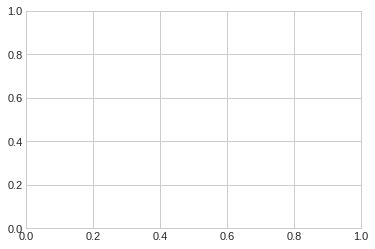

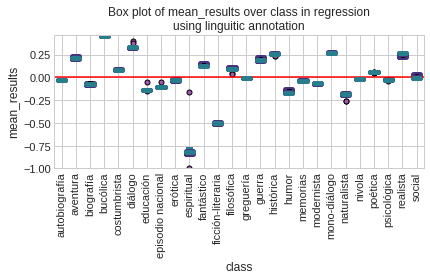

In [77]:
describe_data.boxplots(results_anno_df.groupby(["class"]).head(10), "mean_results", "class", wdir,"regression\nusing linguitic annotation", rotation=90,baseline=0)

In [78]:
results_anno_df.to_csv(wdir+"results_anno_regression.csv",sep="\t")

In [66]:
quant_rel_quantified_subgenre_chapters_df = pd.merge(quant_rel_quantified_subgenre_df, basic_metadata_chapters_df, left_index=True, right_on="idno")
quant_rel_quantified_subgenre_chapters_df.index = quant_rel_quantified_subgenre_chapters_df["id_chapter"]
print(quant_rel_quantified_subgenre_chapters_df.shape)
quant_rel_quantified_subgenre_chapters_df.head()

(10306, 30)


,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,id_chapter,idno,length_text,length_chapters
id_chapter,,,,,,,,,,,,,,,,,,,,,
ne0001_chap1,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,0.0,0.0,0.5,ne0001_chap1,ne0001,8771,31
ne0001_chap2,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,0.0,0.0,0.5,ne0001_chap2,ne0001,11578,31
ne0001_chap3,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,0.0,0.0,0.5,ne0001_chap3,ne0001,7239,31
ne0001_chap4,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,0.0,0.0,0.5,ne0001_chap4,ne0001,10652,31
ne0001_chap5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.5,0.0,0.0,0.5,ne0001_chap5,ne0001,5840,31


In [ ]:
chapers_tokens_results_df = regressing(wdir, features = rel_chapters_df,
                                       outputs = quant_rel_quantified_subgenre_chapters_df, classes = semantic_subgenres_lt,
                                       methods_lt = ["Ridge", "LR"],
                                       max_MFFs = [1000,2000,5000,7000,],
                                       text_representations = ["log","log10-zscores","log-tfidf","binary"],
                                       make_relative=False, cv=10)

features                        ,         .        de        la         y       que  \
ne0001_chap1   0.011059  0.010375  0.010717  0.008893  0.005359  0.003420   
ne0001_chap10  0.010881  0.009857  0.008833  0.006912  0.008961  0.003328   
ne0001_chap11  0.011478  0.009259  0.008488  0.004533  0.005691  0.003858   
ne0001_chap12  0.011371  0.008528  0.008144  0.007299  0.006991  0.006454   
ne0001_chap13  0.013243  0.009439  0.011975  0.005635  0.006199  0.003804   

                     el        en         a       los  ...    cualidad  \
ne0001_chap1   0.005701  0.004560  0.003306  0.002280  ...         0.0   
ne0001_chap10  0.004352  0.003456  0.004864  0.002944  ...         0.0   
ne0001_chap11  0.005883  0.003665  0.003858  0.004533  ...         0.0   
ne0001_chap12  0.004994  0.003765  0.005685  0.002382  ...         0.0   
ne0001_chap13  0.005495  0.004227  0.002254  0.002959  ...         0.0   

               metiéndose  perfumado  rapaces  heredad  causar  boers  \
ne0001_ch

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.423
method used:	 LR
-0.423
MFW 2000
method used:	 Ridge
-0.539
method used:	 LR
-2.221350814699708e+24
MFW 5000
method used:	 Ridge
-1.093
method used:	 LR
-8.432570497461538e+21
MFW 7000
method used:	 Ridge
-2.255
method used:	 LR
-1.2099499402455601e+22


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.792
method used:	 LR
-5.031465673084652e+25
MFW 2000
method used:	 Ridge
-0.869
method used:	 LR
-9.441380508829134e+24
MFW 5000
method used:	 Ridge
-1.275
method used:	 LR
-1.4172926346229055e+25
MFW 7000
method used:	 Ridge
-2.338
method used:	 LR
-1.6441395611725037e+25


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.419
method used:	 LR
-0.431
MFW 2000
method used:	 Ridge
-0.565
method used:	 LR
-0.574
MFW 5000
method used:	 Ridge
-1.357
method used:	 LR
-1.337
MFW 7000
method used:	 Ridge
-2.844
method used:	 LR
-2.819
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.411
method used:	 LR
-1.890304033287944e+20
MFW 2000
method used:	 Ridge
-0.509
method used:	 LR
-5.285053573891719e+23
MFW 5000
method used:	 Ridge
-1.385
method used:	 LR
-1.6638773837913814e+24
MFW 7000
method used:	 Ridge
-2.762
method used:	 LR
-2.8228245651481556e+22


analysed class:	 aventura


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.216
method used:	 LR
-0.217
MFW 2000
method used:	 Ridge
-0.396
method used:	 LR
-1.2769546916242292e+23
MFW 5000
method used:	 Ridge
-0.899
method used:	 LR
-8.471812298047118e+21
MFW 7000
method used:	 Ridge
-2.202
method used:	 LR
-6.542899643195134e+23


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.384
method used:	 LR
-3.317013939351892e+25
MFW 2000
method used:	 Ridge
-0.53
method used:	 LR
-1.6851729708903367e+25
MFW 5000
method used:	 Ridge
-1.116
method used:	 LR
-3.6055821538123246e+25
MFW 7000
method used:	 Ridge
-2.332
method used:	 LR
-1.4525953090436625e+25


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.132
method used:	 LR
-0.139
MFW 2000
method used:	 Ridge
-0.202
method used:	 LR
-0.206
MFW 5000
method used:	 Ridge
-0.865
method used:	 LR
-0.863
MFW 7000
method used:	 Ridge
-2.114
method used:	 LR
-2.12
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.202
method used:	 LR
-2.732349502882519e+20
MFW 2000
method used:	 Ridge
-0.347
method used:	 LR
-1.8629071696046819e+22
MFW 5000
method used:	 Ridge
-1.029
method used:	 LR
-4.943102516508168e+21
MFW 7000
method used:	 Ridge
-2.416
method used:	 LR
-2.0136131143033917e+22


analysed class:	 biografía


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.761
method used:	 LR
-0.762
MFW 2000
method used:	 Ridge
-0.964
method used:	 LR
-2.843677875913258e+24
MFW 5000
method used:	 Ridge
-2.039
method used:	 LR
-5.807177520354063e+21
MFW 7000
method used:	 Ridge
-4.274
method used:	 LR
-6.09054921725796e+22


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-2.207
method used:	 LR
-3.648150240155806e+26
MFW 2000
method used:	 Ridge
-2.174
method used:	 LR
-3.295869563150523e+26
MFW 5000
method used:	 Ridge
-2.91
method used:	 LR
-1.1720632964498839e+26
MFW 7000
method used:	 Ridge
-5.032
method used:	 LR
-6.916266929289169e+25


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log-tfidf
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.782
method used:	 LR
-0.815
MFW 2000
method used:	 Ridge
-1.122
method used:	 LR
-1.146
MFW 5000
method used:	 Ridge
-2.657
method used:	 LR
-2.623
MFW 7000
method used:	 Ridge
-5.69
method used:	 LR
-5.65
textual representation:  binary
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.717
method used:	 LR
-2.3033273885260274e+20
MFW 2000
method used:	 Ridge
-0.996
method used:	 LR
-5.981116662208107e+23
MFW 5000
method used:	 Ridge
-2.691
method used:	 LR
-1.554514291274039e+24
MFW 7000
method used:	 Ridge
-5.373
method used:	 LR
-3.5596987195962086e+22


analysed class:	 costumbrista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.093
method used:	 LR
-0.095
MFW 2000
method used:	 Ridge
-0.079
method used:	 LR
-3.5364071860844276e+23
MFW 5000
method used:	 Ridge
-0.195
method used:	 LR
-1.4463321556328364e+21
MFW 7000
method used:	 Ridge
-0.412
method used:	 LR
-2.4689866227651943e+21


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:184: RuntimeWarning: divide by zero encountered in log10
  corpus = np.log10(corpus)


textual representation:  log10-zscores
Columns that are empty:  []
MFW 1000
method used:	 Ridge
-0.157
method used:	 LR
-4.6549878046767886e+24
MFW 2000
method used:	 Ridge
-0.182
method used:	 LR
-3.0581693564713553e+23
MFW 5000
method used:	 Ridge
-0.444
method used:	 LR
-1.7708380057068527e+24
MFW 7000
method used:	 Ridge
-0.772
method used:	 LR


In [64]:
chapers_tokens_results_df.sort_values(by="mean_results",ascending=False).groupby(["class"]).head(1)

,class,text_representation,MFW,method,mean_results,scoring
634,greguería,log10-zscores,2000,Ridge,-0.001,R2
1021,nivola,tfidf-zscores,2000,Ridge,-0.013,R2
682,guerra,tfidf,7000,Ridge,-0.013,R2
512,fantástico,tfidf,10,Ridge,-0.015,R2
179,costumbrista,binary,10,Ridge,-0.019,R2
413,erótica,log10-zscores,10,Ridge,-0.021,R2
1055,poética,tfidf,500,Ridge,-0.029,R2
345,episodio nacional,binary,1000,Ridge,-0.036,R2
757,humor,log,100,Ridge,-0.057,R2
34,autobiografía,tfidf,7000,Ridge,-0.072,R2


In [66]:
chapers_tokens_results_df.sort_values(by="mean_results",ascending=False).groupby(["class"]).head(1)["mean_results"].mean()

-0.14633333333333334

In [65]:
chapers_tokens_results_df.to_csv(wdir+"chapers_tokens_results.csv", sep="\t")

In [492]:
results_anno_df = regressing(wdir, features = rel_tags_ling_pos_diff_mw_ord_ent_df,
                             outputs = quant_rel_quantified_subgenre_df, classes = semantic_subgenres_lt,
                             methods_lt = ["Ridge"],
                             max_MFFs = [5000],
                             text_representations = ["log"],
                             make_relative=False, cv=2)

features          ,@form_punctuation@pos   am.divs  1@person  am.verses  \
ne0001                0.064356  0.000765  0.018683   0.001325   
ne0002                0.095511  0.000501  0.035028   0.000000   
ne0003                0.100304  0.000633  0.044413   0.000000   
ne0004                0.101035  0.000613  0.048261   0.000000   
ne0005                0.091833  0.000571  0.054601   0.000000   

        de@form_adposition@pos  am.sps  2@person  am.paragraphs  \
ne0001                0.052205     0.0  0.012655       0.043937   
ne0002                0.052929     0.0  0.020444       0.017878   
ne0003                0.049310     0.0  0.020160       0.017920   
ne0004                0.051165     0.0  0.022386       0.017341   
ne0005                0.054011     0.0  0.027795       0.010578   

        .@form_punctuation@pos    am.pds           ...            \
ne0001                0.052280  0.023182           ...             
ne0002                0.037056  0.013176           ...      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.028


analysed class:	 aventura


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.207


analysed class:	 biografía


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.044


analysed class:	 costumbrista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.019


analysed class:	 diálogo


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.203


analysed class:	 educación


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.258


analysed class:	 episodio nacional


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.036


analysed class:	 erótica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.05


analysed class:	 espiritual


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.261


analysed class:	 fantástico


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.02


analysed class:	 filosófica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.032


analysed class:	 greguería


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.006


analysed class:	 guerra


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.119


analysed class:	 histórica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.172


analysed class:	 humor


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.196


analysed class:	 memorias


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.065


analysed class:	 modernista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.109


analysed class:	 naturalista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.291


analysed class:	 nivola


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.016


analysed class:	 poética


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.057


analysed class:	 psicológica


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.072


analysed class:	 realista


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
0.224


analysed class:	 social


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.114


analysed class:	 ficción-literaria


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
MFW 5000
method used:	 Ridge
-0.753


In [493]:
results_df.sort_values(by="mean_results",ascending=False).groupby(["class"]).head(1)

,class,text_representation,MFW,method,mean_results,scoring
21,realista,log,5000,Ridge,0.224,R2
1,aventura,log,5000,Ridge,0.207,R2
4,diálogo,log,5000,Ridge,0.203,R2
13,histórica,log,5000,Ridge,0.172,R2
12,guerra,log,5000,Ridge,0.119,R2
19,poética,log,5000,Ridge,0.057,R2
10,filosófica,log,5000,Ridge,0.032,R2
9,fantástico,log,5000,Ridge,0.020,R2
3,costumbrista,log,5000,Ridge,0.019,R2
11,greguería,log,5000,Ridge,-0.006,R2


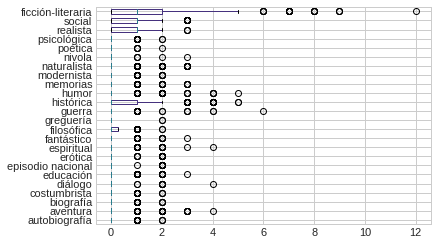

In [396]:
quantified_subgenre_df.plot.box(vert=False)

In [310]:
classification_results_linguistic_features_df.groupby("class").head(10).groupby("class").mean().sort_index()["mean_f1"]

class
autobiografía        0.704222
aventura             0.823889
biografía            0.636556
costumbrista         0.812889
diálogo              0.819111
educación            0.607111
episodio nacional    0.894111
erótica              0.881222
espiritual           0.707778
fantástico           0.679444
ficción-literaria    0.684556
filosófica           0.708667
greguería            0.944333
guerra               0.779111
histórica            0.787333
humor                0.795222
memorias             0.652444
modernista           0.734222
naturalista          0.768444
nivola               0.977778
poética              0.481444
psicológica          0.640333
realista             0.781222
social               0.676444
Name: mean_f1, dtype: float64

In [312]:
results_df.groupby("class").head(10).groupby("class").mean().sort_values(by="class")

,MFW,mean_results
class,,
autobiografía,1851.666667,-0.834500
aventura,1851.666667,-0.143667
biografía,1851.666667,-0.858667
costumbrista,1851.666667,-0.093000
diálogo,1851.666667,0.223500
educación,1851.666667,-0.598500
episodio nacional,1851.666667,-0.100833
erótica,1851.666667,-0.393167
espiritual,1851.666667,-1.365667


In [314]:
stats.pearsonr(
classification_results_linguistic_features_df.groupby("class").head(10).groupby("class").mean().sort_index()["mean_f1"],
results_df.groupby("class").head(10).groupby("class").mean().sort_values(by="class")["mean_results"]
)

(0.22902541898488415, 0.2817107153876913)

## Test with OLS

In [65]:
import statsmodels.api as sm

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [561]:
quant_rel_quantified_subgenre_df

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.5
ne0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0005,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0006,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0009,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0


In [579]:
quant_rel_quantified_subgenre_df

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.5
ne0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0005,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0006,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0009,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,...,0.0,0.5,0.0,0.0,0.0,0.5,0.5,0.0,0.0,0.2
ne0010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0


In [604]:
sm.OLS(
    quant_rel_quantified_subgenre_df["episodio nacional"],
    log_rel_tags_ling_pos_diff_mw_ord_ent_df.iloc[:,0:200],
).fit().summary().

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      episodio nacional   R-squared (uncentered):                   0.811
Model:                            OLS   Adj. R-squared (uncentered):              0.562
Method:                 Least Squares   F-statistic:                              3.259
Date:                Mon, 01 Jul 2019   Prob (F-statistic):                    9.43e-14
Time:                        10:57:53   Log-Likelihood:                          661.60
No. Observations:                 352   AIC:                                     -923.2
Df Residuals:                     152   BIC:                                     -150.5
Df Model:                         200                                                  
Covariance Type:            nonrobust                                                  
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
,@form_punctuation@pos          0.0298      0.043      0.696      0.488      -0.055       0.115
am.divs                         0.0089      0.022      0.403      0.688      -0.035       0.053
1@person                       -0.0039      0.057     -0.068      0.946      -0.117       0.110
am.verses                       0.0021      0.002      0.891      0.374      -0.003       0.007
de@form_adposition@pos         -0.1235      0.081     -1.516      0.132      -0.285       0.037
am.sps                         -0.0021      0.005     -0.452      0.652      -0.011       0.007
2@person                       -0.0270      0.021     -1.286      0.200      -0.068       0.014
am.paragraphs                   0.1886      0.115      1.639      0.103      -0.039       0.416
.@form_punctuation@pos          0.0106      0.052      0.206      0.837      -0.091       0.113
am.pds                         -0.0351      0.011     -3.265      0.001      -0.056      -0.014
abandonar@mariax                0.0179      0.022      0.798      0.426      -0.026       0.062
am.blocks                      -0.1987      0.096     -2.079      0.039      -0.387      -0.010
el@form_determiner@pos         -0.1581      0.067     -2.352      0.020      -0.291      -0.025
am.chapters                    -0.0028      0.019     -0.144      0.886      -0.041       0.035
abatir@mariax                  -0.0513      0.023     -2.263      0.025      -0.096      -0.007
am.parts                       -0.0077      0.004     -1.811      0.072      -0.016       0.001
la@form_determiner@pos          0.1466      0.072      2.023      0.045       0.003       0.290
am.sections                    -0.0019      0.004     -0.486      0.628      -0.010       0.006
abeja@mariax                    0.0077      0.014      0.535      0.594      -0.021       0.036
am.divisions                   -0.0001      0.012     -0.009      0.993      -0.023       0.023
y@form_conjunction@pos         -0.0126      0.043     -0.291      0.771      -0.098       0.073
am.narrative.ps                -0.0263      0.032     -0.818      0.414      -0.090       0.037
abrigar@mariax                  0.0054      0.015      0.363      0.717      -0.024       0.035
am.ss                          -0.0203      0.044     -0.462      0.644      -0.107       0.066
a@form_adposition@pos          -0.0162      0.032     -0.500      0.618      -0.080       0.048
abundar@mariax                 -0.0190      0.024     -0.776      0.439      -0.067       0.029
en@form_adposition@pos          0.0568      0.069      0.824      0.411      -0.079       0.193
abusar@mariax                   0.0183      0.021      0.894      0.373      -0.022       0.059
se@form_

In [ ]:
results_anno_df = regressing(wdir, features = rel_tags_ling_pos_diff_mw_ord_ent_df,
                             outputs = quant_rel_quantified_subgenre_df, classes = semantic_subgenres_lt,
                             methods_lt = ["Ridge","LR"],
                             max_MFFs = [1000,2000,5000,7000,10000,],
                             text_representations = ["log","log10-zscores","log-tfidf","binary"],
                             make_relative=False, cv=2)

## Ordinal Classification

In [98]:
ord_rel_quantified_subgenre_df = quant_rel_quantified_subgenre_df.copy().replace({0:0,0.2:1,0.5:1,1:2})

In [99]:
ord_rel_quantified_subgenre_df.head()

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0002,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,1,1,0,0,1
ne0003,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
ne0004,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,1,0,0,1
ne0005,0,0,0,0,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1


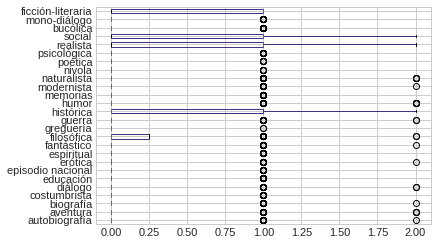

In [100]:
ord_rel_quantified_subgenre_df.astype(float).plot.box(vert=False)

In [103]:
ord_rel_quantified_subgenre_df.loc[ord_rel_quantified_subgenre_df["aventura"] == 1].head()

,autobiografía,aventura,biografía,costumbrista,diálogo,educación,episodio nacional,erótica,espiritual,fantástico,...,modernista,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria
ne0001,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,1
ne0014,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,1
ne0015,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,1
ne0020,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,1
ne0021,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,1


In [104]:
selected_semantic_subgenres_lt = []

for subgenre in ord_rel_quantified_subgenre_df.columns.tolist():
    if ord_rel_quantified_subgenre_df.loc[ord_rel_quantified_subgenre_df[subgenre] == 2].shape[0] > 1:
        print(subgenre)
        selected_semantic_subgenres_lt.append(subgenre)

aventura
diálogo
filosófica
guerra
histórica
humor
naturalista
realista
social


In [105]:
print(selected_semantic_subgenres_lt)

['aventura', 'diálogo', 'filosófica', 'guerra', 'histórica', 'humor', 'naturalista', 'realista', 'social']


In [106]:
#selected_semantic_subgenres_lt = ['aventura',  'costumbrista', 'diálogo', 'espiritual',  'filosófica',  'guerra',  'histórica',  'humor',  'naturalista',  'poética',  'realista',  'social',  'bucólica',  'mono-diálogo',  'ficción-literaria']

In [107]:
len(selected_semantic_subgenres_lt)

9

In [ ]:
ordinal_classification_results_df = classify.classify(wdir, freq_table  = metadata_anno_features_df, metadata = ord_rel_quantified_subgenre_df,
             sep = "\t", classes = selected_semantic_subgenres_lt, verbose = True, methods = ["LR"], min_MFF = 0,
             max_MFFs = [100,1000,2000, 3000, 5000,7000], text_representations = ["raw","tfidf","binary","zscores"], typographies = [True],
             sampling_mode = "cross", 
             minimal_value_samples = 2, make_relative = False,
             under_sample_method = "lpc", maximum_cases = 5000, sampling_times = 10, outdir_results = "",
             )

In [67]:
ordinal_classification_results_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
84,filosófica,0.833,0.833,0.833,0.778,0.833,0.333333,0.499667,LR,tfidf-zscores,100,True,"[0.33, 0.33, 0.33, 0.33, 0.33, 0.67, 0.33, 0.3...",8.551024e-03,ne0238 0 ne0121 2 ne0331 3 ne0057 ...,6,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
174,poética,0.833,0.833,0.833,0.778,0.833,0.333333,0.499667,LR,tfidf-zscores,100,True,"[0.33, 0.33, 0.67, 0.33, 0.0, 0.0, 0.33, 0.67,...",1.576959e-02,ne0200 2 ne0349 2 ne0321 0 ne0380 ...,6,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
227,bucólica,0.794,0.794,0.794,0.785,0.794,0.333333,0.460667,LR,log10-zscores,7000,True,"[0.67, 0.78, 0.56, 0.78, 0.5, 0.67, 0.83, 0.5,...",2.937895e-47,ne0380 1 ne0016 1 ne0053 1 ne0291 ...,72,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
17,aventura,0.778,0.778,0.778,0.704,0.778,0.333333,0.444667,LR,tfidf-zscores,7000,True,"[0.0, 0.67, 0.67, 0.67, 0.67, 1.0, 0.67, 0.33,...",1.830914e-05,ne0362 2 ne0284 2 ne0266 3 ne0335 ...,9,3,10,"LogisticRegression(C=1.0, class_weight=None, d..."
153,naturalista,0.750,0.750,0.750,0.667,0.750,0.333333,0.416667,LR,log10-zscores,3000,True,"[0.0, 0.33, 0.67, 0.0, 0.33, 0.0, 0.0, 0.67, 0...",2.274798e-01,ne0070 0 ne0028 2 ne0003 2 ne0076 ...,12,4,10,"LogisticRegression(C=1.0, class_weight=None, d..."
226,bucólica,0.750,0.750,0.750,0.723,0.750,0.333333,0.416667,LR,log10-zscores,5000,True,"[0.56, 0.78, 0.56, 0.78, 0.67, 0.67, 0.5, 0.67...",1.976329e-48,ne0122 1 ne0057 2 ne0208 0 ne0290 ...,72,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
224,bucólica,0.722,0.722,0.722,0.706,0.722,0.333333,0.388667,LR,log10-zscores,2000,True,"[0.78, 0.67, 0.67, 0.67, 0.67, 0.67, 0.83, 0.5...",2.758032e-45,ne0306 0 ne0050 2 ne0131 0 ne0048 ...,72,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
137,humor,0.722,0.722,0.722,0.648,0.722,0.333333,0.388667,LR,log10-zscores,7000,True,"[0.67, 0.0, 0.67, 0.67, 0.33, 0.67, 0.33, 0.33...",4.312118e-08,ne0159 0 ne0194 0 ne0378 2 ne0142 ...,18,6,10,"LogisticRegression(C=1.0, class_weight=None, d..."
119,histórica,0.700,0.700,0.700,0.660,0.700,0.333333,0.366667,LR,log10-zscores,7000,True,"[0.67, 0.67, 0.83, 0.33, 0.33, 1.0, 0.67, 0.0,...",6.405955e-19,ne0107 3 ne0046 0 ne0284 2 ne0007 ...,39,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."
222,bucólica,0.694,0.694,0.694,0.675,0.694,0.333333,0.360667,LR,log10-zscores,100,True,"[0.44, 0.67, 0.89, 0.89, 0.83, 0.67, 0.83, 0.3...",7.299540e-38,ne0057 2 ne0290 1 ne0022 1 ne0183 ...,72,10,10,"LogisticRegression(C=1.0, class_weight=None, d..."


In [315]:
ordinal_classification_results_df.to_csv(wdir+"ordinal_classification_results.csv", sep="\t")

In [30]:
ordinal_classification_results_df = pd.read_csv(wdir+"ordinal_classification_results.csv", sep="\t", index_col=0)

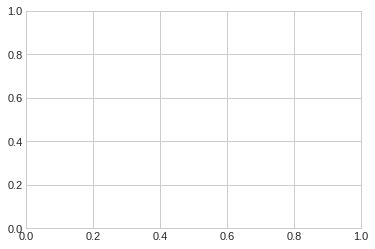

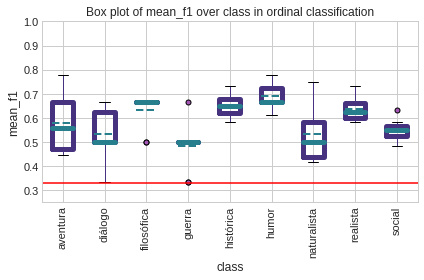

In [32]:
describe_data.boxplots(ordinal_classification_results_df.groupby(["class"]).head(10), "mean_f1", "class", wdir,"ordinal classification", rotation=90, baseline= 0.33, ylim = (0.25,1))

In [38]:
ordinal_classification_results_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(1)["mean_f1"].mean().round(2)


0.71

In [35]:
ordinal_classification_results_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean().round(2)

0.59

In [43]:
ordinal_classification_results_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].min().round(2)


0.33

In [46]:
combined_results_metadata_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
920,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,binary,5,True,[1. 1. 0. 0.67 0.67 0. 1. 1. 0.67 ...,2.454251e-03,ne0173 1\nne0259 0\nne0172 1\nne0361 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
880,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,raw,5,True,[1. 0.67 1. 1. 1. 1. 1. 1. 1. ...,1.040200e-12,ne0173 1\nne0172 1\nne0292 0\nne0256 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
940,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,zscores,5,True,[1. 1. 0.67 0.67 0.67 0.67 1. 0.67 1. ...,7.432505e-09,ne0311 0\nne0173 1\nne0172 1\nne0035 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
901,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,tfidf,10,True,[1. 1. 0.67 1. 0.67 1. 0.67 0.67 1. ...,1.981922e-08,ne0173 1\nne0172 1\nne0231 0\nne0361 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
942,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,zscores,20,True,[0.67 1. 0.67 0.67 1. 0.67 1. 1. 1. ...,1.981922e-08,ne0173 1\nne0172 1\nne0034 0\nne0156 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
902,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,tfidf,20,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,3.401422e-17,ne0172 1\nne0064 0\nne0173 1\nne0054 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
922,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,binary,20,True,[0.67 1. 0.67 0.67 1. 1. 1. 1. 1. ...,1.157872e-10,ne0173 1\nne0129 0\nne0172 1\nne0131 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
882,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,raw,20,True,[1. 0.67 1. 1. 1. 0.67 1. 1. 1. ...,6.003821e-10,ne0282 0\nne0173 1\nne0172 1\nne0061 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
903,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,tfidf,30,True,[1. 1. 1. 1. 0.67 0.67 1. 1. 1. ...,2.340440e-14,ne0172 1\nne0362 0\nne0173 1\nne0370 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."
944,greguería,1.000,1.00,1.000,1.000,1.000,0.5,0.500,LR,zscores,40,True,[0.67 1. 0.67 0.67 1. 1. 1. 0.67 1. ...,6.003821e-10,ne0173 1\nne0394 0\nne0170 0\nne0172 ...,4,2,10,"LogisticRegression(C=1.0, class_weight=None, d..."


In [57]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean().round(2)

0.83

In [62]:
round(combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean().round(2)-0.5,2)

0.33

In [60]:
ordinal_classification_results_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean().round(2)


0.59

In [63]:
round(ordinal_classification_results_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10)["mean_f1"].mean().round(2)-0.33,2)



0.26

In [318]:
ordinal_classification_results_df.groupby(["class"]).head(10).groupby(["class"]).head(1)[["class","mean_f1"]]

,class,mean_f1
9,aventura,0.778
142,humor,0.778
151,naturalista,0.750
189,realista,0.733
111,histórica,0.733
60,filosófica,0.667
24,diálogo,0.667
85,guerra,0.667
209,social,0.633


In [319]:
combined_results_metadata_df.groupby(["class"]).head(10).groupby(["class"]).head(1)[["class","mean_f1"]]

,class,mean_f1
920,greguería,1.000
1511,nivola,1.000
1934,mono-diálogo,1.000
398,diálogo,1.000
1859,bucólica,0.983
495,episodio nacional,0.967
576,erótica,0.960
730,fantástico,0.947
6,autobiografía,0.931
1034,guerra,0.927


In [320]:
combined_results_metadata_df.groupby(["class"]).head(10).groupby(["class"]).head(1)[["class","mean_f1"]].rename(columns={'mean_f1': 'classification_mean_f1'})

,class,classification_mean_f1
920,greguería,1.000
1511,nivola,1.000
1934,mono-diálogo,1.000
398,diálogo,1.000
1859,bucólica,0.983
495,episodio nacional,0.967
576,erótica,0.960
730,fantástico,0.947
6,autobiografía,0.931
1034,guerra,0.927


In [65]:
ordinal_classic_classification_results_df = pd.merge(

        combined_results_metadata_df.groupby(["class"]).head(10).groupby(["class"]).head(1)[["class","mean_f1"]].rename(columns={'mean_f1': 'classification_mean_f1'}),
        ordinal_classification_results_df.groupby(["class"]).head(10).groupby(["class"]).head(1)[["class","mean_f1"]].rename(columns={'mean_f1': 'ordinal_classification_mean_f1'}),
)


In [66]:
ordinal_classic_classification_results_df.sort_values(by="ordinal_classification_mean_f1")

,class,classification_mean_f1,ordinal_classification_mean_f1
8,social,0.721,0.633
0,diálogo,1.000,0.667
1,guerra,0.927,0.667
7,filosófica,0.767,0.667
3,histórica,0.834,0.733
6,realista,0.810,0.733
5,naturalista,0.825,0.750
2,aventura,0.906,0.778
4,humor,0.826,0.778


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


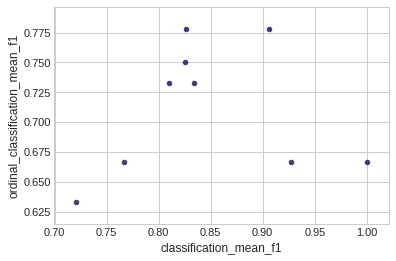

In [67]:
ordinal_classic_classification_results_df.plot.scatter("classification_mean_f1","ordinal_classification_mean_f1")

In [324]:
stats.pearsonr(
    ordinal_classic_classification_results_df.loc[~ordinal_classic_classification_results_df["class"].isin(["mono-diálogo","bucólica","ficción-literaria"])]["classification_mean_f1"],
    ordinal_classic_classification_results_df.loc[~ordinal_classic_classification_results_df["class"].isin(["mono-diálogo","bucólica","ficción-literaria"])]["ordinal_classification_mean_f1"]
)

(0.1002264390982503, 0.7975218691334818)

## Probabilities of Classification

Decomposing mixed features as components of a PCA:

In [115]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

pca = PCA(n_components=200)
pca.fit(metadata_anno_features_df.T)  
features_decomposed = pd.DataFrame(pca.components_, columns = metadata_anno_features_df.index).T

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


In [116]:
features_decomposed.shape

(352, 200)

In [117]:
bool_quantified_subgenre_df.shape

(358, 26)

In [118]:
quantified_subgenre_df.loc[new_metadata_df.index]["guerra"].shape

(352,)

In [119]:
bool_quantified_subgenre_df.loc["ne0292"][["guerra"]]

guerra    1
Name: ne0292, dtype: int64

In [120]:
quantified_subgenre_df.sum(axis=1).sort_values().tail(20)

ne0238     9.0
ne0061     9.0
ne0124    10.0
ne0224    10.0
ne0047    10.0
ne0279    10.0
ne0022    10.0
ne0275    10.0
ne0246    10.0
ne0074    10.0
ne0060    10.0
ne0118    11.0
ne0112    11.0
ne0247    11.0
ne0116    11.0
ne0109    11.0
ne0186    11.0
ne0243    12.0
ne0127    12.0
ne0069    12.0
dtype: float64

Exploring the texts and their correlations:

In [121]:
for text_id in new_metadata_df.index.tolist():

    #text_id = "ne0224"
    print(new_metadata_df.loc[[text_id]][["title","author.name"]])
    rel_quantified_subgenre_one_text_df = rel_quantified_subgenre_df.loc[[text_id]].T
    rel_quantified_subgenre_one_text_df = rel_quantified_subgenre_one_text_df.rename(columns={text_id: "proportion-sources"})
    rel_quantified_subgenre_one_text_df["predicted"] = 0
    rel_quantified_subgenre_one_text_df

    index_lt = features_decomposed.index.tolist()
    index_lt.remove(text_id)


    for subgenre_st in bool_quantified_subgenre_df.columns.tolist():

        #print(subgenre_st)
        #X_train, X_test, y_train, y_test = train_test_split(log_rel_tags_ling_pos_diff_mw_ord_ent_df.iloc[:,0:2000], bool_subgenres_df[[subgenre_st]])
        index_lt = features_decomposed.index.tolist()
        logreg = LogisticRegression().fit(features_decomposed.loc[index_lt], bool_quantified_subgenre_df.loc[index_lt][[subgenre_st]])
        rel_quantified_subgenre_one_text_df.loc[subgenre_st,"predicted"] = round(logreg.predict_proba(features_decomposed.loc[[text_id]])[0][1],2)
    rel_quantified_subgenre_one_text_df.sort_values(by="predicted")

    print(stats.linregress(rel_quantified_subgenre_one_text_df["proportion-sources"].astype(float), rel_quantified_subgenre_one_text_df["predicted"].astype(float)))

            title author.name
ne0001  Mayorazgo      Baroja
LinregressResult(slope=1.1354285714285717, intercept=0.09952380952380953, rvalue=0.8003645901249238, pvalue=9.167549136239451e-07, stderr=0.17360624773233452)
               title author.name
ne0002  Misericordia      Galdos
LinregressResult(slope=1.2352432432432434, intercept=0.08724324324324323, rvalue=0.8671957340664413, pvalue=9.923413363778034e-09, stderr=0.1447873666578195)
          title author.name
ne0003  Nazarin      Galdos
LinregressResult(slope=1.0195348837209306, intercept=0.11848837209302326, rvalue=0.6451045920312007, pvalue=0.00037338569721460767, stderr=0.24649793365502304)
        title author.name
ne0004  Halma      Galdos
LinregressResult(slope=0.9817857142857145, intercept=0.12258928571428572, rvalue=0.6854175865321199, pvalue=0.00011153298136013538, stderr=0.2129005703342278)
           title author.name
ne0005  Tristana      Galdos
LinregressResult(slope=0.9161290322580651, intercept=0.10645161290322577

LinregressResult(slope=1.4432142857142851, intercept=0.11410714285714288, rvalue=0.7565431748028643, pvalue=7.757138480597829e-06, stderr=0.25464307628722305)
        title author.name
ne0042  Vivir        Miro
LinregressResult(slope=1.0369924812030074, intercept=0.1078947368421053, rvalue=0.6589993552486492, pvalue=0.00025116791464796246, stderr=0.24159375595706936)
         title author.name
ne0043  Nomada        Miro
LinregressResult(slope=0.5767346938775512, intercept=0.1196938775510204, rvalue=0.5741839229495322, pvalue=0.002159199906582698, stderr=0.1678642413671812)
        title author.name
ne0044  Amigo        Miro
LinregressResult(slope=0.8378947368421049, intercept=0.12052631578947372, rvalue=0.5720331137077004, pvalue=0.0022634285180173517, stderr=0.24524411814186628)
            title author.name
ne0045  PalmaRota        Miro
LinregressResult(slope=1.4854545454545458, intercept=0.10863636363636363, rvalue=0.7567736652377762, pvalue=7.679492787936251e-06, stderr=0.261909311

KeyboardInterrupt: 

Comparing the proportions of sources and the predicted probabilities:

In [122]:
# Buenos: ne0145, ne0126, ne0325, ne0030, ne0022, ne0014
text_id = "ne0022"
print(new_metadata_df.loc[[text_id]][["title","author.name"]])
rel_quantified_subgenre_one_text_df = rel_quantified_subgenre_df.loc[[text_id]].T
rel_quantified_subgenre_one_text_df = rel_quantified_subgenre_one_text_df.rename(columns={text_id: "proportion-sources"})
rel_quantified_subgenre_one_text_df["predicted-probabilities"] = 0
rel_quantified_subgenre_one_text_df



                   title author.name
ne0022  GerifaltesAntano       Valle


,proportion-sources,predicted-probabilities
autobiografía,0,0
aventura,0.5,0
biografía,0,0
costumbrista,0,0
diálogo,0,0
educación,0,0
episodio nacional,0,0
erótica,0,0
espiritual,0.25,0
fantástico,0,0


Calculating the regression and correlation of the both variables across subgenres:

In [123]:
index_lt = features_decomposed.index.tolist()
index_lt.remove(text_id)


for subgenre_st in bool_quantified_subgenre_df.columns.tolist():

    #print(subgenre_st)
    #X_train, X_test, y_train, y_test = train_test_split(log_rel_tags_ling_pos_diff_mw_ord_ent_df.iloc[:,0:2000], bool_subgenres_df[[subgenre_st]])
    index_lt = features_decomposed.index.tolist()
    logreg = LogisticRegression().fit(features_decomposed.loc[index_lt], bool_quantified_subgenre_df.loc[index_lt][[subgenre_st]])
    rel_quantified_subgenre_one_text_df.loc[subgenre_st,"predicted-probabilities"] = round(logreg.predict_proba(features_decomposed.loc[[text_id]])[0][1],2)
rel_quantified_subgenre_one_text_df.sort_values(by="predicted-probabilities")

print(stats.linregress(rel_quantified_subgenre_one_text_df["proportion-sources"].astype(float), rel_quantified_subgenre_one_text_df["predicted-probabilities"].astype(float)))

LinregressResult(slope=0.9281818181818182, intercept=0.09613636363636364, rvalue=0.7367506814049318, pvalue=1.7705172113221967e-05, stderr=0.1738838537132918)


In [124]:
rel_quantified_subgenre_one_text_df

,proportion-sources,predicted-probabilities
autobiografía,0,0.08
aventura,0.5,0.24
biografía,0,0.08
costumbrista,0,0.05
diálogo,0,0.05
educación,0,0.16
episodio nacional,0,0.04
erótica,0,0.05
espiritual,0.25,0.18
fantástico,0,0.07


Comparison between proportion of sources and predicted probabilities:

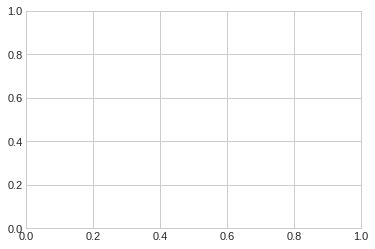

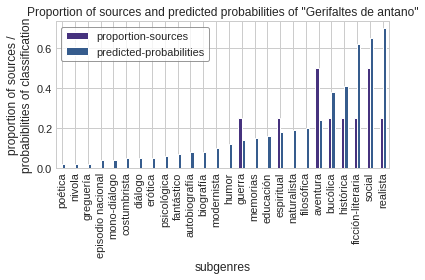

In [125]:
fig  = plt.subplots()

fig = rel_quantified_subgenre_one_text_df.sort_values(by="predicted-probabilities").plot.bar(title = 'Proportion of sources and predicted probabilities of "Gerifaltes de antano"')
fig.set_ylabel("proportion of sources /\nprobabiblities of classification")
fig.set_xlabel("subgenres")
#    plt.title(r"Box plot of " + class_ + " over "+ class_by +" in "+dataset)

plt.legend(loc="upper left", frameon=True, edgecolor="gray")

plt.tight_layout()
fig.get_figure().savefig(wdir+"/visualisations/predict-probabilities-proportion-labels.png", dpi=300, format="png")
plt.show(fig)


In [126]:
new_metadata_df.loc[["ne0066","ne0037","ne0114"]]

,idno,author.name,title,year,supergenre,genre,subgenre.cligs.important,author.country,author.viaf,author.bne,...,naturalista,nivola,poética,psicológica,realista,social,bucólica,mono-diálogo,ficción-literaria,mean.prop.subgenres
ne0066,ne0066,Baroja,Zalacain,1904,narrative,novela,adventure,Spain,36912891.0,XX842743,...,0,0,0,0,1,1,0,0,1,0.076923
ne0037,ne0037,Valle,MediaNoche,1917,narrative,?,historical,Spain,68936773.0,XX1055436,...,0,0,0,0,1,1,1,0,1,0.057692
ne0114,ne0114,Unamuno,PazGuerra,1897,narrative,novela,historical,Spain,88844103.0,XX1139151,...,0,0,0,0,1,0,0,0,1,0.089744


Regression and correlation test on each subgenre:

In [135]:
from sklearn.model_selection import train_test_split
results_lt = []

for subgenre_st in bool_quantified_subgenre_df.columns.tolist():

    #print(subgenre_st)
    #X_train, X_test, y_train, y_test = train_test_split(log_rel_tags_ling_pos_diff_mw_ord_ent_df.iloc[:,0:2000], bool_subgenres_df[[subgenre_st]])

    logreg = LogisticRegression().fit(features_decomposed, bool_quantified_subgenre_df.loc[new_metadata_df.index][[subgenre_st]])

    probabilities_df = pd.DataFrame(logreg.predict_proba(features_decomposed)).astype(float)
    sources_df = quantified_subgenre_df.loc[new_metadata_df.index][subgenre_st].astype(float)
    #print(probabilities_df.shape, sources_df.shape)
    results_linregress = stats.linregress(probabilities_df.iloc[:,1], sources_df)
    #quantified_subgenre_df
    results_lt.append([subgenre_st]+ list(results_linregress))
    
results_probabilities_df = pd.DataFrame(results_lt, columns = ["subgenre", "slope", "intercept", "r-value", "pvalue", "stderr"]).sort_values(by="r-value")
results_probabilities_df.index = results_probabilities_df["subgenre"]

In [136]:
results_probabilities_df.round(3)

,subgenre,slope,intercept,r-value,pvalue,stderr
subgenre,,,,,,
guerra,guerra,21.753,-1.359,0.731,0.0,1.086
social,social,6.095,-2.582,0.737,0.0,0.299
histórica,histórica,9.872,-2.650,0.772,0.0,0.435
costumbrista,costumbrista,18.607,-0.947,0.780,0.0,0.798
realista,realista,6.601,-3.339,0.780,0.0,0.283
naturalista,naturalista,9.807,-1.996,0.812,0.0,0.376
educación,educación,7.717,-1.343,0.815,0.0,0.294
humor,humor,12.469,-1.589,0.832,0.0,0.445
espiritual,espiritual,13.080,-1.225,0.836,0.0,0.459


In [138]:
results_probabilities_df["r-value"] = results_probabilities_df["r-value"].astype(float)

Correlation of predicted values and proportions of sources in each subgenre:

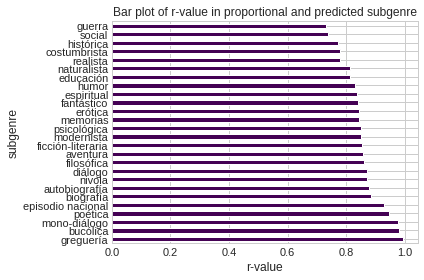

In [141]:
describe_data.simple_bars(results_probabilities_df["r-value"], "r-value", wdir, "proportional and predicted subgenre")

Median of correlation score:

In [142]:
results_probabilities_df["r-value"].median()

0.8503524344441808

In [124]:
combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean().sort_index()

,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,MFW,typography,test_result_pvalue,sample_size,cv,sampling_times
class,,,,,,,,,,,,,
autobiografía,0.9033,0.8998,0.9337,0.9031,0.9067,0.5,0.4033,222.0,True,2.632221e-33,52.0,10.0,10.0
aventura,0.8560,0.8455,0.8852,0.8584,0.8604,0.5,0.3560,3450.0,True,2.501007e-41,98.0,10.0,10.0
biografía,0.8360,0.8501,0.8565,0.8350,0.8415,0.5,0.3360,219.0,True,4.840165e-19,60.0,10.0,10.0
bucólica,0.9605,0.9558,0.9699,0.9613,0.9615,0.5,0.4605,4700.0,True,4.823476e-93,174.0,10.0,10.0
costumbrista,0.8740,0.9000,0.8818,0.8608,0.8750,0.5,0.3740,2225.0,True,5.526381e-06,32.0,10.0,10.0
diálogo,0.9387,0.9300,0.9768,0.9387,0.9450,0.5,0.4387,2404.0,True,4.225721e-09,28.0,10.0,10.0
educación,0.7699,0.7641,0.8014,0.7735,0.7778,0.5,0.2699,844.0,True,2.059616e-27,140.0,10.0,10.0
episodio nacional,0.9141,0.9350,0.9101,0.9106,0.9300,0.5,0.4141,2640.0,True,1.037648e-10,22.0,10.0,10.0
erótica,0.8729,0.9350,0.8618,0.8225,0.8500,0.5,0.3729,2900.0,True,2.677785e-12,34.0,10.0,10.0


Scatter plot between the r (of predicted and observed values) and the results of the classification:

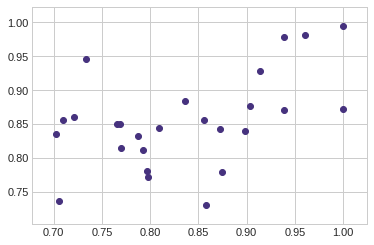

In [147]:
plt.scatter(
    combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean().sort_index()["mean_f1"],
    results_probabilities_df["r-value"].sort_index()
           )

In [148]:
stats.pearsonr(
    combined_results_metadata_df.sort_values(by="mean_f1",ascending=False).groupby(["class"]).head(10).groupby(["class"]).mean().sort_index()["mean_f1"],
    results_probabilities_df["r-value"].sort_index()
)

(0.49104008789589815, 0.010857053238719527)